In [13]:
import IPython

IPython.Application.instance().kernel.do_shutdown(True)

{'status': 'ok', 'restart': True}

In [1]:
import gc
import warnings
warnings.filterwarnings('ignore')

In [2]:
import os
import ephem
import cmocean
import datetime
import numpy as np
import seaborn as sns
from scipy import signal
from IPython import display
from itertools import product
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from matplotlib.colors import LogNorm, DivergingNorm, SymLogNorm, Normalize

sns.set()
sns.set_style("ticks")

In [3]:
from spectral_analysis.common_vars.time_slices import idx_t
from spectral_analysis.common_vars.directories import LUIGI_OUT_FOLDER,POSTPROCESS_OUT_FOLDER
from spectral_analysis.common_vars.regions import ids_regions,lats4id,lons4id,faces_regions
from spectral_analysis.isotropic_spectra.spectral_kinema import spectral_kinematics
from spectral_analysis.isotropic_spectra.isotropic import calc_ispec
from spectral_analysis.luigi_workflows.llc_region import LLCRegion
from spectral_analysis.luigi_workflows.output import theta4idt,Theta4id,uv4idt,UV4id,heatFlux4idt,HF4id,hbl4idt,KPPhbl4id,VorticityGrid,Tau4id,tau4idt

In [4]:
def ensure_dir(file_path):
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)

In [5]:
spectra_folder= POSTPROCESS_OUT_FOLDER+"/wk_spectra"
spectra_fn_fmt = "{folder}/{id}_{season}_{t_res}.npz"

def spectra_exists(rid,season,t_res="hours"):
    spectra_fn = spectra_fn_fmt.format(folder=spectra_folder, id=rid, season=season, t_res=t_res)
    logging.debug("{}: {} -- Filename {}".format(rid,season,spectra_fn))
    return os.path.exists(spectra_fn)

def save_spectra(spec,rid,season,t_res="hours"):
    spectra_fn = spectra_fn_fmt.format(folder=spectra_folder, id=rid, season=season, t_res=t_res)
    logging.debug("{}: {} -- Filename {}".format(rid,season,spectra_fn))
    ensure_dir(spectra_fn)
    np.savez_compressed(spectra_fn,**spec)
    spec_vars = [k for k in spec.keys()]
    logging.info("Saved spectra {}".format(spectra_fn))
    logging.info("Variables: {}".format(spec_vars))
    
def load_spectra(rid,season,t_res="hours"):
    spectra_fn = spectra_fn_fmt.format(folder=spectra_folder, id=rid, season=season, t_res=t_res)
    logging.debug("{}: {} -- Opening {}".format(rid,season,spectra_fn))
    return np.load(spectra_fn)

def ensure_spectra(rid,season,t_res="hours"):
    if spectra_exists(rid,season,t_res=t_res):
        logging.info("Spectra file exists. Skipping.")
    else:
        spectra_tmp = {}
        logging.info("File not found. Calculating...")
        region = LLCRegion(rid, idx_t[t_res][season], tag=season)
        grid = region.getGrid()
        region.loadHorizontalVector("U", "V", "uv",t_firstaxis=False)
        utest,vtest = region.get("uv")
        #utest,vtest = UV4id(rid,idx_t[t_res][season],0)
        KE,RV,DIV,k,l,om = spectral_kinematics(utest,vtest,2,2,1)
        ki,KEi = calc_ispec(KE,k,l,om)
        ki,RVi = calc_ispec(RV,k,l,om)
        ki,DIVi = calc_ispec(DIV,k,l,om)
        spectra_tmp["om"] = om
        spectra_tmp["k_h"] = ki
        spectra_tmp["KE"] = KEi
        spectra_tmp["KE_RV"] = RVi
        spectra_tmp["KE_DIV"] = DIVi

        ## Integral in frequency domain
        dom = om[1]-om[0]
        spectra_tmp["KE_k"] = KEi.sum(axis=1)*dom
        spectra_tmp["RV_k"] = RVi.sum(axis=1)*dom
        spectra_tmp["DIV_k"] = DIVi.sum(axis=1)*dom

        # Save
        save_spectra(spectra_tmp,rid,season,t_res=t_res)

In [6]:
import logging
logging.basicConfig(
    format="%(asctime)s %(levelname)-8s %(message)s",
    level=logging.DEBUG,
    datefmt="%Y-%m-%d %H:%M:%S")

#logging.getLogger("matplotlib.font_manager").setLevel(logging.WARNING)
logging.getLogger('matplotlib.font_manager').disabled = True
logging.getLogger('matplotlib.colorbar').disabled = True
logging.getLogger('matplotlib.ticker').disabled = True

In [7]:
logging.getLogger().setLevel(logging.INFO)

## $\omega$-k de la parte rotacional y divergente de KE

In [8]:
cmap_ranges = {
    "KE": [1e-5,1e-2],
    "RV": [1e-12,1e-10],
    "DIV": [1e-12,1e-10],
    "RVDIV": [0.1,10]
}

In [9]:
from shapely.geometry import LineString

In [10]:
def intersection(pa1,pa2,pb1,pb2):
    lineA = LineString([pa1,pa2])
    lineB = LineString([pb1,pb2])
    intersection = lineA.intersection(lineB)
    return intersection.x,intersection.y

In [11]:
def ab_intersection(A,B,x=None):
    if x is None:
        x = [x for x in range(len(A))]
    diff = A-B
    sign = np.sign(diff)
    sign_change = (np.roll(sign,1)-sign) != 0
    sign_change[0] = False
    #print(sign_change)
    #print(len(diff))
    num_int = 0
    ints = []
    for i,ch in enumerate(sign_change[1:]):
        #print(i,ch,x[i],diff[i],x[i+1],diff[i+1])
        if(ch):
            num_int += 1
            int_x,int_y = intersection((x[i],A[i]),(x[i+1],A[i+1]),(x[i],B[i]),(x[i+1],B[i+1]))
            #print("\t\t",int_x,int_y)
            #plt.plot(int_x,int_y,'X',label='int {}'.format(num_int))
            ints.append((int_x,int_y))
    if num_int==0:
        min_idx = np.argmin(np.abs(diff))
        int_x,int_y = x[min_idx],diff[min_idx]
        #plt.axvline(x=int_x,label='* int ')
        ints.append((int_x,int_y))
    return diff,ints

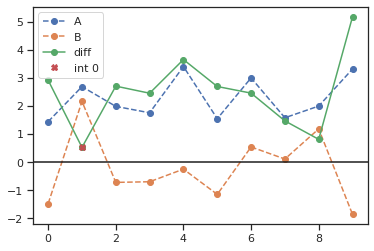

In [12]:
## Testing ab_intersection with random data
a = np.random.randn(10)+2
b = np.random.randn(10)
plt.figure()
plt.plot(a,'--o',label='A')
plt.plot(b,'--o',label='B')
diff,ints = ab_intersection(a,b)
plt.plot(diff,'-o',label='diff')
for intx,inty in ints:
    plt.plot(intx,inty,'X',label='int {}'.format(0))
plt.legend()
plt.axhline(y=0,color='k')
plt.show()

In [13]:
def wk_spec(current):
    for rid in ids_regions[current]:
        for season in ["ASO","JFM"]:
            ensure_spectra(rid,season)

In [14]:
%matplotlib inline
xlims = [1/150,1/8]
xticks = [1/10,1/25,1/50,1/80,1/150]
xticksLabel = ['10','25','50','80','150']
yticks = [1/3,1/6,1/12,1/24,1/(24*7),1/(24*30)]
yticksLabel = ['3 h','6 h','12 h','1 d','1 w','1 mo']
# Lt plots
xticks_ = [1/10,1/20,1/30,1/40,1/50,1/75,1/100,1/150]
xticksLabel_ = ['10','20','30','40','50','75','100','150']

def plot_spectra(current):
    for rid in ids_regions[current]:
        for season in ["ASO","JFM"]:
            logging.info("{} ({}): {}".format(rid,current,season))
            # Loading
            ensure_spectra(rid,season)
            spectra_tmp = load_spectra(rid,season)
            om = spectra_tmp["om"]
            ki = spectra_tmp["k_h"] #spectra_tmp["k_h"][2:] if rid==572 else spectra_tmp["k_h"]
            KEi = spectra_tmp["KE"] # spectra_tmp["KE"][1:,:] if rid==730 else spectra_tmp["KE"]
            RVi = spectra_tmp["KE_RV"] # spectra_tmp["KE_RV"][1:,:] if rid==730 else spectra_tmp["KE_RV"]
            DIVi = spectra_tmp["KE_DIV"] #spectra_tmp["KE_DIV"][1:,:] if rid==730 else spectra_tmp["KE_DIV"]
            logging.info("Shapes iso: om {}, ki {}, KE {}, RV {}, DIV {}".format(om.shape, ki.shape, KEi.shape, RVi.shape, DIVi.shape))
            fig, ax = plt.subplots(1,4,figsize=(20,4))
            ax = ax.flat[:]
            ## KE
            plt.sca(ax[0])
            plt.pcolormesh(ki,om,(om*KEi).T*ki,norm = colors.LogNorm(),cmap='nipy_spectral_r')
            plt.clim(cmap_ranges["KE"])
            plt.xscale('log')
            plt.xticks(xticks,xticksLabel)
            #plt.xlim([ki[1],ki[-1]/2.5])
            plt.xlim(xlims)
            plt.yscale('log')
            plt.ylim([om[1],om[-100]])
            plt.yticks(yticks,yticksLabel)
            plt.colorbar()
            plt.title("KE: "+season)
            ## RV
            plt.sca(ax[1])
            plt.pcolormesh(ki,om,(om*RVi).T*ki,norm = colors.LogNorm(),cmap='nipy_spectral_r')
            plt.clim(cmap_ranges["KE"])
            plt.xscale('log')
            plt.xticks(xticks,xticksLabel)
            #plt.xlim([ki[1],ki[-1]/2.5])
            plt.xlim(xlims)
            plt.yscale('log')
            plt.ylim([om[1],om[-100]])
            plt.yticks(yticks,yticksLabel)
            plt.colorbar()
            plt.title("$KE_{RV}$: "+season)
            ## DIV
            plt.sca(ax[2])
            plt.pcolormesh(ki,om,(om*DIVi).T*ki,norm = colors.LogNorm(),cmap='nipy_spectral_r')
            plt.clim(cmap_ranges["KE"])
            plt.xscale('log')
            plt.xticks(xticks,xticksLabel)
            #plt.xlim([ki[1],ki[-1]/2.5])
            plt.xlim(xlims)
            plt.yscale('log')
            plt.ylim([om[1],om[-100]])
            plt.yticks(yticks,yticksLabel)
            plt.colorbar()
            plt.title("$KE_{DIV}$: "+season)
            ## RV/DIV
            plt.sca(ax[3])
            RVDIV = RVi/DIVi
            minRVDIV = np.log10(np.min(RVDIV))
            maxRVDIV = np.log10(np.max(RVDIV))
            limExp = min(np.abs(minRVDIV),maxRVDIV)
            lims = (10**(-limExp),10**limExp)
            plt.pcolormesh(ki,om,(RVDIV).T,norm = colors.LogNorm(vmin=lims[0],vmax=lims[1],clip=True),cmap=plt.cm.BrBG)
            #plt.clim(cmap_ranges["RVDIV"])
            plt.xscale('log')
            plt.xticks(xticks,xticksLabel)
            #plt.xlim([ki[1],ki[-1]/2.5])
            plt.xlim(xlims)
            plt.yscale('log')
            plt.ylim([om[1],om[-100]])
            plt.yticks(yticks,yticksLabel)
            plt.colorbar()
            plt.title("$RV/DIV$: "+season)
            ## Show
            plt.show()
            plt.close()

        # See https://stackoverflow.com/questions/34486642/what-is-the-currently-correct-way-to-dynamically-update-plots-in-jupyter-ipython
        with sns.axes_style("whitegrid"):
            fig, ax = plt.subplots(1,2,figsize=(15,5))
            ax = ax.flat[:]
            for i,season in enumerate(["ASO","JFM"]):
                # Loading
                spectra_tmp = load_spectra(rid,season)
                # Plotting
                plt.sca(ax[i])
                ki = spectra_tmp["k_h"] # spectra_tmp["k_h"][2:] if rid==572 else spectra_tmp["k_h"]
                KEk = spectra_tmp["KE_k"] # spectra_tmp["KE_k"][1:] if rid==730 else spectra_tmp["KE_k"]
                RVk = spectra_tmp["RV_k"] # spectra_tmp["RV_k"][1:] if rid==730 else spectra_tmp["RV_k"]
                DIVk = spectra_tmp["DIV_k"] # spectra_tmp["DIV_k"][1:] if rid==730 else spectra_tmp["DIV_k"]
                logging.info("Shapes k_h: ki {}, KE {}, RV {}, DIV {}".format(ki.shape, KEk.shape, RVk.shape, DIVk.shape))
                plt.loglog(ki,KEk,'--',label='$KE$')
                plt.loglog(ki,RVk,label='$KE_{RV}$')
                plt.loglog(ki,DIVk,label='$KE_{DIV}$')
                _,intersects = ab_intersection(RVk,DIVk,ki)
                for intx,inty in intersects:
                    #plt.axvline(x=intx,ls='--',c='gray',alpha=0.5)
                    print("Candidate Lt ({}): {}".format(season,1/intx))
                plt.xscale('log')
                plt.yscale('log')
                plt.xticks(xticks_,xticksLabel_)
                plt.xlim(xlims)
                plt.legend(["$KE$","$KE_{RV}$","$KE_{DIV}$"], prop={'size': 'large'})
                plt.xlabel("Horizontal wavelength [km]",size='xx-large')
                plt.ylabel("Power spectral density",size='xx-large')
                #plt.title(season)
            did = display.display(fig,display_id=True)

            for i,season in enumerate(["ASO","JFM"]):
                # Loading -- We assume all files already exist. Else, previous steps should be executed.
                logging.debug("Loading {} - {}".format(rid,season))
                spectra_tmp = dict(load_spectra(rid,season))
                # Check whether Lt exists
                try:
                    Lt = spectra_tmp["Lt_km"]
                    if Lt is None:
                        raise Exception("No Lt")
                except Exception as err:
                    Lt = float(input("Lt for {}/{}: ".format(rid,season)))
                    spectra_tmp["Lt_km"] = Lt
                    # We overwrite the file to include Lt as well
                    save_spectra(spectra_tmp,rid,season)
                plt.sca(ax[i])
                plt.axvline(x=1/Lt,color='r')
                #plt.title("{}: Lt = {} km".format(season,Lt),size='large')
                did.update(fig)
            if rid==709: # ONLY useful for 2021 paper
                fig.savefig("figs/Lt_{}.eps".format(rid), bbox_inches='tight')
            plt.clf()
            plt.close()

In [53]:
for current in ["California","Canarias","Peru","Benguela"]:
    wk_spec(current)

2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra file exists. Skipping.
2021-07-23 09:35:59 INFO     Spectra fil

2021-07-23 09:38:09 INFO     771 (Canarias): ASO
2021-07-23 09:38:09 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:09 INFO     Shapes iso: om (1105,), ki (143,), KE (143, 1105), RV (143, 1105), DIV (143, 1105)


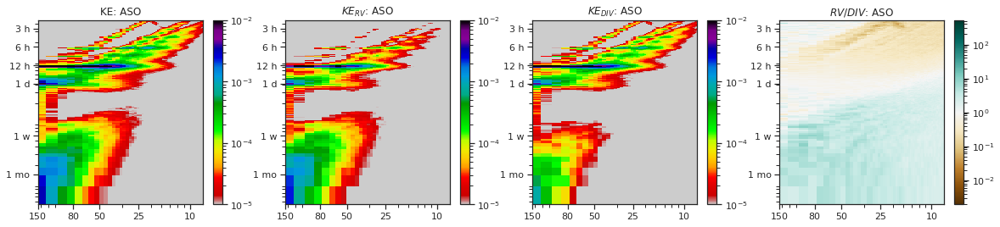

2021-07-23 09:38:11 INFO     771 (Canarias): JFM
2021-07-23 09:38:11 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:11 INFO     Shapes iso: om (1093,), ki (143,), KE (143, 1093), RV (143, 1093), DIV (143, 1093)


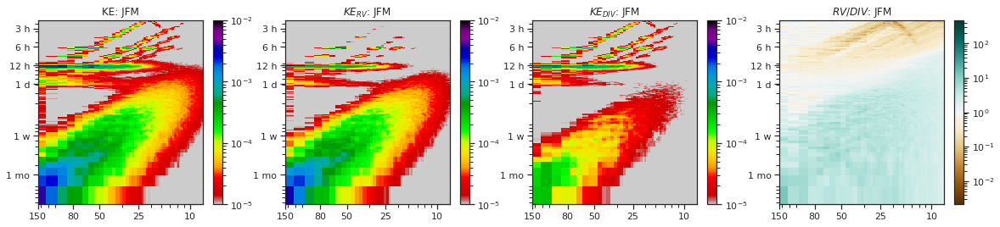

2021-07-23 09:38:14 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)
2021-07-23 09:38:14 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)


Candidate Lt (ASO): 70.0619948957083
Candidate Lt (JFM): 4.772021429301176


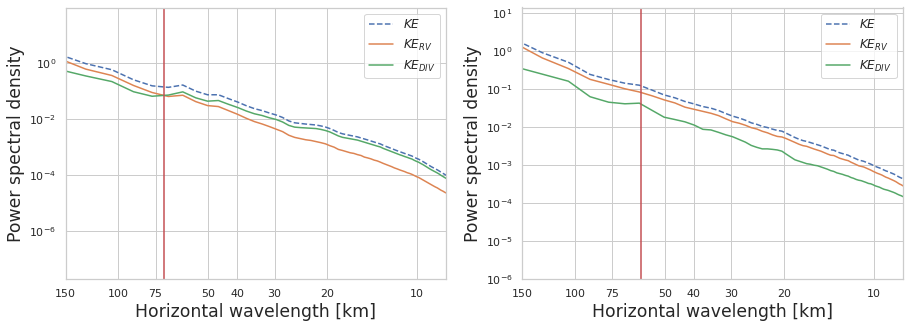

2021-07-23 09:38:18 INFO     750 (Canarias): ASO
2021-07-23 09:38:18 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:18 INFO     Shapes iso: om (1105,), ki (143,), KE (143, 1105), RV (143, 1105), DIV (143, 1105)


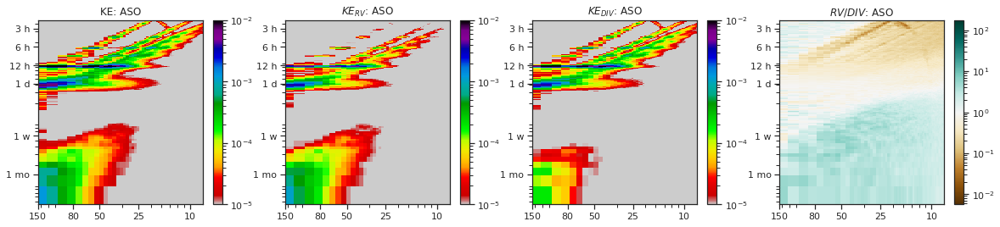

2021-07-23 09:38:20 INFO     750 (Canarias): JFM
2021-07-23 09:38:20 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:20 INFO     Shapes iso: om (1093,), ki (143,), KE (143, 1093), RV (143, 1093), DIV (143, 1093)


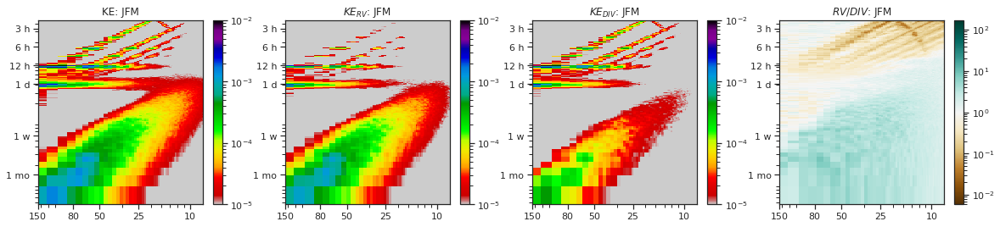

2021-07-23 09:38:23 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)
2021-07-23 09:38:23 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)


Candidate Lt (ASO): 404.22782997976395
Candidate Lt (ASO): 73.42026473002977
Candidate Lt (JFM): 246.37851531174226
Candidate Lt (JFM): 4.9877274828315015
Candidate Lt (JFM): 4.976483640426815
Candidate Lt (JFM): 4.88463052655279


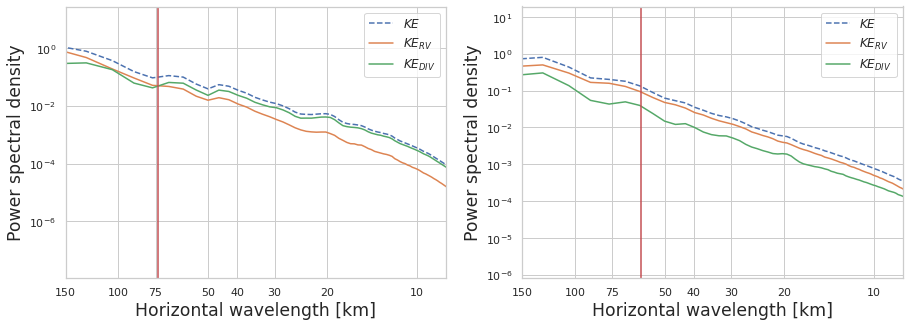

2021-07-23 09:38:27 INFO     730 (Canarias): ASO
2021-07-23 09:38:27 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:27 INFO     Shapes iso: om (1105,), ki (143,), KE (143, 1105), RV (143, 1105), DIV (143, 1105)


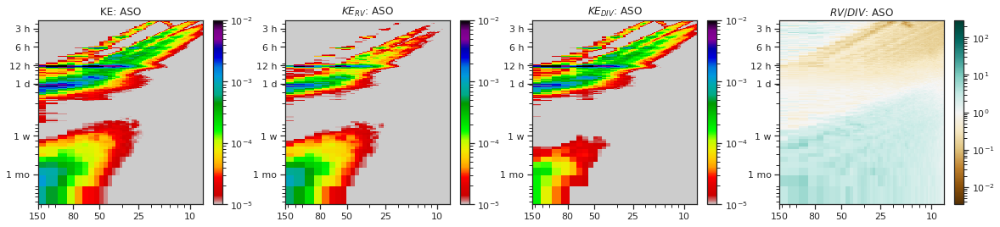

2021-07-23 09:38:29 INFO     730 (Canarias): JFM
2021-07-23 09:38:29 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:29 INFO     Shapes iso: om (1093,), ki (143,), KE (143, 1093), RV (143, 1093), DIV (143, 1093)


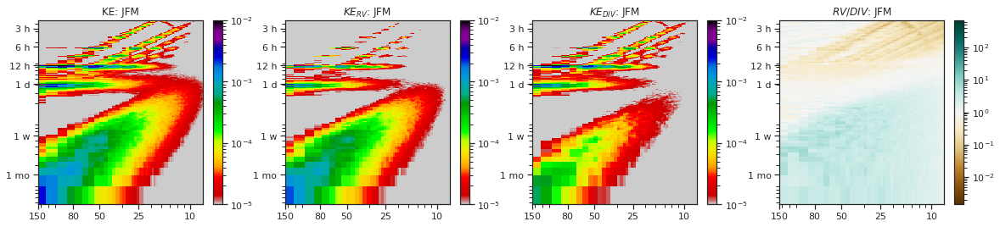

2021-07-23 09:38:32 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)
2021-07-23 09:38:32 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)


Candidate Lt (ASO): 261.99684036229684
Candidate Lt (ASO): 122.66612960829927
Candidate Lt (JFM): 248.33542681216505
Candidate Lt (JFM): 5.947648294250062
Candidate Lt (JFM): 5.8878830228067
Candidate Lt (JFM): 5.863555909064488


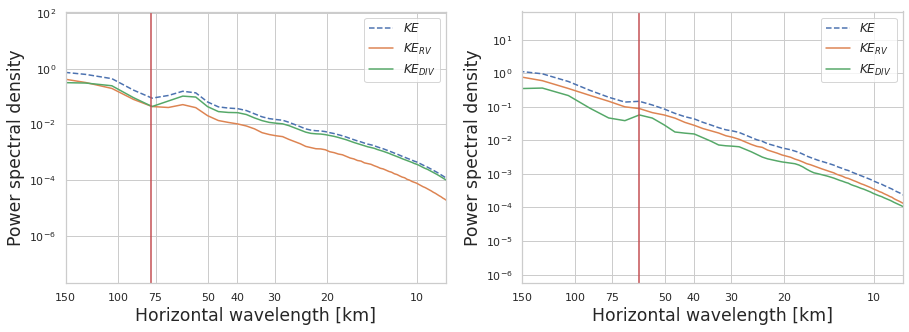

2021-07-23 09:38:36 INFO     709 (Canarias): ASO
2021-07-23 09:38:36 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:36 INFO     Shapes iso: om (1105,), ki (143,), KE (143, 1105), RV (143, 1105), DIV (143, 1105)


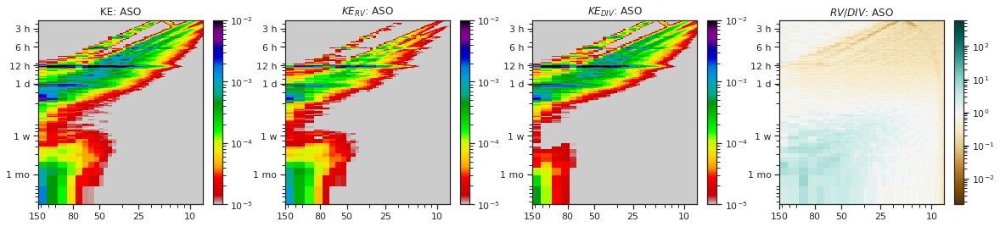

2021-07-23 09:38:39 INFO     709 (Canarias): JFM
2021-07-23 09:38:39 INFO     Spectra file exists. Skipping.
2021-07-23 09:38:39 INFO     Shapes iso: om (1093,), ki (143,), KE (143, 1093), RV (143, 1093), DIV (143, 1093)


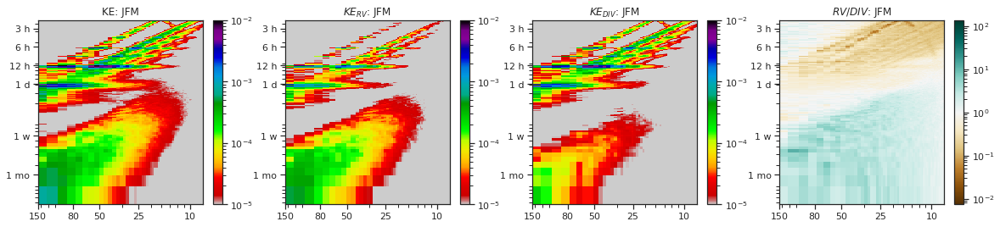

2021-07-23 09:38:41 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)
2021-07-23 09:38:41 INFO     Shapes k_h: ki (143,), KE (143,), RV (143,), DIV (143,)


Candidate Lt (ASO): 609.452084192361
Candidate Lt (ASO): 129.32513721338228
Candidate Lt (JFM): 256.7172032235668
Candidate Lt (JFM): 66.59408605411194


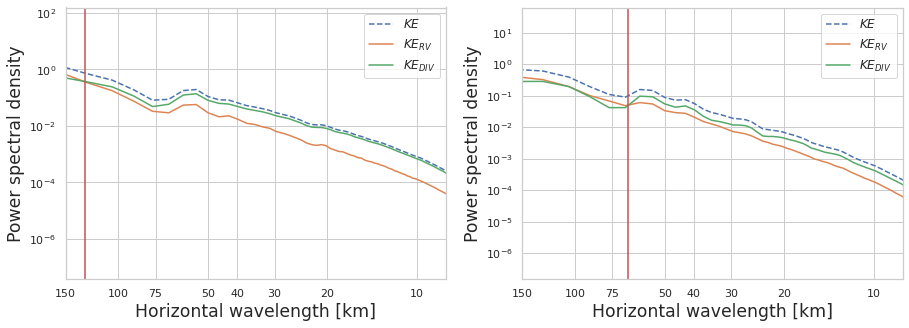

2021-07-23 09:38:46 WARNING  The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2021-07-23 09:38:46 WARNING  The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2021-07-23 09:38:46 WARNING  The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.
2021-07-23 09:38:46 WARNING  The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


SAVED 709


In [56]:
#for current in ["California","Canarias","Peru","Benguela"]:
for current in ["Canarias"][-1:]:
    plot_spectra(current)

### Calculamos RV y DIV para escalas mayores y menores a $L_t$

In [15]:
def kxky(dx,dy,shape):
    Ny,Nx = shape[-2:] # Se toman las últimas 2
    logging.info("kxky -- Nx: {}, Ny: {}".format(Nx,Ny))
    Lx = Nx*dx
    Ly = Ny*dy
    logging.info("kxky -- Lx: {}, Ly: {}".format(Lx,Ly))
    delta_kx = 1/Lx
    delta_ky = 1/Ly
    N_kx = (Nx-1)/2
    N_ky = (Ny-1)/2
    Kx = delta_kx*np.arange(-N_kx,N_kx+1)
    Ky = delta_ky*np.arange(-N_ky,N_ky+1)
    return np.meshgrid(Kx,Ky)

def create_filter_k(Lt_km=50,order=0,k_=None,flip=False): #Orden 0 es el filtro ideal, de 1 de adelante es el Butterworth
    K_max = 1/Lt_km
    kx_,ky_ = k_

    if order==0:
        filter_mask_plt = (np.square(kx_)+np.square(ky_) <= K_max**2).astype(np.float32)
    else:
        with np.errstate(over='ignore'):
            filter_mask_plt = 1/( 1 + ( (np.square(kx_)+np.square(ky_))/(K_max**2) )**order )

    filter_mask = np.fft.fftshift(filter_mask_plt)

    if flip:
        filter_mask = filter_mask*np.fliplr(filter_mask) # Simetria en Kx
        filter_mask = filter_mask*np.flipud(filter_mask) # Simetria en Ky

    #plt.figure()
    #plt.pcolormesh(kx_,ky_,np.fft.fftshift(filter_mask))
    #plt.colorbar()
    #plt.xscale('symlog',linthreshx=1/500,linthreshy=1/500)
    #plt.yscale('symlog',linthreshx=1/500,linthreshy=1/500)
    #plt.show()

    return filter_mask

def filter_fft_butterworth(var_xy,Lt_km=50,dx=2,dy=2,order=100):
    var_k = np.fft.fft2(var_xy) # fft2 corre sobre los dos últimos ejes (-2,-1)
    
    k_ = kxky(dx,dy,var_xy.shape)
    filter_mask = create_filter_k(Lt_km=Lt_km,order=order,k_=k_,flip=True)
    
    # El cálculo de la inversa se hará sobre la variable a la que no se le aplica fftshift,
    # ya que np.flipup y np.fliplr no conmutan con fftshift
    var_k_lo = var_k*filter_mask
    _var_lo = np.fft.ifft2(var_k_lo)
    
    # Eliminamos la parte imaginaria, ya que es espuria
    var_lo = np.real(_var_lo)
    var_hi = var_xy-var_lo
    
    return var_lo,var_hi

In [16]:
## Calculates "real" date from simualtion hours, given a start date
startDt = datetime.datetime(2011,9,13,0,0,0,0,tzinfo=datetime.timezone.utc)

def simulationTime(hours):
    return startDt + datetime.timedelta(hours=hours)

def timeUtc(simHours):
    return ephem.Date(simulationTime(simHours))

In [17]:
## https://gis.stackexchange.com/questions/270764/calculate-if-day-night-time-for-point-dataset
def sunAngle(lon,lat,hours):
    o = ephem.Observer()
    o.long = str(lon)
    o.lat = str(lat)
    o.date = timeUtc(hours)
    # print(o.date,ephem.localtime(o.date),o.long,o.lat)
    sun = ephem.Sun()
    sun.compute(o)
    return sun.alt

In [18]:
# Test: sunset at Ensenada, around 1 pm on Summer
print(sunAngle(-125.3936825,31.8790785,6788))

80:05:04.5


In [19]:
from scipy.stats import bayes_mvs

def meanstd_conf(sample_arr,nt,alpha=0.95):
    mvs_ = [bayes_mvs(sample_arr[t,:,:],alpha) for t in range(nt)]
    # Mean
    mean_ = [mvs[0].statistic for mvs in mvs_] 
    mean_min,mean_max = zip(*[mvs[0].minmax for mvs in mvs_])
    # Std
    std_ = [mvs[2].statistic for mvs in mvs_] 
    std_min,std_max = zip(*[mvs[1].minmax for mvs in mvs_])

    return ((mean_,mean_min,mean_max),(std_,std_min,std_max))

In [20]:
def get_ro_delta(region,Lt):
    grid = region.getGrid()

    # U,V fields at z=0
    region.loadHorizontalVector("U", "V", "uv",t_firstaxis=True)
    u_,v_ = region.get("uv")

    # Full RV,DIV
    #ro_ = grid.rv(u_,v_)/grid.f
    #div_ = grid.div(u_,v_)/grid.f

    # Filtered U,V
    ulo,uhi = filter_fft_butterworth(u_,Lt)
    del u_
    vlo,vhi = filter_fft_butterworth(v_,Lt)
    del v_

    # RV,DIV low-pass
    rolo = grid.rv(ulo,vlo)/grid.f
    dello = grid.div(ulo,vlo)/np.abs(grid.f)
    del ulo,vlo

    # RV,DIV high-pass
    rohi = grid.rv(uhi,vhi)/grid.f
    delhi = grid.div(uhi,vhi)/np.abs(grid.f)
    del uhi,vhi

    return rolo,dello,rohi,delhi

In [21]:
def calc_stats(rid,season,Lt,t_idx_slice,t_res="hours",style="full"):
    logging.info("{}: {}, Lt={}, res={}, style={} -- Getting data".format(rid,season,Lt,t_res,style))
    # Space and time info
    time_slice = idx_t[t_res][season]
    logging.info("Time idx: ({} to {}), time: (from: {}, to:{}, length:{})".format(t_idx_slice.start, t_idx_slice.stop, time_slice[0], time_slice[-1], len(time_slice)))
    region = LLCRegion(rid, time_slice, tag=season, threads=8)
    
    nt = len(time_slice)
    
    stats_ = {
        "length": nt,
        "Lt": Lt,
        "start_idx": t_idx_slice.start,
        "stop_idx": t_idx_slice.stop,
        "start_t": time_slice[0],
        "stop_t": time_slice[-1]
    }

    # RV and DIV filtered
    logging.info("{}: {}, Lt={}, res={} -- Calculating basic (RV,DIV) stats".format(rid,season,Lt,t_res))
    rolo,dello,rohi,delhi = get_ro_delta(region, Lt)
    meanRo_lo_,stdRo_lo_ = meanstd_conf(rolo,nt)
    meanRo_hi_,stdRo_hi_ = meanstd_conf(rohi,nt)
    meanDel_lo_,stdDel_lo_ = meanstd_conf(dello,nt)
    meanDel_hi_,stdDel_hi_ = meanstd_conf(delhi,nt)
    del rolo,dello,rohi,delhi
    
    # Ro low
    logging.debug("Stats: mean ro_low --  len: {} Shape: {}".format(len(meanRo_lo_), len(meanRo_lo_[0])))
    stats_["rolo_mean"] = meanRo_lo_[0]
    stats_["rolo_mean_min"] = meanRo_lo_[1]
    stats_["rolo_mean_max"] = meanRo_lo_[2]
    logging.debug("Stats: std ro_low --  len: {} Shape: {}".format(len(stdRo_lo_), len(stdRo_lo_[0])))
    stats_["rolo_std"] = stdRo_lo_[0]
    stats_["rolo_std_min"] = stdRo_lo_[1]
    stats_["rolo_std_max"] = stdRo_lo_[2]
    # Ro high
    logging.debug("Stats: mean ro_hi --  len: {} Shape: {}".format(len(meanRo_hi_), len(meanRo_hi_[0])))
    stats_["rohi_mean"] = meanRo_hi_[0]
    stats_["rohi_mean_min"] = meanRo_hi_[1]
    stats_["rohi_mean_max"] = meanRo_hi_[2]
    logging.debug("Stats: std ro_hi --  len: {} Shape: {}".format(len(stdRo_hi_), len(stdRo_hi_[0])))
    stats_["rohi_std"] = stdRo_hi_[0]
    stats_["rohi_std_min"] = stdRo_hi_[1]
    stats_["rohi_std_max"] = stdRo_hi_[2]
    # Delta low
    logging.debug("Stats: mean delta_low -- len: {} Shape: {}".format(len(meanDel_lo_), len(meanDel_lo_[0])))
    stats_["dello_mean"] = meanDel_lo_[0]
    stats_["dello_mean_min"] = meanDel_lo_[1]
    stats_["dello_mean_max"] = meanDel_lo_[2]
    logging.debug("Stats: std delta_low --  len: {} Shape: {}".format(len(stdDel_lo_), len(stdDel_lo_[0])))
    stats_["dello_std"] = stdDel_lo_[0]
    stats_["dello_std_min"] = stdDel_lo_[1]
    stats_["dello_std_max"] = stdDel_lo_[2]
    # Delta high
    logging.debug("Stats: mean delta_hi --  len: {} Shape: {}".format(len(meanDel_hi_), len(meanDel_hi_[0])))
    stats_["delhi_mean"] = meanDel_hi_[0]
    stats_["delhi_mean_min"] = meanDel_hi_[1]
    stats_["delhi_mean_max"] = meanDel_hi_[2]
    logging.debug("Stats: std delta_hi --  len: {} Shape: {}".format(len(stdDel_hi_), len(stdDel_hi_[0])))
    stats_["delhi_std"] = stdDel_hi_[0]
    stats_["delhi_std_min"] = stdDel_hi_[1]
    stats_["delhi_std_max"] = stdDel_hi_[2]
    
    
    if style=="full":
        logging.info("{}: {}, Lt={}, res={} -- Calculating stats".format(rid,season,Lt,t_res))
      
        # Theta and HFlux
        region.loadScalar("Theta", t_firstaxis=True)
        region.loadScalar("oceQnet", t_firstaxis=True)
        Theta = region.get("Theta")
        heatFlux = region.get("oceQnet")
        nt,_,_ = heatFlux.shape

        # Tau
        region.loadHorizontalVector("oceTAUX", "oceTAUY", "tau", t_firstaxis=True)
        region.norm("tau", "tau_norm")
        taux,tauy = region.get("tau")
        tau_abs = region.get("tau_norm")

        # KPPhbl (boundary layer depth)
        region.loadScalar("KPPhbl", t_firstaxis=True)
        hbl = region.get("KPPhbl")

        ##
        meanTheta_,stdTheta_ = meanstd_conf(Theta,nt)
        meanHFlux_,stdHFlux_ = meanstd_conf(heatFlux,nt)
        meanTaux_,stdTaux_ = meanstd_conf(taux,nt)
        meanTauy_,stdTauy_ = meanstd_conf(tauy,nt)
        meanTauAbs_,stdTauAbs_ = meanstd_conf(np.abs(tau_abs),nt)
        meanHBL_,stdHBL_ = meanstd_conf(hbl,nt)
        del Theta,heatFlux,hbl,tau_abs,taux,tauy

        # Wind stress
        stats_["tauabs_mean"] = meanTauAbs_[0]
        # Theta
        logging.debug("Stats: mean T -- len: {}, Shape: {}".format(len(meanTheta_), len(meanTheta_[0])))
        stats_["theta_mean"] = meanTheta_[0]
        stats_["theta_mean_min"] = meanTheta_[1]
        stats_["theta_mean_max"] = meanTheta_[2]
        logging.debug("Stats: std T -- len: {}, Shape: {}".format(len(stdTheta_), len(stdTheta_[0])))
        stats_["theta_std"] = stdTheta_[0]
        stats_["theta_std_min"] = stdTheta_[1]
        stats_["theta_std_max"] = stdTheta_[2]
        # Heat flux
        logging.debug("Stats: mean oceQnet -- len: {}, Shape: {}".format(len(meanHFlux_), len(meanHFlux_[0])))
        stats_["hflux_mean"] = meanHFlux_[0]
        stats_["hflux_mean_min"] = meanHFlux_[1]
        stats_["hflux_mean_max"] = meanHFlux_[2]
        logging.debug("Stats: std oceQnet -- len: {}, Shape: {}".format(len(stdHFlux_), len(stdHFlux_[0])))
        stats_["hflux_std"] = stdHFlux_[0]
        stats_["hflux_std_min"] = stdHFlux_[1]
        stats_["hflux_std_max"] = stdHFlux_[2]
        # KPPhbl
        logging.debug("Stats: mean hbl -- len: {}, Shape: {}".format(len(meanHBL_), len(meanHBL_[0])))
        stats_["hbl_mean"] = meanHBL_[0]
        stats_["hbl_mean_min"] = meanHBL_[1]
        stats_["hbl_mean_max"] = meanHBL_[2]
        logging.debug("Stats: std hbl -- len: {}, Shape: {}".format(len(stdHBL_), len(stdHBL_[0])))
        stats_["hbl_std"] = stdHBL_[0]
        stats_["hbl_std_min"] = stdHBL_[1]
        stats_["hbl_std_max"] = stdHBL_[2]

    save_stats(stats_,rid,season,t_res)
    gc.collect()

In [22]:
stats_folder = LUIGI_OUT_FOLDER+"/stats"
stats_fn_fmt = "{folder}/{id}_{season}_{t_res}.npz"

def stats_exist(rid,season,t_res="hours"):
    stats_fn = stats_fn_fmt.format(folder=stats_folder, id=rid, season=season, t_res=t_res)
    logging.info("{}: {} -- Filename {}".format(rid,season,stats_fn))
    return os.path.exists(stats_fn)

def save_stats(stats,rid,season,t_res="hours"):
    stats_fn = stats_fn_fmt.format(folder=stats_folder, id=rid, season=season, t_res=t_res)
    logging.info("{}: {} -- Filename {}".format(rid,season,stats_fn))
    ensure_dir(stats_fn)
    np.savez_compressed(stats_fn,**stats)
    stats_vars = [k for k in stats.keys()]
    logging.info("Saved stats {}".format(stats_fn))
    logging.info("Variables: {}".format(stats_vars))

def load_stats(rid,season,t_idx_slice=None,t_res="hours"):
    stats_fn = stats_fn_fmt.format(folder=stats_folder, id=rid, season=season, t_res=t_res)
    logging.info("{}: {} -- Opening {}".format(rid,season,stats_fn))
    return np.load(stats_fn,allow_pickle=True)

def ensure_stats(rid,season,Lt,t_idx_slice,t_res="hours",style="full"):
    logging.info("{}: {} (style={}) -- Ensuring".format(rid,season,style))
    time_slice = idx_t[t_res][season][t_idx_slice]
    t_start,t_stop = time_slice[0],time_slice[-1]
    if stats_exist(rid,season,t_res):
        stats_ = load_stats(rid,season,t_res=t_res)
        if stats_["Lt"]==Lt and stats_["start_t"]<=t_start and stats_["stop_t"]>=t_stop:
            logging.info("{}: {} -- File exists for the same parameters, and time slice ({},{}) at least includes what we need ({},{})".format(rid,season,stats_["start_t"],stats_["stop_t"],t_start,t_stop))
        else:
            logging.info("{}: {} -- File exists but with different parameters".format(rid,season))
            calc_stats(rid,season,Lt,t_idx_slice,t_res=t_res,style=style)
    else:
        logging.info("{}: {} -- No file found...".format(rid,season))
        calc_stats(rid,season,Lt,t_idx_slice,t_res)

def ensure_load_stats(rid,season,Lt,t_idx_slice,t_res="hours",style="full"):
    ensure_stats(rid,season,Lt,t_idx_slice,t_res=t_res,style=style)
    return load_stats(rid,season,t_res=t_res)

In [23]:
def letter_range(start, stop="z", step=1):
    for ord_ in range(ord(start.lower()), ord(stop.lower())+1, step):
        yield chr(ord_)

In [24]:
import pickle
curr4id = {762:"California", 750:"Canary", 572:"Peru", 533:"Benguela"}

def plotjpdfs_sms():
    subplot_lbl = [x+")" for x in letter_range("a","h")]
    fig, ax = plt.subplots(4, 2, figsize=(7,10), sharex="all", sharey="all", constrained_layout=True)
    for i,rid in enumerate([762,750,572,533]):
        seasons = ["ASO","JFM"] if i<2 else ["JFM","ASO"]
        for j,season in enumerate(seasons):
            ## Calculate filtered Ro and Delta
            ensure_spectra(rid,season)
            spectra_tmp = load_spectra(rid,season)
            Lt = spectra_tmp["Lt_km"]
            del spectra_tmp
            time_slice = idx_t["hours"][season][25*24:75*24] # We take 50 ("central") days instead of 90 to avoid memory issues, but the results are pretty much the same
            region = LLCRegion(rid, time_slice, tag=season, threads=4)
            _,_,rohi,delhi = get_ro_delta(region,Lt)
            ## Plot
            # Plot params
            min_ro = np.min(rohi)
            max_ro = np.max(rohi)
            min_delta = np.min(delhi)
            max_delta = np.max(delhi)
            rolim = [min_ro,max_ro]
            deltalim = [min_delta,max_delta]
            #
            plt.sca(ax[i,j])
            _,_,_,im_ = plt.hist2d(rohi.flat[:],delhi.flat[:],bins=100,density=True,norm=LogNorm(clip=True),cmap=plt.cm.cubehelix_r)
            # incisos
            lbl_idx = i*2+j
            lbl = subplot_lbl[lbl_idx]
            plt.text(-1.75, 1.75, lbl, fontsize=18)
            #plt.xlabel(r'$\dfrac{\zeta}{f}$',size='xx-large')
            plt.ylabel(curr4id[rid],size='x-large')
            #plt.ylabel(r'$\dfrac{\delta}{|f|}$',size='xx-large',rotation='horizontal')

            plt.xlim([-2,3])
            plt.ylim([-2.5,2.5])
            plt.axvline(x=0,ls='--',c='k',alpha=0.5)
            plt.axhline(y=0,ls='--',c='k',alpha=0.5)
            ax[i,j].set_aspect('equal',adjustable="box", anchor="C", share=True)
            ax[i,j].tick_params(labelsize='medium')

            if i==0:
                if j==0:
                    plt.title("Summer",size='xx-large')
                elif j==1:
                    plt.title("Winter",size='xx-large')

    # Remove unnecessary labels
    for ax_ in ax.flat:
        ax_.label_outer()
        
    # Shared xy labels
    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.xlabel(r'$\dfrac{\zeta}{f}$',size='xx-large')
    plt.ylabel(r'$\dfrac{\delta}{|f|}$',size='xx-large',rotation='horizontal')

    fig.tight_layout()
    cax = plt.axes([0.97, 0.3, 0.04, 0.5])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='x-large')
    cb.set_label('Joint probability density function')
    #with open("{}/j_pdf/figure.pickle".format(LUIGI_OUT_FOLDER),"wb") as f_pkl:
    #    print("Dumping")
    #    pickle.dump(fig,f_pkl)
    print("Showing")
    plt.savefig("figs/jpdf_4regs.pdf", bbox_inches='tight')
    plt.show()

2021-07-23 12:21:06 INFO     Spectra file exists. Skipping.
2021-07-23 12:21:07 INFO     Grid: dx = 1.9028209215277783 km, dy = 2.0694956027777773 km, dt = 1 h
2021-07-23 12:21:07 INFO     Exists? 762: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-07-23 12:21:07 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-23 12:21:07 INFO     Loading U: shape (k=0): (288, 289, 1200)
2021-07-23 12:21:23 INFO     Loading V: shape (k=0): (288, 289, 1200)
2021-07-23 12:21:44 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:21:44 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:21:58 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:21:58 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:22:30 INFO     Spectra file exists. Skipping.
2021-07-23 12:22:30 INFO     Grid: dx = 1.9028209215277783 km, dy = 2.0694956027777773 km, dt = 1 h
2021-07-23 12:22:30 INFO     Exists? 762: _JFM -- Filename /mnt/disks/LLC4320/Post

Showing


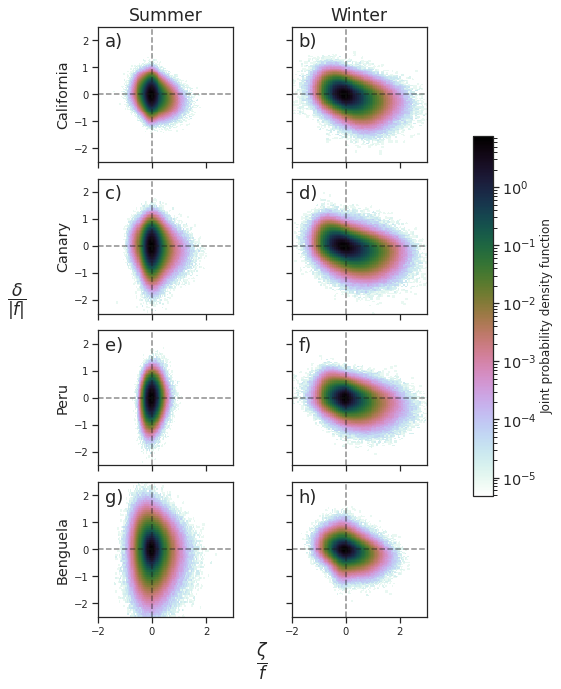

In [119]:
%matplotlib inline
plotjpdfs_sms()

In [24]:
with open("{}/j_pdf/figure.pickle".format(LUIGI_OUT_FOLDER),"rb") as f_pkl:
    fig_ = pickle.load(f_pkl)
    ax = fig_.axes[:]
    print(len(ax))
    for ax_ in ax:
        pass
    plt.show()

FileNotFoundError: [Errno 2] No such file or directory: '/mnt/disks/LLC4320/Luigi/j_pdf/figure.pickle'

In [84]:
curr4id = {762:"California", 750:"Canary", 572:"Peru", 533:"Benguela"}

subplt_labels = []

def plot_wk_kediv():
    subplot_lbl = [x+")" for x in letter_range("a","h")]
    fig, ax = plt.subplots(4, 2, figsize=(7,10), sharex="all", sharey="all", constrained_layout=True)
    for i,rid in enumerate([762,750,572,533]):
        seasons = ["ASO","JFM"] if i<2 else ["JFM","ASO"]
        for j,season in enumerate(seasons):
            ## Calculate filtered Ro and Delta
            ensure_spectra(rid,season)
            spectra_tmp = load_spectra(rid,season)
            Lt = spectra_tmp["Lt_km"]
            om = spectra_tmp["om"]
            ki = spectra_tmp["k_h"]
            KEi = spectra_tmp["KE"]
            RVi = spectra_tmp["KE_RV"]
            DIVi = spectra_tmp["KE_DIV"]
            RVDIV = RVi/DIVi
            minRVDIV = np.log10(np.min(RVDIV))
            maxRVDIV = np.log10(np.max(RVDIV))
            limExp = min(np.abs(minRVDIV),maxRVDIV)
            lims = (10**(-limExp),10**limExp)

            #
            plt.sca(ax[i,j])
            # incisos
            lbl_idx = i*2+j
            lbl = subplot_lbl[lbl_idx]
            plt.pcolormesh(ki,om,(RVDIV).T,norm = colors.LogNorm(vmin=lims[0],vmax=lims[1],clip=True),cmap=plt.cm.BrBG)
            plt.text(1/110, 1/5, lbl, fontsize=18)
            plt.xscale('log')
            plt.xticks(xticks,xticksLabel)
            plt.xlim(xlims)
            plt.yscale('log')
            plt.ylim([om[1],om[-100]])
            plt.yticks(yticks,yticksLabel)
            #plt.colorbar()
            plt.axvline(x=1/Lt,color='r')
            #plt.xlabel(r'Horizontal wavelength [km]',size='xx-large')
            plt.ylabel(curr4id[rid],size='large')
            #plt.ylabel(r'Period',size='xx-large')#,rotation='horizontal')

            #ax[i,j].set_aspect('equal',adjustable="box", anchor="C", share=True)
            ax[i,j].tick_params(labelsize='medium')

            if i==0:
                if j==0:
                    plt.title("Summer",size='xx-large')
                elif j==1:
                    plt.title("Winter",size='xx-large')

    # Remove unnecessary labels
    for ax_ in ax.flat:
        ax_.label_outer()
        
    # Shared xy labels
    fig.add_subplot(111, frameon=False)
    plt.tick_params(labelcolor='none', which='both', top=False, bottom=False, left=False, right=False)
    plt.xlabel(r'Horizontal wavelength [km]',size=22)
    plt.ylabel(r'Period',size=24, labelpad=25.0)#,rotation='horizontal')

    fig.tight_layout()
    #cax = plt.axes([1, 0.3, 0.04, 0.5])
    cax = plt.axes([0.97, 0.3, 0.04, 0.5])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='large')
    cb.set_label('$KE_{\zeta}/KE_{\delta}$')
    #with open("{}/j_pdf/figure.pickle".format(LUIGI_OUT_FOLDER),"wb") as f_pkl:
    #	print("Dumping")
    #	pickle.dump(fig,f_pkl)
    print("Showing")
    plt.savefig("figs/wk_kediv_4curr.pdf", bbox_inches='tight')
    plt.show()

2021-07-23 11:33:04 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:04 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:04 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:04 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:05 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:05 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:05 INFO     Spectra file exists. Skipping.
2021-07-23 11:33:05 INFO     Spectra file exists. Skipping.


Showing


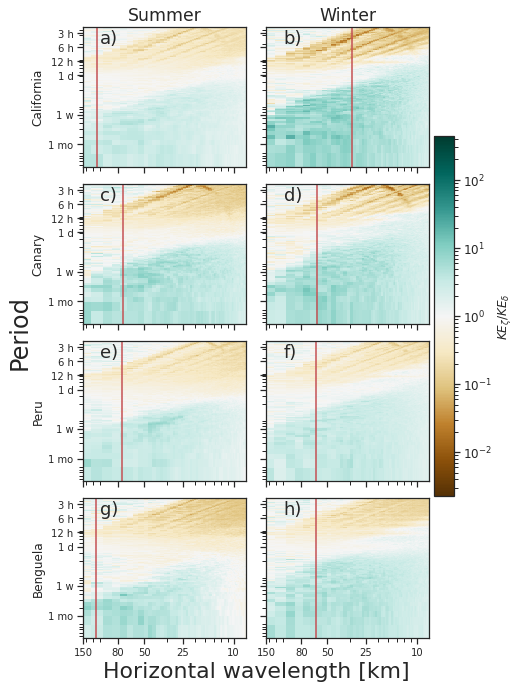

In [85]:
%matplotlib inline
plot_wk_kediv()

In [90]:
# https://matplotlib.org/3.1.0/gallery/lines_bars_and_markers/gradient_bar.html
def addColorBar(ax,y,extent=(0,1,0,1)):
    y = np.array(y)
    n = y.size
    #print(y)
    X = np.repeat(y,3).reshape(n,3).T
    #print(X)
    norm = DivergingNorm(vmin=-np.pi/2, vcenter=0, vmax=np.pi/2)
    ax.imshow(X, interpolation='bicubic', cmap=plt.cm.RdBu_r, norm=norm, alpha=0.15, extent=extent, transform=ax.transAxes)


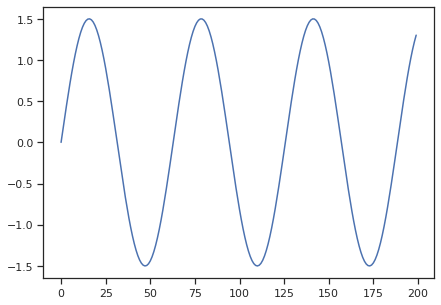

In [91]:
## Test: AddColorBar
N = 200
x = np.arange(N)
y = 1.5*np.sin(x/10)

plt.figure(figsize=(7,5))
plt.plot(x,y)


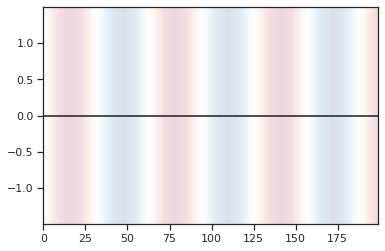

In [92]:
x0,x1 = x.min(),x.max()
y0,y1 = y.min(),y.max()
ax = plt.gca()
ax.set(xlim=(x0,x1),ylim=(y0,y1))
addColorBar(ax,y)
plt.axhline(y=0,c='k')
ax.set_aspect('auto')
plt.show()

In [93]:
import matplotlib.dates as mdates

tick_fontsize = 20
tauRange = 0.01,0.3
mdlRange = 0,260
thetaRange = 15,26
qnetRange = -600,400
rvdivRange = ((0.0,0.1),(0.09,0.46))

ids_regions_compare = {v:[k] for k,v in curr4id.items()}
def plot_stats(current, t_idx_slice=slice(0,None), centerLine=None, cline_lw=5):
    # Vars 
    scales = ["lo","hi"]
    scaleTitle = ["mesoscale","submesoscale"]
    # Time slice
    # Main loop
    for rid in ids_regions_compare[current]:
        lat = lats4id[rid]
        lon = lons4id[rid]
        for season in ["ASO","JFM"]:
            season_ext = "{}_ext".format(season)
            # Season time slice
            time_hr = idx_t["hours"][season_ext][t_idx_slice]
            time_sim = [simulationTime(hr) for hr in time_hr]
            tMin = time_sim[0]
            tMax = time_sim[-1]
            logging.info("{} ({}): {}, ({} to {})".format(rid,current,season_ext,tMin,tMax))
            ## Loading Lt info and calculating sun angle
            ensure_spectra(rid,season)
            spectra_tmp = load_spectra(rid,season)
            Lt = spectra_tmp["Lt_km"]
            sunAngle_ = [sunAngle(lon,lat,t_) for t_ in time_hr]
            logging.info("{} ({}): {}, Lt = {}".format(rid,current,season_ext,Lt))

            ## Loading stats
            stats = ensure_load_stats(rid,season_ext,Lt,t_idx_slice)

            ## X axis: time
            fmt_month = mdates.MonthLocator(interval=1,bymonthday=1)
            fmt_week = mdates.AutoDateLocator()
            
            ## Plot limits
            # HF
            minHf = np.nanmin(stats["hflux_mean_min"][t_idx_slice])
            maxHf = np.nanmax(stats["hflux_mean_max"][t_idx_slice])
            minTau = np.nanmin(stats["tauabs_mean"][t_idx_slice])
            maxTau = np.nanmax(stats["tauabs_mean"][t_idx_slice])
            minT = np.nanmin(stats["theta_mean_min"][t_idx_slice])
            maxT = np.nanmax(stats["theta_mean_max"][t_idx_slice])
            # Wind stress
            min_abstau = np.nanmin(stats["tauabs_mean"][t_idx_slice])
            max_abstau = np.nanmax(stats["tauabs_mean"][t_idx_slice])
            # HBL
            min_hbl = np.nanmin(stats["hbl_mean"][t_idx_slice])
            max_hbl = np.nanmax(stats["hbl_mean"][t_idx_slice])

            with sns.axes_style("whitegrid"):
                ## HF - Plot
                fig, ax = plt.subplots(4,1,figsize=(12,10))

                plt.sca(ax[0])
                ax[0].set(xlim=(tMin,tMax), ylim=tauRange, autoscale_on=False)
                line1, = ax[0].plot(time_sim,stats["tauabs_mean"][t_idx_slice],c='b',label='|Tau|')
                plt.axhline(y=0,ls='--',c='k',alpha=0.5)
                if(centerLine is not None):
                    center_hr = idx_t["hours"][season_ext][centerLine]
                    plt.axvline(x=simulationTime(center_hr),ls='--',c='r',alpha=0.75,lw=cline_lw)
                    plt.axvline(x=simulationTime(center_hr+12),ls='--',c='b',alpha=0.75,lw=cline_lw)
                addColorBar(ax[0],sunAngle_)
                ax2 = ax[0].twinx()
                ax2.set(ylim=mdlRange, autoscale_on=False)
                ax[0].tick_params(axis='y', colors='blue', labelsize='xx-large')
                ax[0].set_ylabel('|Tau| [Pa]', fontsize=tick_fontsize)
                ax2.tick_params(axis='y', colors='red', labelsize='xx-large')
                ax2.set_ylabel('MLD [m]', fontsize=tick_fontsize)
                line2, = ax2.plot(time_sim,stats["hbl_mean"][t_idx_slice],c='r',label="MLD")
                ax2.grid(b=False,axis='both')
                plt.legend((line1,line2),("|Tau|","MLD"),loc="upper right", fontsize='x-large')
                ax[0].xaxis.set_major_locator(fmt_month)
                ax[0].xaxis.set_minor_locator(fmt_week)
                plt.setp(ax[0].get_xticklabels(), visible=False)
                ax[0].set_aspect('auto')
                plt.title('Average wind intensity (|Tau|) and average KPPhbl (MLD)', fontsize='xx-large')

                plt.sca(ax[1])
                ax[1].set(xlim=(tMin,tMax), ylim=thetaRange, autoscale_on=False)
                line1, = ax[1].plot(time_sim,stats["theta_mean"][t_idx_slice],c='b',label='SST')
                plt.axhline(y=0,ls='--',c='k',alpha=0.5)
                if(centerLine is not None):
                    center_hr = idx_t["hours"][season_ext][centerLine]
                    plt.axvline(x=simulationTime(center_hr),ls='--',c='r',alpha=0.75,lw=cline_lw)
                    plt.axvline(x=simulationTime(center_hr+12),ls='--',c='b',alpha=0.75,lw=cline_lw)
                # dTh = np.gradient(stats["theta_mean"][t_idx_slice])
                axDT = ax[1].twinx()
                axDT.set(ylim=qnetRange, autoscale_on=False)
                ax[1].tick_params(axis='y', colors='blue', labelsize='xx-large')
                ax[1].set_ylabel('SST [$\degree$C]', fontsize=tick_fontsize)
                axDT.tick_params(axis='y', colors='red', labelsize='xx-large')
                axDT.set_ylabel('Qnet [W/m^2]', fontsize=tick_fontsize)
                line2, = axDT.plot(time_sim,stats["hflux_mean"][t_idx_slice],c='r',label='Qnet')
                axDT.grid(b=False,axis='both')
                addColorBar(ax[1],sunAngle_)
                plt.legend((line1,line2),('SST','Qnet'),loc="upper right", fontsize='x-large')
                ax[1].xaxis.set_major_locator(fmt_month)
                ax[1].xaxis.set_minor_locator(fmt_week)
                plt.setp(ax[1].get_xticklabels(), visible=False)
                ax[1].set_aspect('auto')
                plt.title("Temperature (SST) and mean net heat flux (Qnet)", fontsize='xx-large')

                ## Std - Plot
                #fig, ax = plt.subplots(1,2,figsize=(15,6))
                stdRo = [stats["ro{}_std".format(scale)][t_idx_slice] for scale in scales]
                stdDel = [stats["del{}_std".format(scale)][t_idx_slice] for scale in scales]

                for i in range(2):
                    ax_ = ax[i+2]
                    minY = np.nanmin(stats["ro{}_std".format(scales[i])][t_idx_slice])
                    maxY = np.nanmax(stats["ro{}_std".format(scales[i])][t_idx_slice])

                    ax_.set(xlim=(tMin,tMax), ylim=rvdivRange[i], autoscale_on=False)
                    # Sun angle (w.r.t. horizon) -- red=positive, blue=negative
                    addColorBar(ax_,sunAngle_)
                    # Std
                    plt.sca(ax_)
                    line1, = plt.plot(time_sim,stdRo[i],c='xkcd:pinkish',label="$\zeta/f$")
                    if(centerLine is not None):
                        center_hr = idx_t["hours"][season_ext][centerLine]
                        plt.axvline(x=simulationTime(center_hr),ls='--',c='r',alpha=0.75,lw=cline_lw)
                        plt.axvline(x=simulationTime(center_hr+12),ls='--',c='b',alpha=0.75,lw=cline_lw)
                    ax2_ = ax_.twinx()
                    ax2_.set(ylim=rvdivRange[i], autoscale_on=False)
                    ax_.tick_params(axis='y', colors='xkcd:pinkish', labelsize='xx-large')
                    ax2_.tick_params(axis='y', colors='xkcd:olive green', labelsize='xx-large')
                    ax_.set_ylabel('$\zeta/f$', fontsize=tick_fontsize)
                    ax2_.set_ylabel('$\delta/f$', fontsize=tick_fontsize)
                    line2, = ax2_.plot(time_sim,stdDel[i],c='xkcd:olive green',label="$\delta/f$")
                    ax2_.grid(b=False,axis='both')
                    plt.legend((line1,line2),("$\zeta/f$","$\delta/f$"), fontsize='x-large')
                    ax_.xaxis.set_major_locator(fmt_month)
                    ax_.xaxis.set_minor_locator(fmt_week)
                    if i==0:
                        plt.setp(ax_.get_xticklabels(), visible=False)
                    ax_.set_aspect('auto')
                    plt.title("Normalized {} relative vorticity ($\zeta/f$) and divergence ($\delta/f$) (RMS)".format(scaleTitle[i]), fontsize='xx-large') 
                #ax[-1].xaxis.set_minor_formatter(mdates.DateFormatter('%b-%d'))
                ax[-1].xaxis.set_major_formatter(mdates.DateFormatter('%b-%d'))
                ax[-1].tick_params(axis='x', labelsize='xx-large')
                #ax[-1].set_xlabel("Time",size='xx-large')
                plt.show()

In [94]:
tick_fontsize = 15

def calc_phasediff(current, t_idx_slice=slice(0,None), days_window=7):
    # Vars 
    scales = ["lo","hi"]
    scaleTitle = ["Mesoscale","Submesoscale"]
    # Time slice
    # Main loop
    for rid in ids_regions[current]:
        lat = lats4id[rid]
        lon = lons4id[rid]
        for season in ["ASO","JFM"]:
            season_ext = "{}_ext".format(season)
            # Season time slice
            time_hr = idx_t["hours"][season_ext][t_idx_slice]
            time_sim = [simulationTime(hr) for hr in time_hr]
            tMin = time_sim[0]
            tMax = time_sim[-1]
            logging.info("{} ({}) (lat: {}, lon: {}): {}, ({} to {})".format(rid,current,lat,lon,season_ext,tMin,tMax))
            ## Loading Lt info and calculating sun angle
            ensure_spectra(rid,season)
            spectra_tmp = load_spectra(rid,season)
            Lt = spectra_tmp["Lt_km"]
            logging.info("{} ({}): {}, Lt = {}".format(rid,current,season_ext,Lt))

            ## Loading stats
            stats = ensure_load_stats(rid,season_ext,Lt,t_idx_slice,style="full")
            stdRo = [stats["ro{}_std".format(scale)][t_idx_slice] for scale in scales]
            stdDel = [stats["del{}_std".format(scale)][t_idx_slice] for scale in scales]

            nfft = days_window*24
            f_ticklabels = [2,4,6,12,24,36,48,72,24*7,nfft]
            #f_ticklabels = [6,12,24,36,48,72,24*4,24*7]
            f_ticks = [1/tk for tk in f_ticklabels]

            with sns.axes_style("whitegrid"):
                fig, ax = plt.subplots(4,1,figsize=(10,20))

                #CSD
                plt.sca(ax[0])
                #csd_zd, fcsd = plt.csd(stdRo[1][0], stdDel[1][0], NFFT=nfft, Fs=1.)
                fcsd, csd_zd = signal.csd(stdRo[1], stdDel[1], fs=1., nperseg=nfft, detrend='linear', window='hamm')
                plt.stem(fcsd,np.abs(csd_zd))
                ax[0].set_xscale('log')
                plt.xticks(ticks=f_ticks, labels=f_ticklabels)
                plt.ylabel("Cross spectral density")

                #Coherence
                plt.sca(ax[1])
                fcoh, czd = signal.coherence(stdRo[1], stdDel[1], fs=1., nperseg=nfft, detrend='linear', window='hamm')
                plt.stem(fcoh,czd)
                #czd, fcoh = plt.cohere(stdRo[1][0], stdDel[1][0], NFFT=nfft, Fs=1.)
                ax[1].set_xscale('log')
                plt.xticks(ticks=f_ticks, labels=f_ticklabels)
                coh_zd = czd
                ci = 0.9
                edof = (stats["length"]/(nfft/2)) * coh_zd.mean()
                gamma = 1.-(1-ci)**(1./(edof-1.)) # Conf interval
                conf = np.where(coh_zd>gamma)
                plt.axhline(y=gamma, color='r', linestyle='-.')
                plt.ylabel("Coherence >{0}% interval ({1:.2f})".format(100*ci,gamma))

                #Phase (degrees)
                plt.sca(ax[2])
                angle_zd = np.angle(csd_zd)*180/np.pi
                plt.plot(fcoh, angle_zd,'ro')
                #plt.plot(fcoh[conf], angle_zd[conf],'ro')
                ax[2].set_xscale('log')
                plt.xticks(ticks=f_ticks, labels=f_ticklabels)
                plt.ylim([-185,185])
                ax[2].set_yticklabels([-180,-135,-90,-45,0,45,90,135,180])
                plt.ylabel("Phase difference (degrees)")

                plt.sca(ax[3])
                phdiff_hr = angle_zd/(fcoh*360.0)
                plt.plot(fcoh, phdiff_hr, 'ro')
                #plt.plot(fcoh[conf], phdiff_hr[conf], 'ro')
                ax[3].set_xscale('log')
                plt.xticks(ticks=f_ticks, labels=f_ticklabels)
                plt.ylabel("Phase difference (hours)")
                plt.xlabel("Hours")

                plt.show()
                logging.info("{} ({}): {}, Lt = {} -- T: {}, coh: {}, hr: {}".format(rid,current,season_ext,Lt,1/fcoh[days_window], czd[days_window], phdiff_hr[days_window]))
                

2021-05-26 11:06:54 INFO     762 (California): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-11-14 23:00:00+00:00)
2021-05-26 11:06:54 DEBUG    762: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-26 11:06:54 INFO     Spectra file exists. Skipping.
2021-05-26 11:06:54 DEBUG    762: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-26 11:06:54 INFO     762 (California): ASO_ext, Lt = 115.97
2021-05-26 11:06:54 INFO     762: ASO_ext (style=full) -- Ensuring
2021-05-26 11:06:54 INFO     762: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-26 11:06:54 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-26 11:06:54 INFO     762: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,10295)
2021-05-26 11:06:54 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz


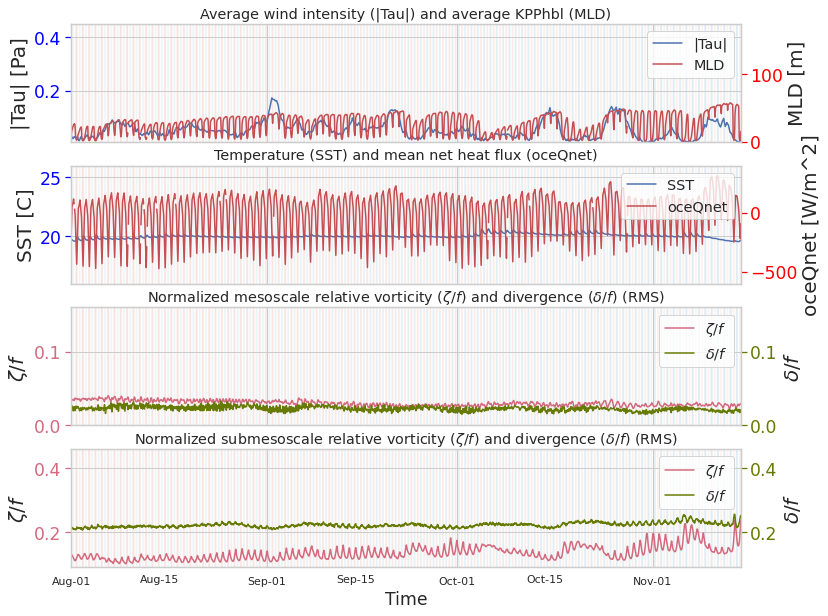

2021-05-26 11:06:56 INFO     762 (California): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-04-30 23:00:00+00:00)
2021-05-26 11:06:56 DEBUG    762: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-26 11:06:56 INFO     Spectra file exists. Skipping.
2021-05-26 11:06:56 DEBUG    762: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-26 11:06:56 INFO     762 (California): JFM_ext, Lt = 32.0
2021-05-26 11:06:56 INFO     762: JFM_ext (style=full) -- Ensuring
2021-05-26 11:06:56 INFO     762: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-26 11:06:56 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-26 11:06:56 INFO     762: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes what we need (2640,5543)
2021-05-26 11:06:56 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz


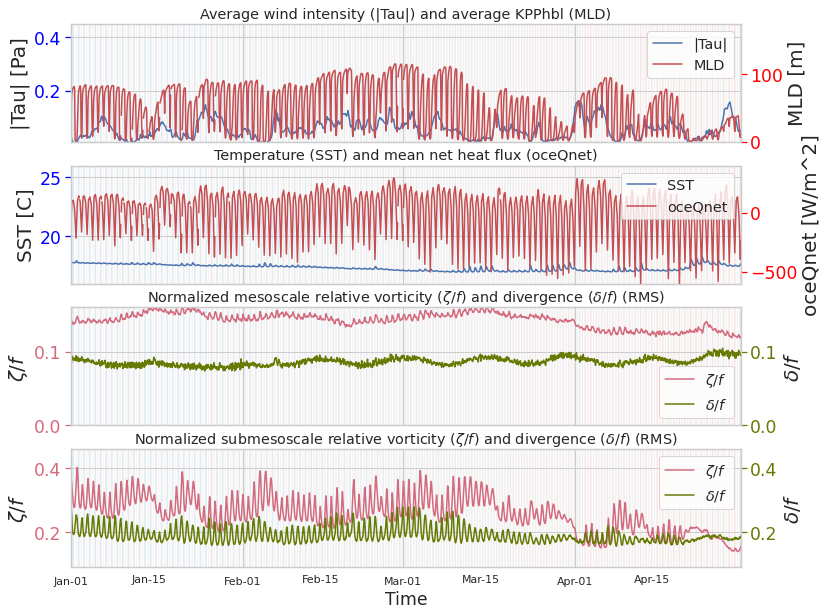

In [199]:
plot_stats("California")

2021-07-14 09:05:01 INFO     750 (Canary): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-11-14 23:00:00+00:00)
2021-07-14 09:05:01 INFO     Spectra file exists. Skipping.
2021-07-14 09:05:01 INFO     750 (Canary): ASO_ext, Lt = 73.42
2021-07-14 09:05:01 INFO     750: ASO_ext (style=full) -- Ensuring
2021-07-14 09:05:01 INFO     750: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-07-14 09:05:01 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-07-14 09:05:01 INFO     750: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,10295)
2021-07-14 09:05:01 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz


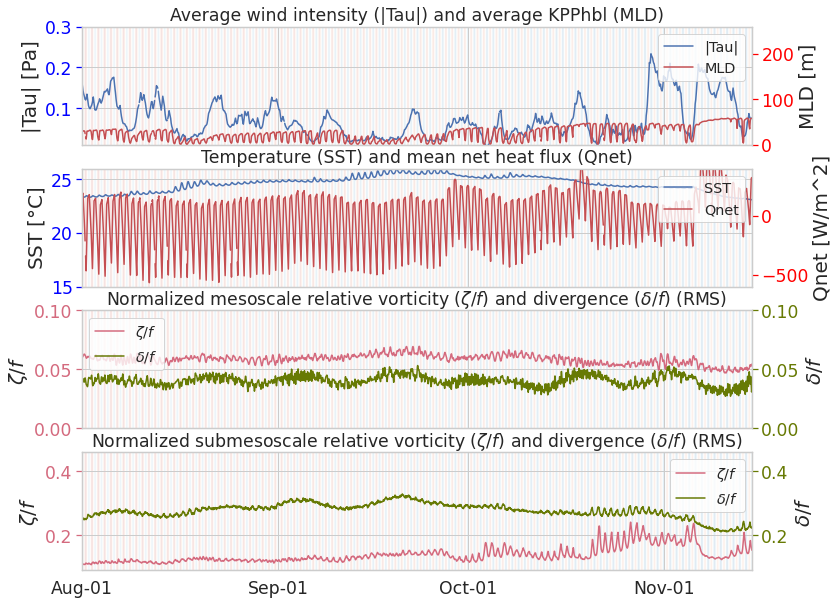

2021-07-14 09:05:04 INFO     750 (Canary): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-04-30 23:00:00+00:00)
2021-07-14 09:05:04 INFO     Spectra file exists. Skipping.
2021-07-14 09:05:04 INFO     750 (Canary): JFM_ext, Lt = 60.0
2021-07-14 09:05:04 INFO     750: JFM_ext (style=full) -- Ensuring
2021-07-14 09:05:04 INFO     750: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-07-14 09:05:04 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-07-14 09:05:04 INFO     750: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes what we need (2640,5543)
2021-07-14 09:05:04 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz


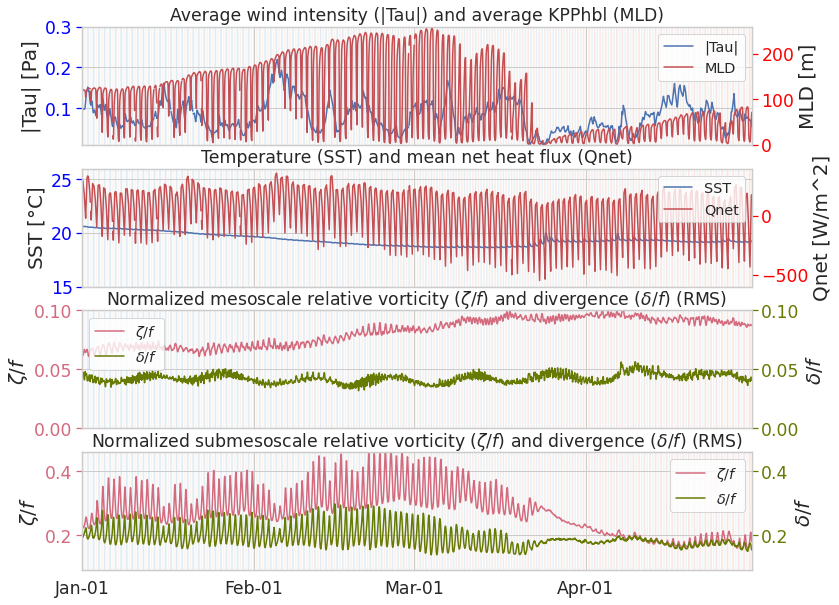

In [35]:
plot_stats("Canary")

2021-05-26 11:07:04 INFO     572 (Peru): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-11-14 23:00:00+00:00)
2021-05-26 11:07:04 DEBUG    572: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-26 11:07:04 INFO     Spectra file exists. Skipping.
2021-05-26 11:07:04 DEBUG    572: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-26 11:07:04 INFO     572 (Peru): ASO_ext, Lt = 61.88
2021-05-26 11:07:04 INFO     572: ASO_ext (style=full) -- Ensuring
2021-05-26 11:07:04 INFO     572: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-26 11:07:04 INFO     572: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-26 11:07:04 INFO     572: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,10295)
2021-05-26 11:07:04 INFO     572: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz


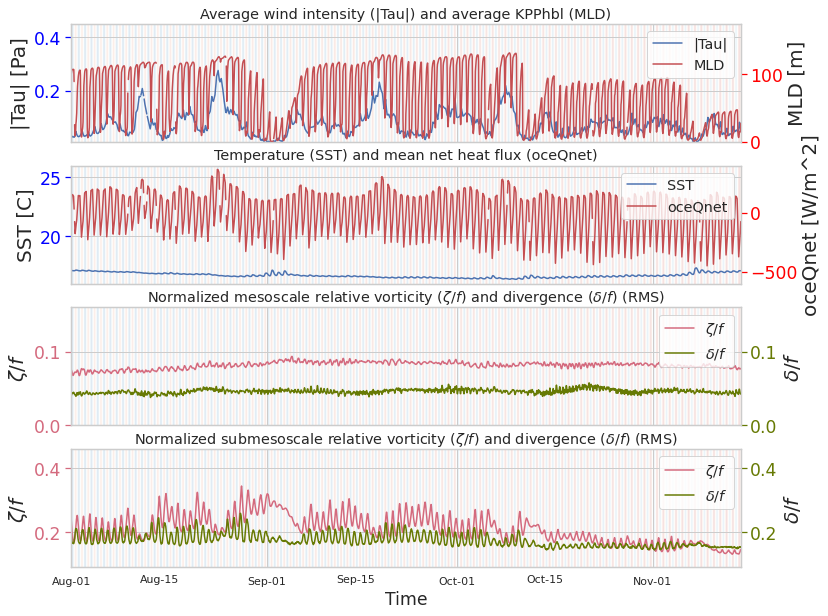

2021-05-26 11:07:06 INFO     572 (Peru): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-04-30 23:00:00+00:00)
2021-05-26 11:07:06 DEBUG    572: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-26 11:07:06 INFO     Spectra file exists. Skipping.
2021-05-26 11:07:06 DEBUG    572: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-26 11:07:06 INFO     572 (Peru): JFM_ext, Lt = 74.28
2021-05-26 11:07:06 INFO     572: JFM_ext (style=full) -- Ensuring
2021-05-26 11:07:06 INFO     572: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-26 11:07:06 INFO     572: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-26 11:07:06 INFO     572: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes what we need (2640,5543)
2021-05-26 11:07:06 INFO     572: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz


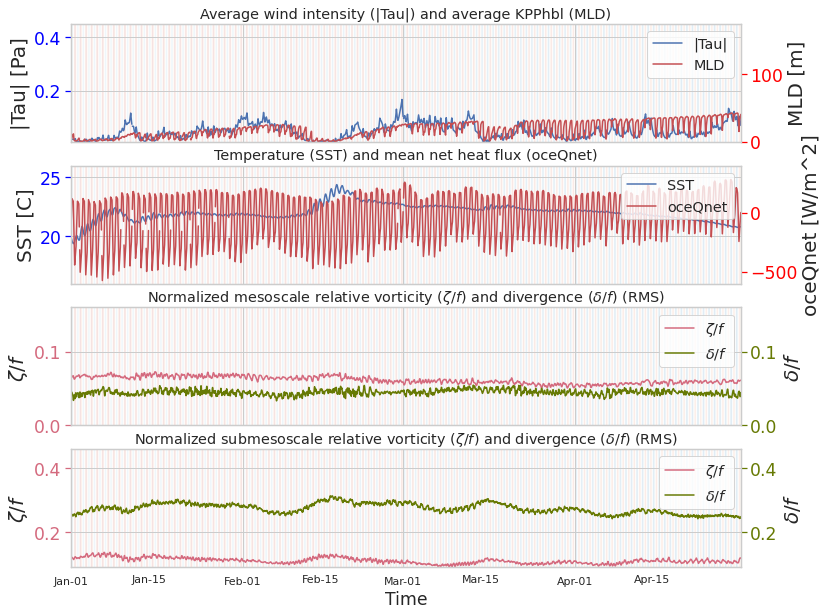

In [201]:
plot_stats("Peru")

2021-07-14 09:05:13 INFO     533 (Benguela): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-11-14 23:00:00+00:00)
2021-07-14 09:05:13 INFO     Spectra file exists. Skipping.
2021-07-14 09:05:13 INFO     533 (Benguela): ASO_ext, Lt = 61.3
2021-07-14 09:05:13 INFO     533: ASO_ext (style=full) -- Ensuring
2021-07-14 09:05:13 INFO     533: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-07-14 09:05:13 INFO     533: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-07-14 09:05:13 INFO     533: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,10295)
2021-07-14 09:05:13 INFO     533: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz


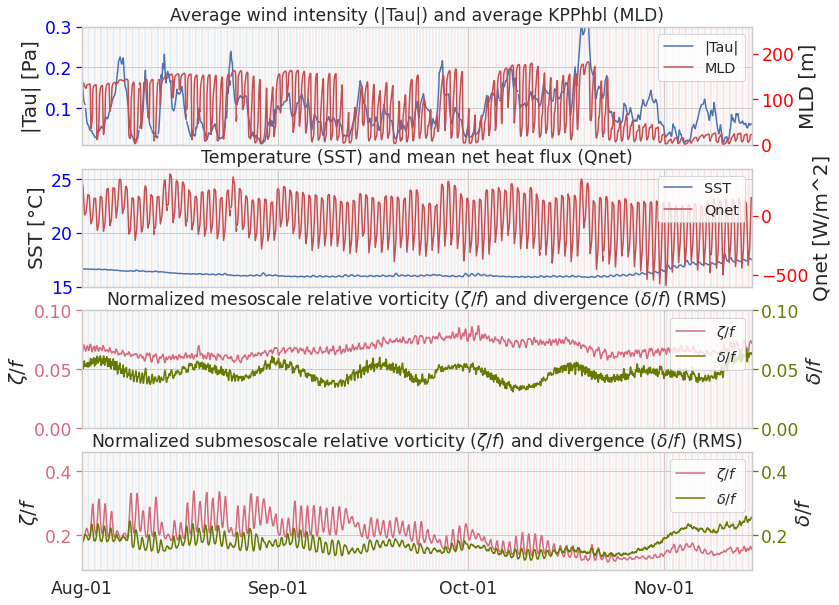

2021-07-14 09:05:15 INFO     533 (Benguela): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-04-30 23:00:00+00:00)
2021-07-14 09:05:15 INFO     Spectra file exists. Skipping.
2021-07-14 09:05:16 INFO     533 (Benguela): JFM_ext, Lt = 119.46
2021-07-14 09:05:16 INFO     533: JFM_ext (style=full) -- Ensuring
2021-07-14 09:05:16 INFO     533: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-07-14 09:05:16 INFO     533: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-07-14 09:05:16 INFO     533: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes what we need (2640,5543)
2021-07-14 09:05:16 INFO     533: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz


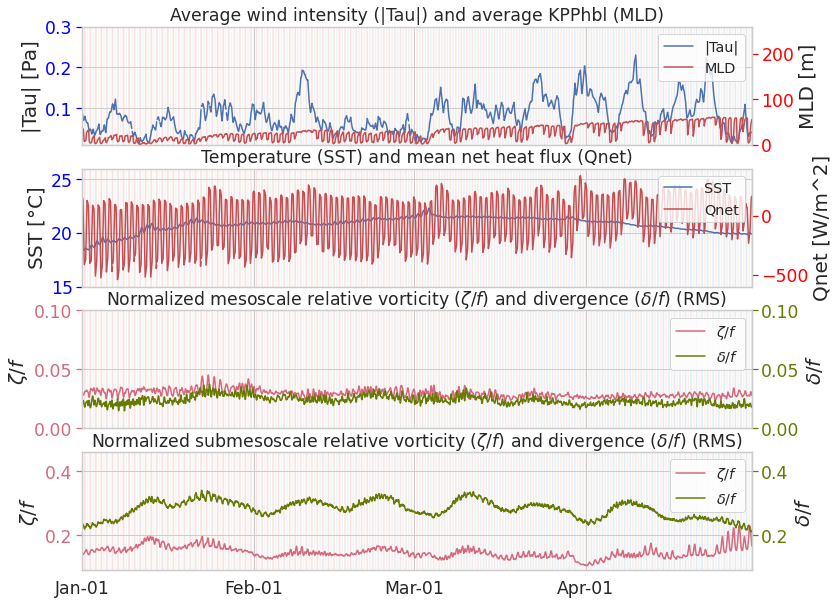

In [36]:
plot_stats("Benguela")

2021-05-25 00:05:47 INFO     868 (California) (lat: 48.383, lon: -137): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:05:47 DEBUG    868: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/868_ASO_hours.npz
2021-05-25 00:05:47 INFO     Spectra file exists. Skipping.
2021-05-25 00:05:47 DEBUG    868: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/868_ASO_hours.npz
2021-05-25 00:05:47 INFO     868 (California): ASO_ext, Lt = 97.52
2021-05-25 00:05:47 INFO     868: ASO_ext (style=full) -- Ensuring
2021-05-25 00:05:47 INFO     868: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/868_ASO_ext_hours.npz
2021-05-25 00:05:47 INFO     868: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/868_ASO_ext_hours.npz
2021-05-25 00:05:47 INFO     868: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,9935)
2021-05-25 00:05:47 INFO     868: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats

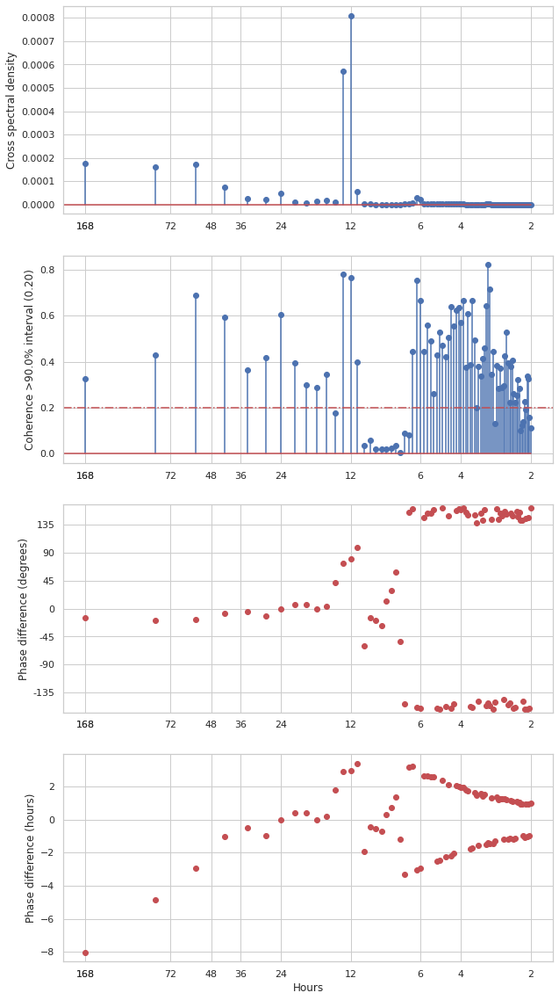

2021-05-25 00:05:49 INFO     868 (California): ASO_ext, Lt = 97.52 -- T: 24.0, coh: 0.6067684103112855, hr: -0.006930443716815645
2021-05-25 00:05:49 INFO     868 (California) (lat: 48.383, lon: -137): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:05:49 DEBUG    868: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/868_JFM_hours.npz
2021-05-25 00:05:49 INFO     Spectra file exists. Skipping.
2021-05-25 00:05:49 DEBUG    868: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/868_JFM_hours.npz
2021-05-25 00:05:49 INFO     868 (California): JFM_ext, Lt = 40.0
2021-05-25 00:05:49 INFO     868: JFM_ext (style=full) -- Ensuring
2021-05-25 00:05:49 INFO     868: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/868_JFM_ext_hours.npz
2021-05-25 00:05:49 INFO     868: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/868_JFM_ext_hours.npz
2021-05-25 00:05:49 INFO     868: JFM_ext -- File exists for the same parameters, and time slice (2640,5543

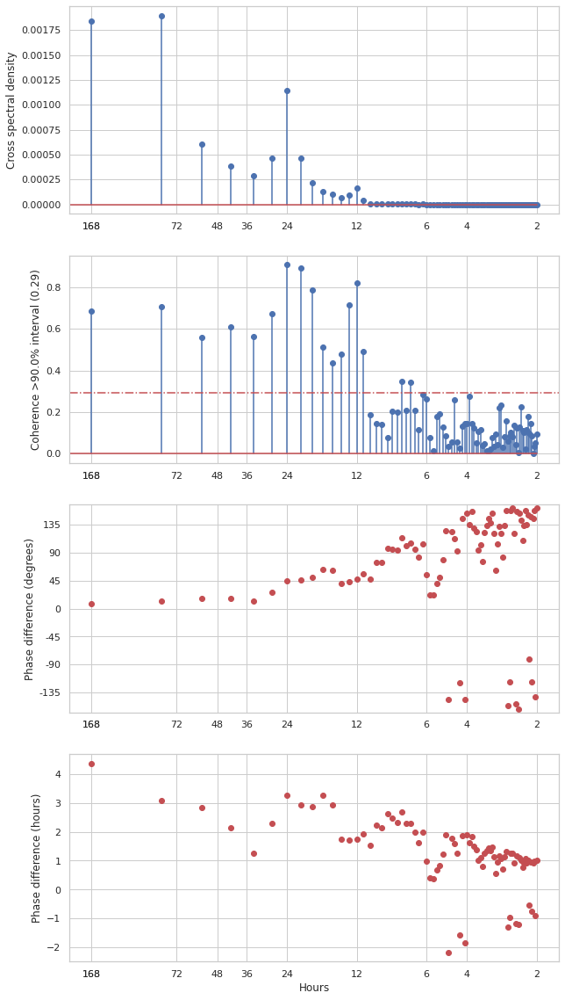

2021-05-25 00:05:51 INFO     868 (California): JFM_ext, Lt = 40.0 -- T: 24.0, coh: 0.907193297109642, hr: 3.2742310534370036
2021-05-25 00:05:51 INFO     852 (California) (lat: 44.521, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:05:51 DEBUG    852: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-05-25 00:05:51 INFO     Spectra file exists. Skipping.
2021-05-25 00:05:51 DEBUG    852: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-05-25 00:05:51 INFO     852 (California): ASO_ext, Lt = 118.7
2021-05-25 00:05:51 INFO     852: ASO_ext (style=full) -- Ensuring
2021-05-25 00:05:51 INFO     852: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/852_ASO_ext_hours.npz
2021-05-25 00:05:51 INFO     852: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/852_ASO_ext_hours.npz
2021-05-25 00:05:52 INFO     852: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) a

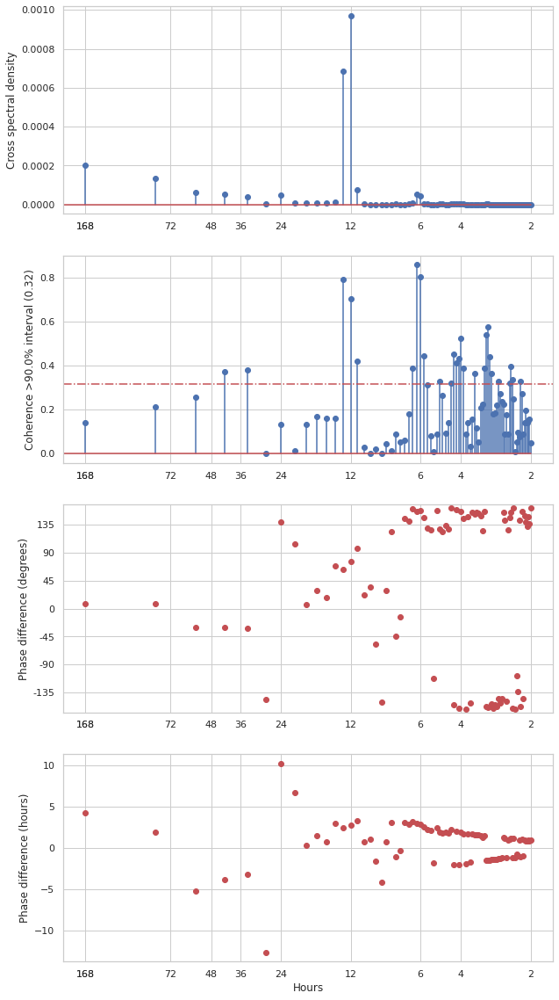

2021-05-25 00:05:54 INFO     852 (California): ASO_ext, Lt = 118.7 -- T: 24.0, coh: 0.13451149083940486, hr: 10.256233546498919
2021-05-25 00:05:54 INFO     852 (California) (lat: 44.521, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:05:54 DEBUG    852: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-05-25 00:05:54 INFO     Spectra file exists. Skipping.
2021-05-25 00:05:54 DEBUG    852: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-05-25 00:05:54 INFO     852 (California): JFM_ext, Lt = 44.5
2021-05-25 00:05:54 INFO     852: JFM_ext (style=full) -- Ensuring
2021-05-25 00:05:54 INFO     852: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/852_JFM_ext_hours.npz
2021-05-25 00:05:54 INFO     852: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/852_JFM_ext_hours.npz
2021-05-25 00:05:54 INFO     852: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

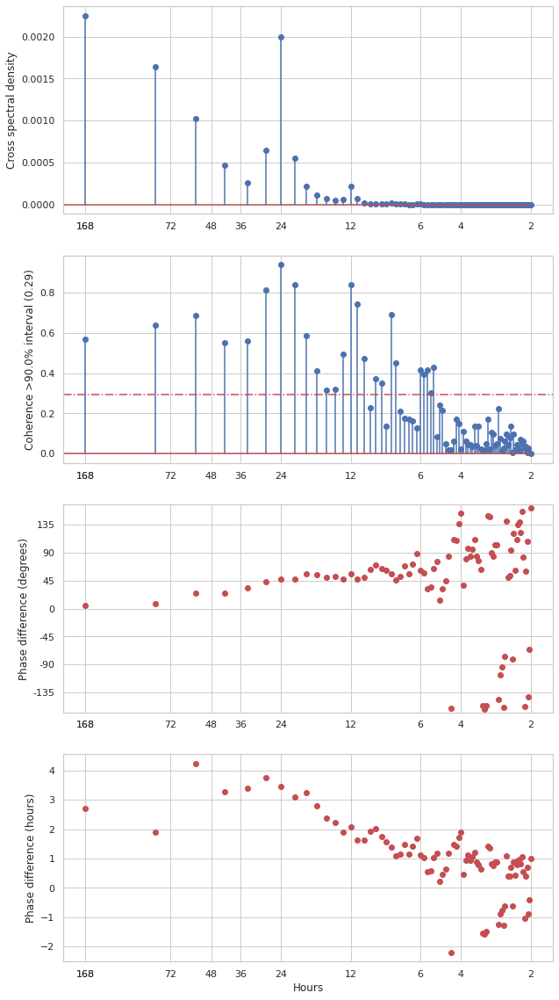

2021-05-25 00:05:56 INFO     852 (California): JFM_ext, Lt = 44.5 -- T: 24.0, coh: 0.9370224011498076, hr: 3.464396804022093
2021-05-25 00:05:56 INFO     831 (California) (lat: 40.411, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:05:56 DEBUG    831: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/831_ASO_hours.npz
2021-05-25 00:05:56 INFO     Spectra file exists. Skipping.
2021-05-25 00:05:56 DEBUG    831: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/831_ASO_hours.npz
2021-05-25 00:05:56 INFO     831 (California): ASO_ext, Lt = 172.16
2021-05-25 00:05:56 INFO     831: ASO_ext (style=full) -- Ensuring
2021-05-25 00:05:56 INFO     831: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/831_ASO_ext_hours.npz
2021-05-25 00:05:56 INFO     831: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/831_ASO_ext_hours.npz
2021-05-25 00:05:56 INFO     831: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

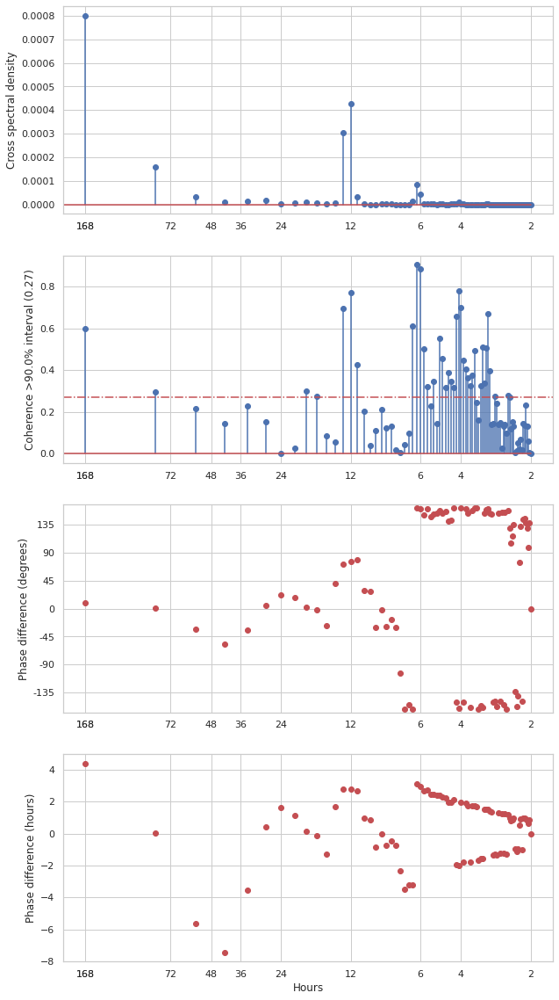

2021-05-25 00:05:59 INFO     831 (California): ASO_ext, Lt = 172.16 -- T: 24.0, coh: 0.0013437856242287068, hr: 1.6294842539642904
2021-05-25 00:05:59 INFO     831 (California) (lat: 40.411, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:05:59 DEBUG    831: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/831_JFM_hours.npz
2021-05-25 00:05:59 INFO     Spectra file exists. Skipping.
2021-05-25 00:05:59 DEBUG    831: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/831_JFM_hours.npz
2021-05-25 00:05:59 INFO     831 (California): JFM_ext, Lt = 37.18
2021-05-25 00:05:59 INFO     831: JFM_ext (style=full) -- Ensuring
2021-05-25 00:05:59 INFO     831: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/831_JFM_ext_hours.npz
2021-05-25 00:05:59 INFO     831: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/831_JFM_ext_hours.npz
2021-05-25 00:05:59 INFO     831: JFM_ext -- File exists for the same parameters, and time slice (2640,55

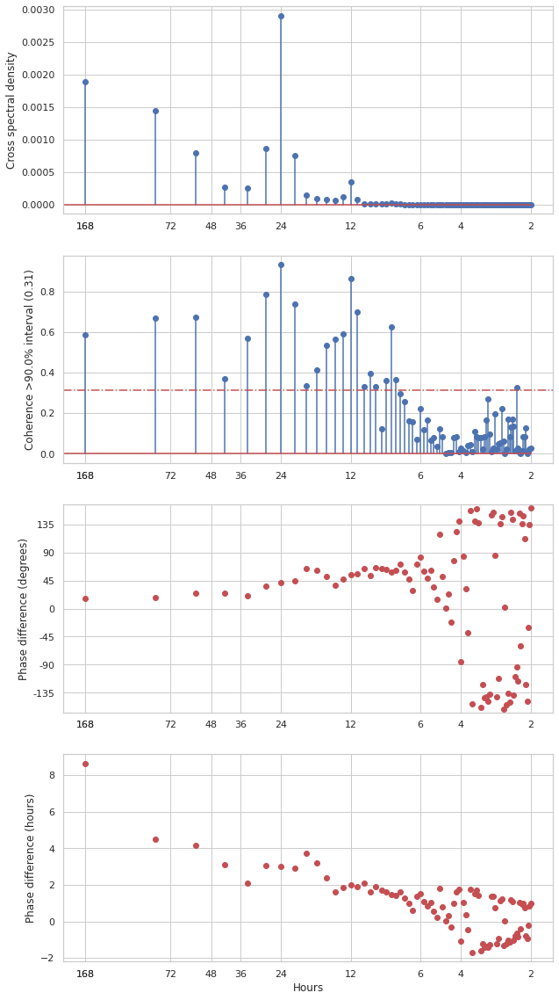

2021-05-25 00:06:01 INFO     831 (California): JFM_ext, Lt = 37.18 -- T: 24.0, coh: 0.9302897485238237, hr: 3.032118828542414
2021-05-25 00:06:01 INFO     809 (California) (lat: 36.056, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:01 DEBUG    809: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/809_ASO_hours.npz
2021-05-25 00:06:01 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:01 DEBUG    809: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/809_ASO_hours.npz
2021-05-25 00:06:01 INFO     809 (California): ASO_ext, Lt = 94.29
2021-05-25 00:06:01 INFO     809: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:01 INFO     809: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/809_ASO_ext_hours.npz
2021-05-25 00:06:01 INFO     809: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/809_ASO_ext_hours.npz
2021-05-25 00:06:01 INFO     809: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

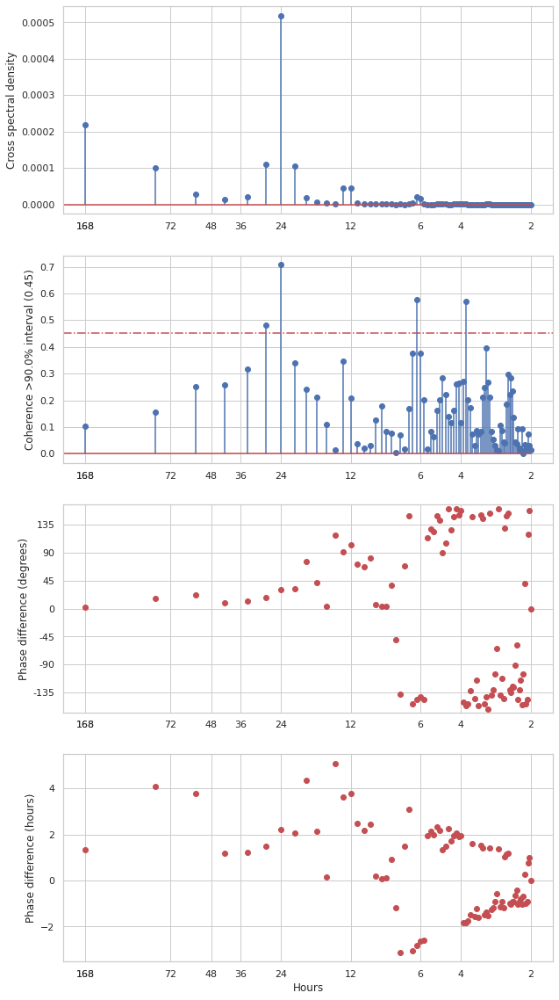

2021-05-25 00:06:03 INFO     809 (California): ASO_ext, Lt = 94.29 -- T: 24.0, coh: 0.7069794200963841, hr: 2.2212983397438446
2021-05-25 00:06:03 INFO     809 (California) (lat: 36.056, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:03 DEBUG    809: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/809_JFM_hours.npz
2021-05-25 00:06:03 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:03 DEBUG    809: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/809_JFM_hours.npz
2021-05-25 00:06:03 INFO     809 (California): JFM_ext, Lt = 41.19
2021-05-25 00:06:03 INFO     809: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:03 INFO     809: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/809_JFM_ext_hours.npz
2021-05-25 00:06:03 INFO     809: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/809_JFM_ext_hours.npz
2021-05-25 00:06:03 INFO     809: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

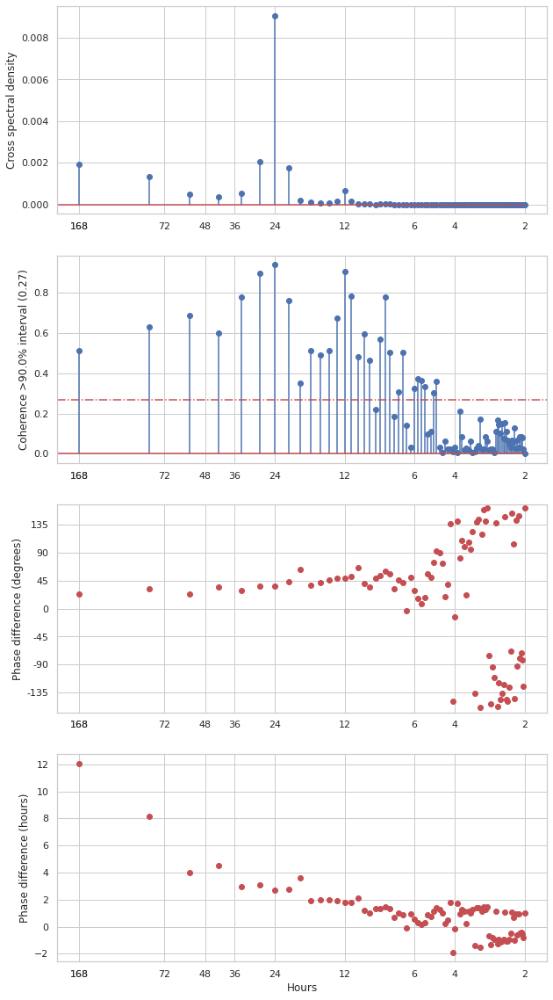

2021-05-25 00:06:06 INFO     809 (California): JFM_ext, Lt = 41.19 -- T: 24.0, coh: 0.9381032494855105, hr: 2.6946522109621625
2021-05-25 00:06:06 INFO     787 (California) (lat: 31.462, lon: -125): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:06 DEBUG    787: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/787_ASO_hours.npz
2021-05-25 00:06:06 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:06 DEBUG    787: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/787_ASO_hours.npz
2021-05-25 00:06:06 INFO     787 (California): ASO_ext, Lt = 107.77
2021-05-25 00:06:06 INFO     787: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:06 INFO     787: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/787_ASO_ext_hours.npz
2021-05-25 00:06:06 INFO     787: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/787_ASO_ext_hours.npz
2021-05-25 00:06:06 INFO     787: ASO_ext -- File exists for the same parameters, and time slice (7752,10295

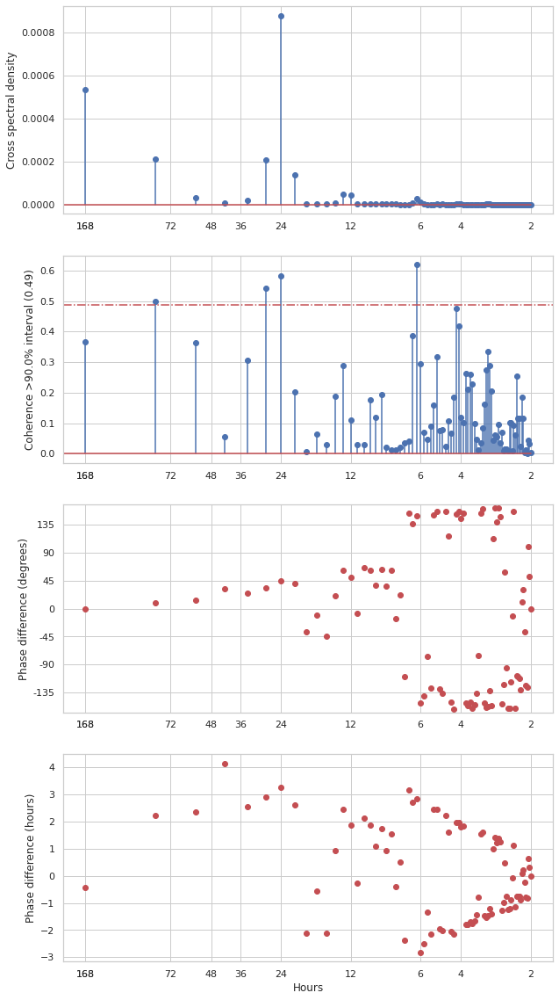

2021-05-25 00:06:08 INFO     787 (California): ASO_ext, Lt = 107.77 -- T: 24.0, coh: 0.5809088080030808, hr: 3.2563383868796354
2021-05-25 00:06:08 INFO     787 (California) (lat: 31.462, lon: -125): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:08 DEBUG    787: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/787_JFM_hours.npz
2021-05-25 00:06:08 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:08 DEBUG    787: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/787_JFM_hours.npz
2021-05-25 00:06:08 INFO     787 (California): JFM_ext, Lt = 32.0
2021-05-25 00:06:08 INFO     787: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:08 INFO     787: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/787_JFM_ext_hours.npz
2021-05-25 00:06:08 INFO     787: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/787_JFM_ext_hours.npz
2021-05-25 00:06:08 INFO     787: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

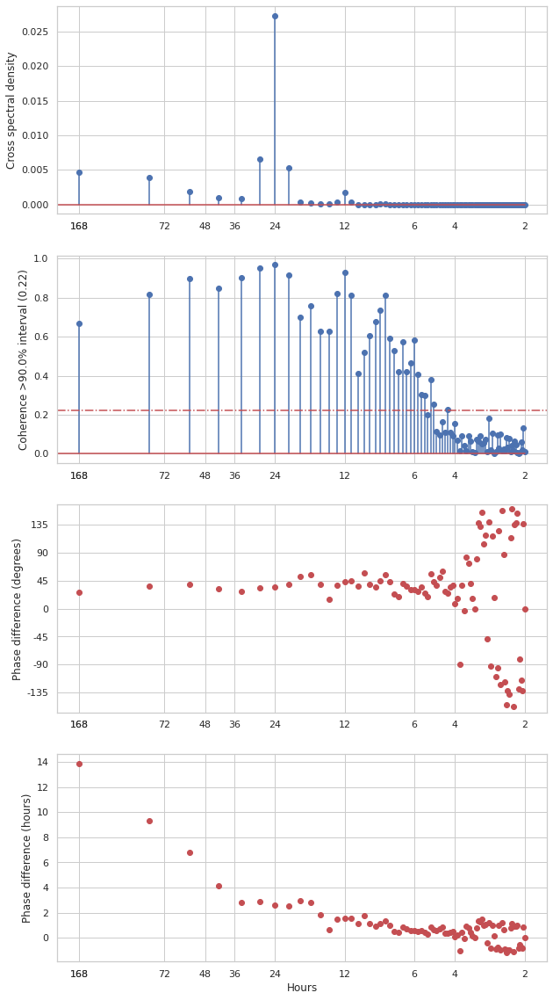

2021-05-25 00:06:10 INFO     787 (California): JFM_ext, Lt = 32.0 -- T: 24.0, coh: 0.967878430226161, hr: 2.5857154641406415
2021-05-25 00:06:10 INFO     762 (California) (lat: 26.641, lon: -125): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:10 DEBUG    762: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-25 00:06:10 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:10 DEBUG    762: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-25 00:06:10 INFO     762 (California): ASO_ext, Lt = 115.97
2021-05-25 00:06:10 INFO     762: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:10 INFO     762: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-25 00:06:10 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-25 00:06:10 INFO     762: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

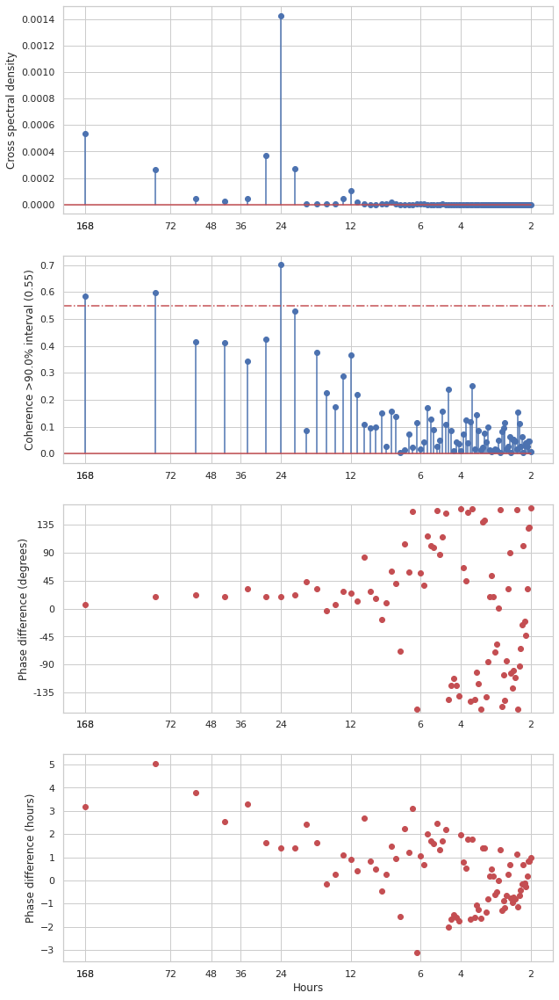

2021-05-25 00:06:13 INFO     762 (California): ASO_ext, Lt = 115.97 -- T: 24.0, coh: 0.7002013063674493, hr: 1.3897754353164886
2021-05-25 00:06:13 INFO     762 (California) (lat: 26.641, lon: -125): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:13 DEBUG    762: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-25 00:06:13 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:13 DEBUG    762: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-25 00:06:13 INFO     762 (California): JFM_ext, Lt = 32.0
2021-05-25 00:06:13 INFO     762: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:13 INFO     762: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-25 00:06:13 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-25 00:06:13 INFO     762: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

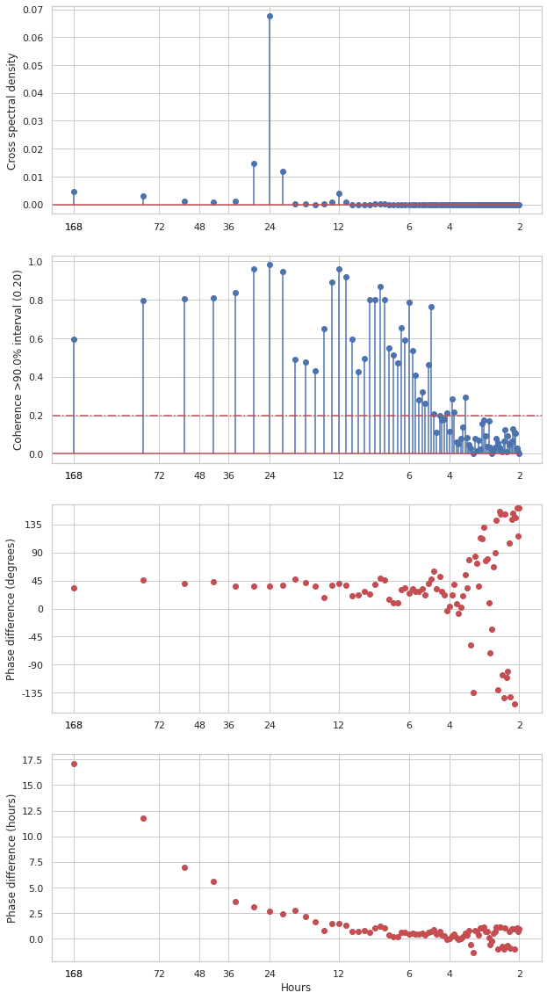

2021-05-25 00:06:15 INFO     762 (California): JFM_ext, Lt = 32.0 -- T: 24.0, coh: 0.9816514869953943, hr: 2.70006591133932
2021-05-25 00:06:15 INFO     771 (Canarias) (lat: 31.462, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:15 DEBUG    771: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/771_ASO_hours.npz
2021-05-25 00:06:15 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:15 DEBUG    771: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/771_ASO_hours.npz
2021-05-25 00:06:15 INFO     771 (Canarias): ASO_ext, Lt = 70.06
2021-05-25 00:06:15 INFO     771: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:15 INFO     771: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/771_ASO_ext_hours.npz
2021-05-25 00:06:15 INFO     771: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/771_ASO_ext_hours.npz
2021-05-25 00:06:15 INFO     771: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

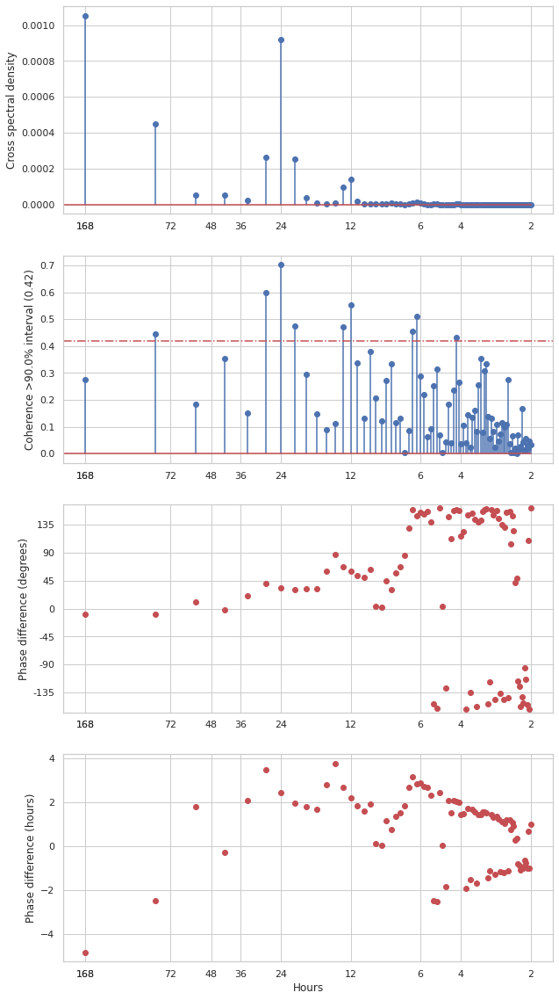

2021-05-25 00:06:17 INFO     771 (Canarias): ASO_ext, Lt = 70.06 -- T: 24.0, coh: 0.7014512789034001, hr: 2.455727515042148
2021-05-25 00:06:17 INFO     771 (Canarias) (lat: 31.462, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:17 DEBUG    771: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/771_JFM_hours.npz
2021-05-25 00:06:17 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:17 DEBUG    771: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/771_JFM_hours.npz
2021-05-25 00:06:17 INFO     771 (Canarias): JFM_ext, Lt = 60.0
2021-05-25 00:06:17 INFO     771: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:17 INFO     771: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/771_JFM_ext_hours.npz
2021-05-25 00:06:17 INFO     771: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/771_JFM_ext_hours.npz
2021-05-25 00:06:17 INFO     771: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least 

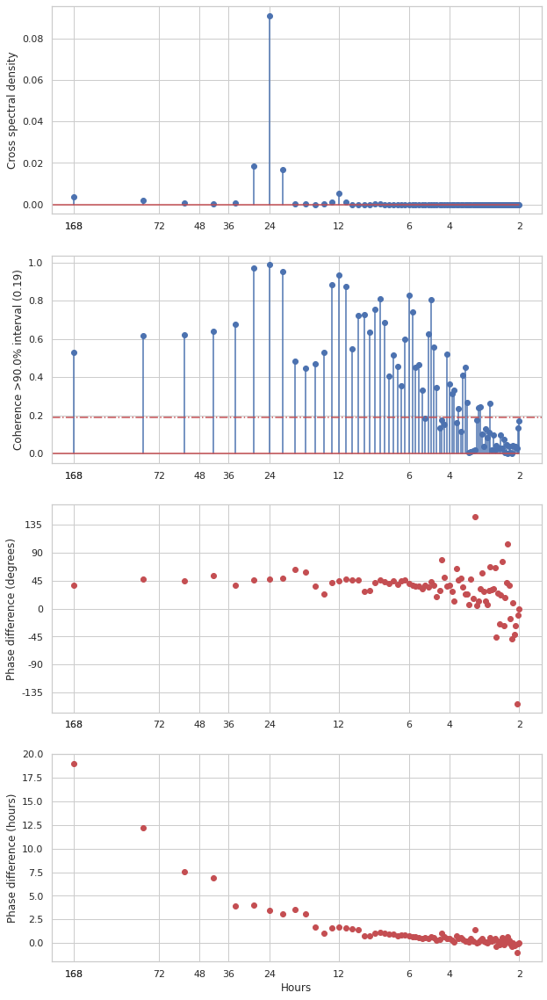

2021-05-25 00:06:20 INFO     771 (Canarias): JFM_ext, Lt = 60.0 -- T: 24.0, coh: 0.9874648271022408, hr: 3.5049201846232054
2021-05-25 00:06:20 INFO     750 (Canarias) (lat: 26.641, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:20 DEBUG    750: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-05-25 00:06:20 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:20 DEBUG    750: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-05-25 00:06:20 INFO     750 (Canarias): ASO_ext, Lt = 73.42
2021-05-25 00:06:20 INFO     750: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:20 INFO     750: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-05-25 00:06:20 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-05-25 00:06:20 INFO     750: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

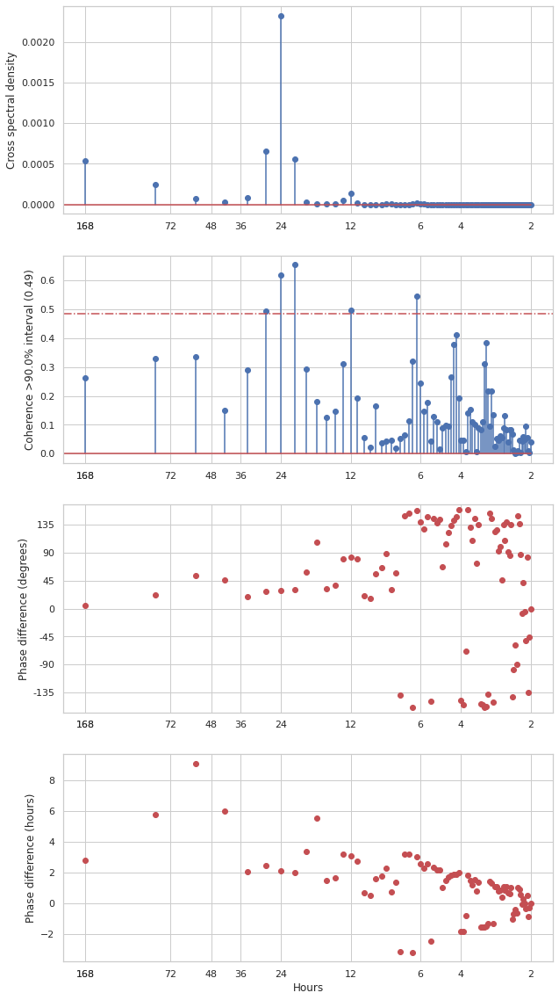

2021-05-25 00:06:22 INFO     750 (Canarias): ASO_ext, Lt = 73.42 -- T: 24.0, coh: 0.6191261729321398, hr: 2.1333943585622706
2021-05-25 00:06:22 INFO     750 (Canarias) (lat: 26.641, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:22 DEBUG    750: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-05-25 00:06:22 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:22 DEBUG    750: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-05-25 00:06:22 INFO     750 (Canarias): JFM_ext, Lt = 60.0
2021-05-25 00:06:22 INFO     750: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:22 INFO     750: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-05-25 00:06:22 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-05-25 00:06:22 INFO     750: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least

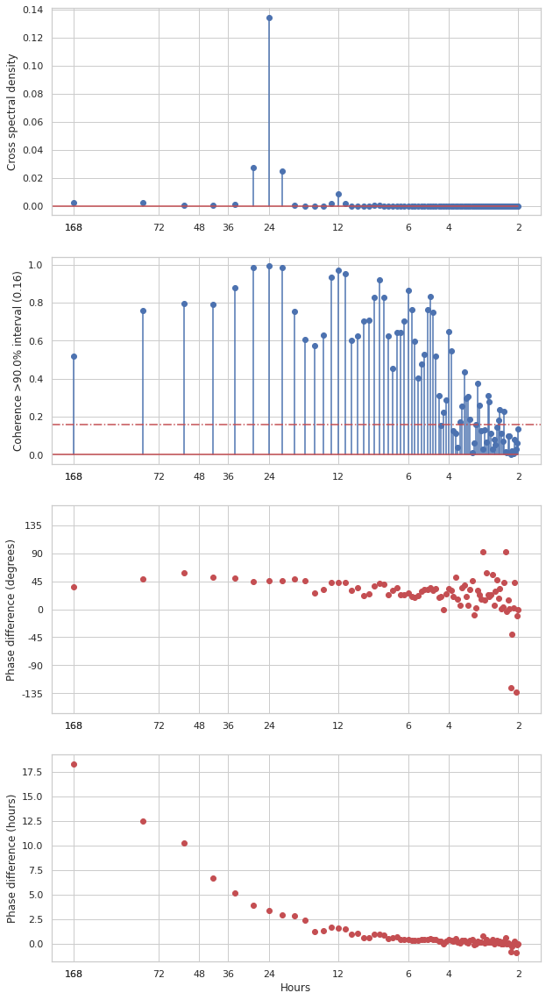

2021-05-25 00:06:24 INFO     750 (Canarias): JFM_ext, Lt = 60.0 -- T: 24.0, coh: 0.9913557042526933, hr: 3.35481655465325
2021-05-25 00:06:24 INFO     730 (Canarias) (lat: 21.611, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:24 DEBUG    730: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/730_ASO_hours.npz
2021-05-25 00:06:24 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:24 DEBUG    730: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/730_ASO_hours.npz
2021-05-25 00:06:24 INFO     730 (Canarias): ASO_ext, Lt = 77.7
2021-05-25 00:06:24 INFO     730: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:24 INFO     730: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/730_ASO_ext_hours.npz
2021-05-25 00:06:24 INFO     730: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/730_ASO_ext_hours.npz
2021-05-25 00:06:24 INFO     730: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least i

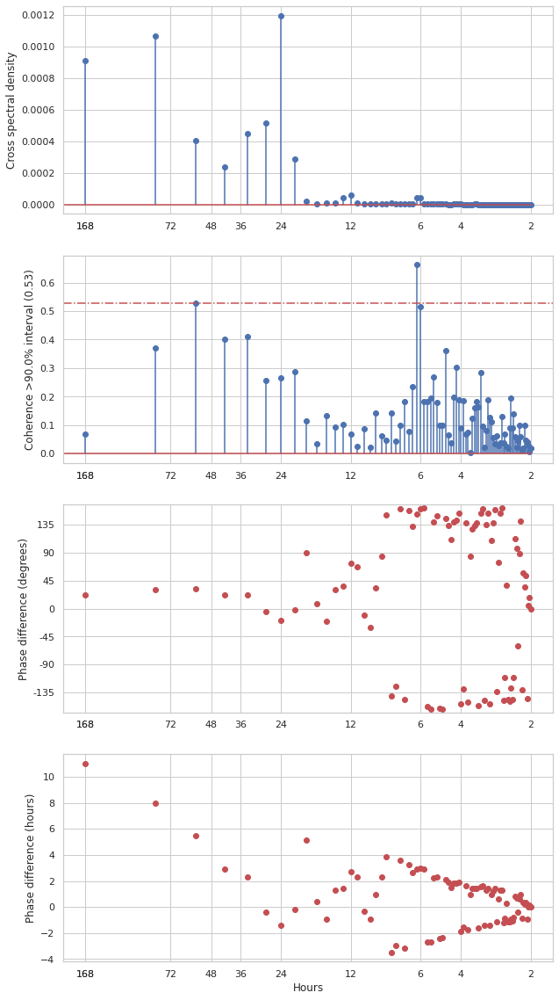

2021-05-25 00:06:27 INFO     730 (Canarias): ASO_ext, Lt = 77.7 -- T: 24.0, coh: 0.2672846025980308, hr: -1.3848612006841992
2021-05-25 00:06:27 INFO     730 (Canarias) (lat: 21.611, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:27 DEBUG    730: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/730_JFM_hours.npz
2021-05-25 00:06:27 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:27 DEBUG    730: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/730_JFM_hours.npz
2021-05-25 00:06:27 INFO     730 (Canarias): JFM_ext, Lt = 61.0
2021-05-25 00:06:27 INFO     730: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:27 INFO     730: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/730_JFM_ext_hours.npz
2021-05-25 00:06:27 INFO     730: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/730_JFM_ext_hours.npz
2021-05-25 00:06:27 INFO     730: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least

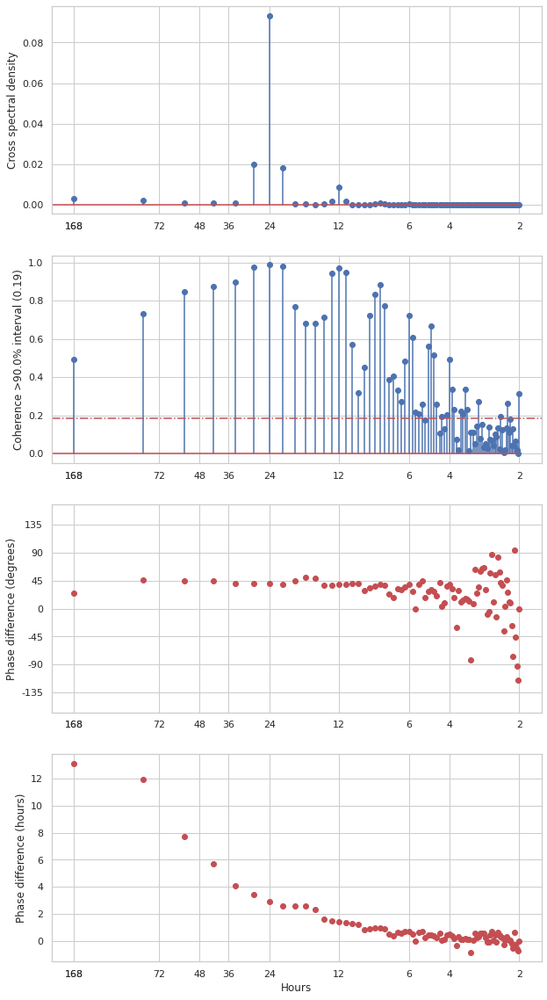

2021-05-25 00:06:29 INFO     730 (Canarias): JFM_ext, Lt = 61.0 -- T: 24.0, coh: 0.9864943564368678, hr: 2.9404055413036763
2021-05-25 00:06:29 INFO     709 (Canarias) (lat: 16.398, lon: -29): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:29 DEBUG    709: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/709_ASO_hours.npz
2021-05-25 00:06:29 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:29 DEBUG    709: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/709_ASO_hours.npz
2021-05-25 00:06:29 INFO     709 (Canarias): ASO_ext, Lt = 129.32
2021-05-25 00:06:29 INFO     709: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:29 INFO     709: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/709_ASO_ext_hours.npz
2021-05-25 00:06:29 INFO     709: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/709_ASO_ext_hours.npz
2021-05-25 00:06:29 INFO     709: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at lea

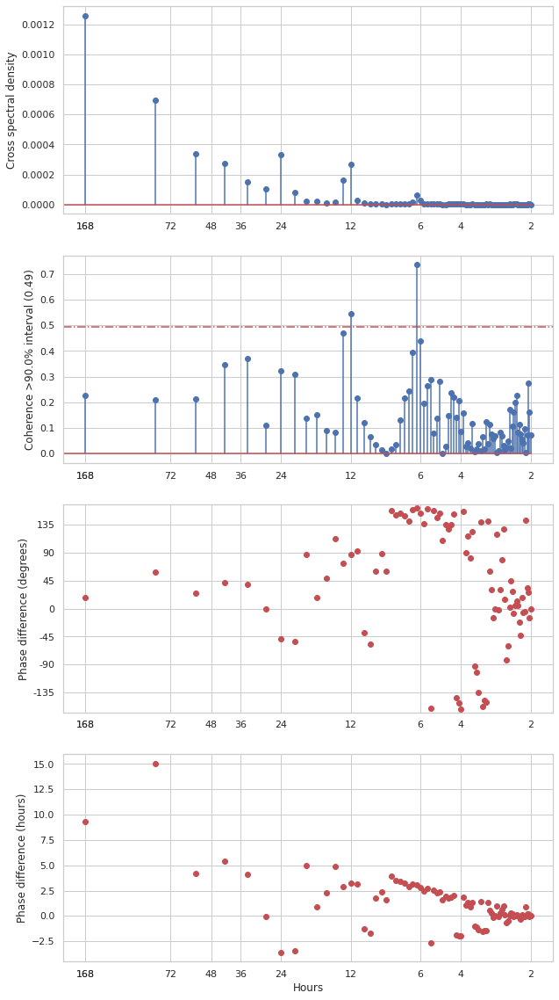

2021-05-25 00:06:31 INFO     709 (Canarias): ASO_ext, Lt = 129.32 -- T: 24.0, coh: 0.32444252024032993, hr: -3.5710229895906607
2021-05-25 00:06:31 INFO     709 (Canarias) (lat: 16.398, lon: -29): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:31 DEBUG    709: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/709_JFM_hours.npz
2021-05-25 00:06:31 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:31 DEBUG    709: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/709_JFM_hours.npz
2021-05-25 00:06:31 INFO     709 (Canarias): JFM_ext, Lt = 66.59
2021-05-25 00:06:31 INFO     709: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:31 INFO     709: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/709_JFM_ext_hours.npz
2021-05-25 00:06:31 INFO     709: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/709_JFM_ext_hours.npz
2021-05-25 00:06:31 INFO     709: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at l

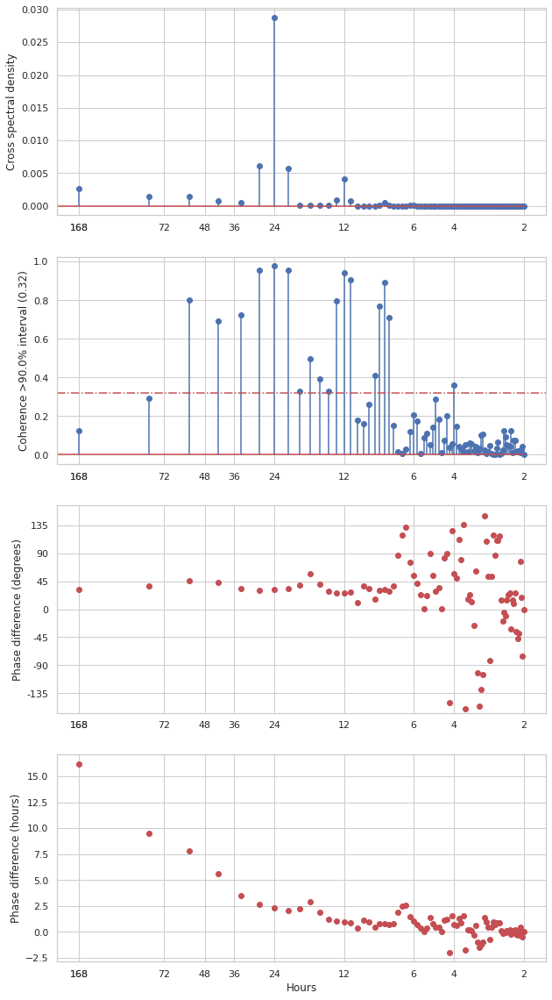

2021-05-25 00:06:34 INFO     709 (Canarias): JFM_ext, Lt = 66.59 -- T: 24.0, coh: 0.9762883291470282, hr: 2.3112375901131057
2021-05-25 00:06:34 INFO     596 (Peru) (lat: -16.398, lon: -83): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:34 DEBUG    596: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/596_ASO_hours.npz
2021-05-25 00:06:34 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:34 DEBUG    596: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/596_ASO_hours.npz
2021-05-25 00:06:34 INFO     596 (Peru): ASO_ext, Lt = 63.94
2021-05-25 00:06:34 INFO     596: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:34 INFO     596: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/596_ASO_ext_hours.npz
2021-05-25 00:06:34 INFO     596: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/596_ASO_ext_hours.npz
2021-05-25 00:06:34 INFO     596: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least incl

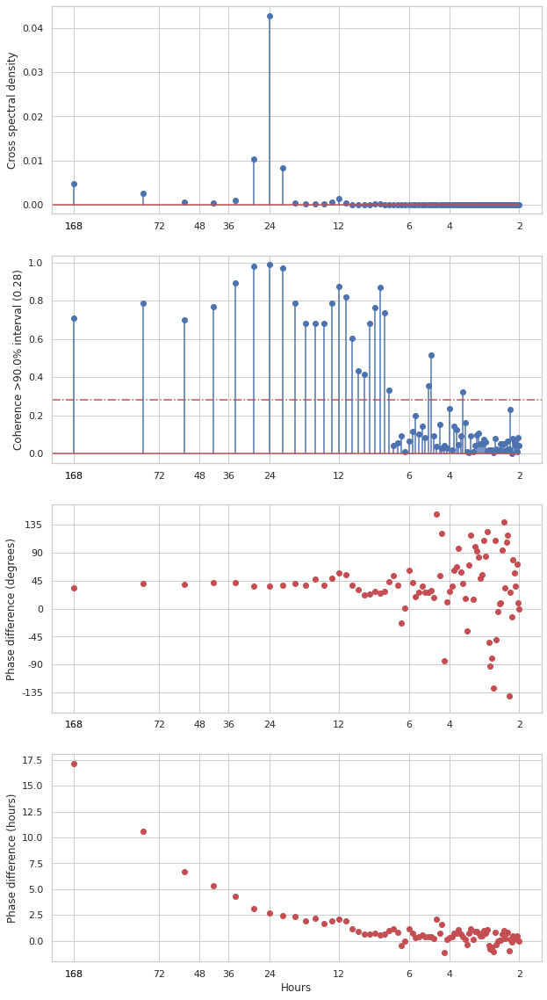

2021-05-25 00:06:36 INFO     596 (Peru): ASO_ext, Lt = 63.94 -- T: 24.0, coh: 0.9872249615909727, hr: 2.688056348348232
2021-05-25 00:06:36 INFO     596 (Peru) (lat: -16.398, lon: -83): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:36 DEBUG    596: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/596_JFM_hours.npz
2021-05-25 00:06:36 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:36 DEBUG    596: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/596_JFM_hours.npz
2021-05-25 00:06:36 INFO     596 (Peru): JFM_ext, Lt = 76.48
2021-05-25 00:06:36 INFO     596: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:36 INFO     596: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/596_JFM_ext_hours.npz
2021-05-25 00:06:36 INFO     596: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/596_JFM_ext_hours.npz
2021-05-25 00:06:36 INFO     596: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes w

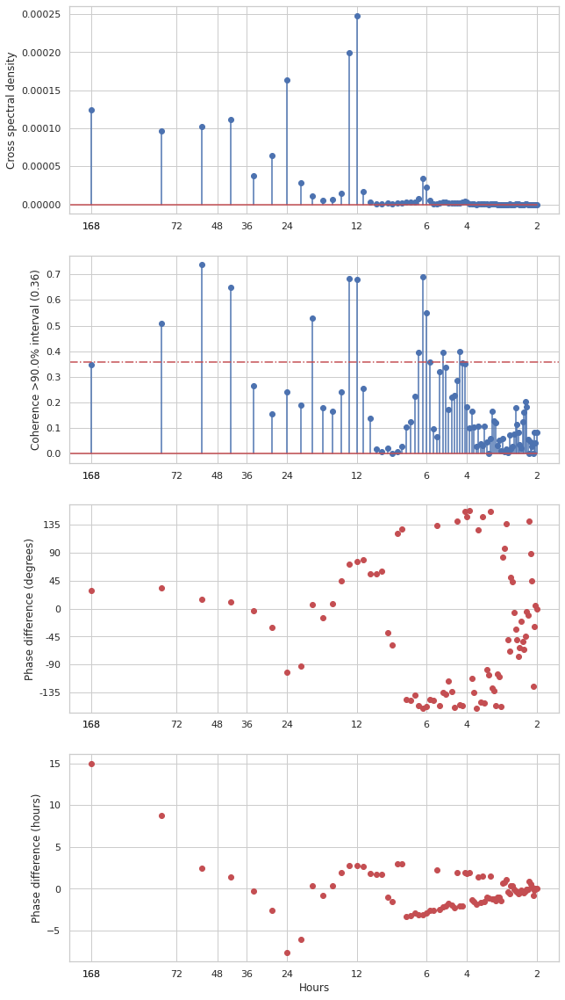

2021-05-25 00:06:38 INFO     596 (Peru): JFM_ext, Lt = 76.48 -- T: 24.0, coh: 0.24172438891865988, hr: -7.56921449118525
2021-05-25 00:06:38 INFO     572 (Peru) (lat: -21.611, lon: -77): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:38 DEBUG    572: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-25 00:06:38 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:38 DEBUG    572: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-25 00:06:38 INFO     572 (Peru): ASO_ext, Lt = 61.88
2021-05-25 00:06:38 INFO     572: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:38 INFO     572: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-25 00:06:38 INFO     572: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-25 00:06:38 INFO     572: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes

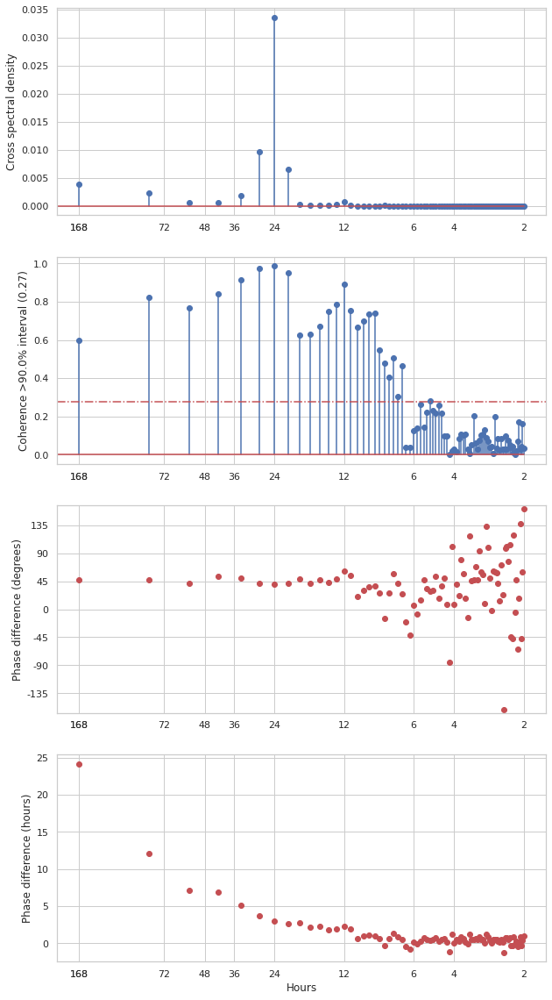

2021-05-25 00:06:41 INFO     572 (Peru): ASO_ext, Lt = 61.88 -- T: 24.0, coh: 0.9863853870060354, hr: 2.9991266358694326
2021-05-25 00:06:41 INFO     572 (Peru) (lat: -21.611, lon: -77): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:41 DEBUG    572: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-25 00:06:41 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:41 DEBUG    572: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-25 00:06:41 INFO     572 (Peru): JFM_ext, Lt = 74.28
2021-05-25 00:06:41 INFO     572: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:41 INFO     572: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-25 00:06:41 INFO     572: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-25 00:06:41 INFO     572: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes 

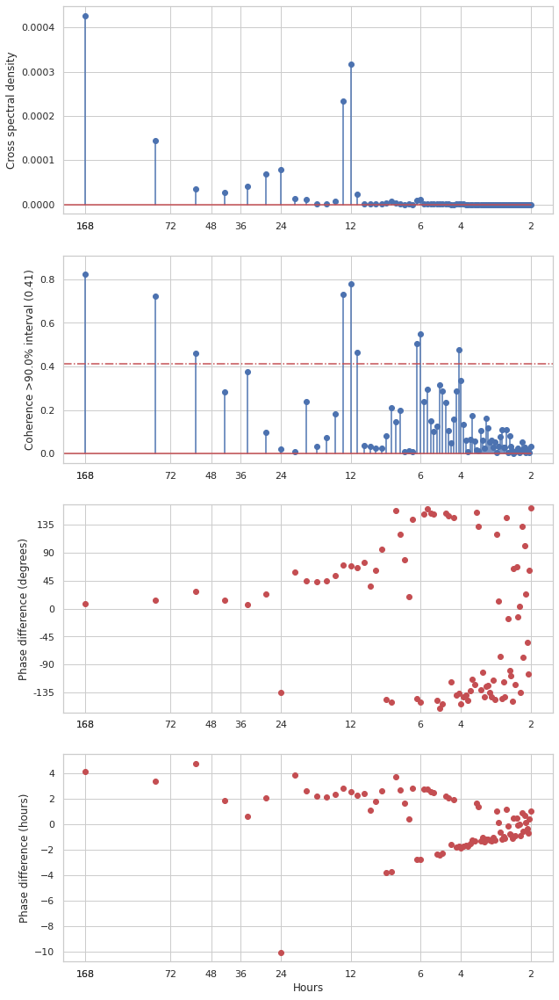

2021-05-25 00:06:43 INFO     572 (Peru): JFM_ext, Lt = 74.28 -- T: 24.0, coh: 0.021691541472919868, hr: -10.013418807307552
2021-05-25 00:06:43 INFO     450 (Peru) (lat: -40.411, lon: -83): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:43 DEBUG    450: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/450_ASO_hours.npz
2021-05-25 00:06:43 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:43 DEBUG    450: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/450_ASO_hours.npz
2021-05-25 00:06:43 INFO     450 (Peru): ASO_ext, Lt = 76.0
2021-05-25 00:06:43 INFO     450: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:43 INFO     450: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/450_ASO_ext_hours.npz
2021-05-25 00:06:43 INFO     450: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/450_ASO_ext_hours.npz
2021-05-25 00:06:43 INFO     450: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includ

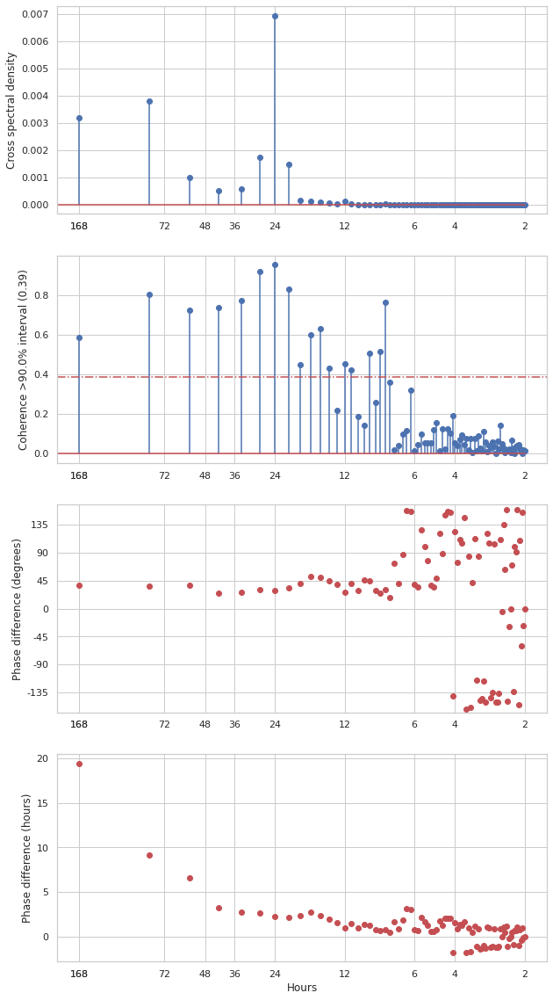

2021-05-25 00:06:45 INFO     450 (Peru): ASO_ext, Lt = 76.0 -- T: 24.0, coh: 0.9517575419483655, hr: 2.192113976555843
2021-05-25 00:06:45 INFO     450 (Peru) (lat: -40.411, lon: -83): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:45 DEBUG    450: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/450_JFM_hours.npz
2021-05-25 00:06:45 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:45 DEBUG    450: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/450_JFM_hours.npz
2021-05-25 00:06:46 INFO     450 (Peru): JFM_ext, Lt = 66.23
2021-05-25 00:06:46 INFO     450: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:46 INFO     450: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/450_JFM_ext_hours.npz
2021-05-25 00:06:46 INFO     450: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/450_JFM_ext_hours.npz
2021-05-25 00:06:46 INFO     450: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes wh

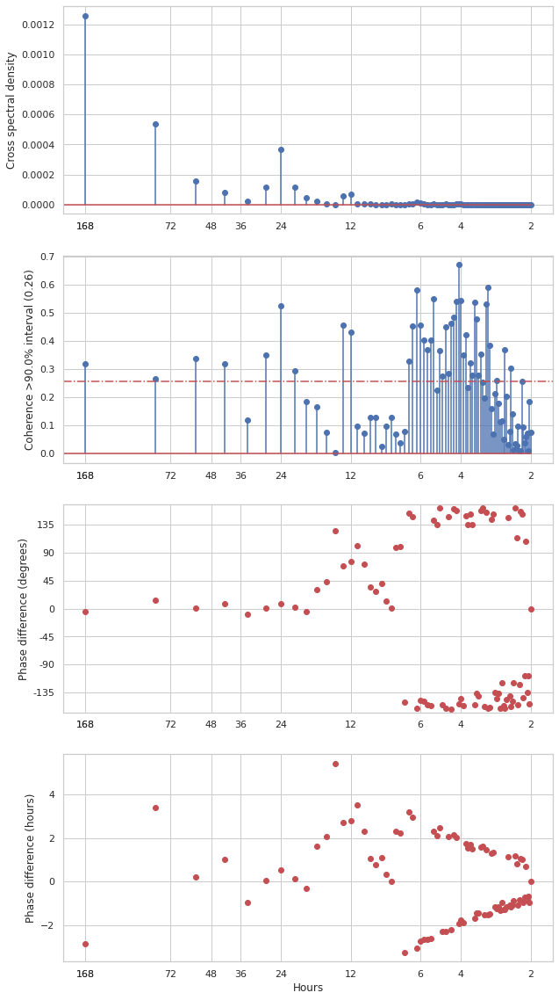

2021-05-25 00:06:48 INFO     450 (Peru): JFM_ext, Lt = 66.23 -- T: 24.0, coh: 0.5268571653162962, hr: 0.5356799832066468
2021-05-25 00:06:48 INFO     602 (Benguela) (lat: -11.032, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:48 DEBUG    602: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/602_ASO_hours.npz
2021-05-25 00:06:48 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:48 DEBUG    602: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/602_ASO_hours.npz
2021-05-25 00:06:48 INFO     602 (Benguela): ASO_ext, Lt = 64.44
2021-05-25 00:06:48 INFO     602: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:48 INFO     602: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/602_ASO_ext_hours.npz
2021-05-25 00:06:48 INFO     602: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/602_ASO_ext_hours.npz
2021-05-25 00:06:48 INFO     602: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least in

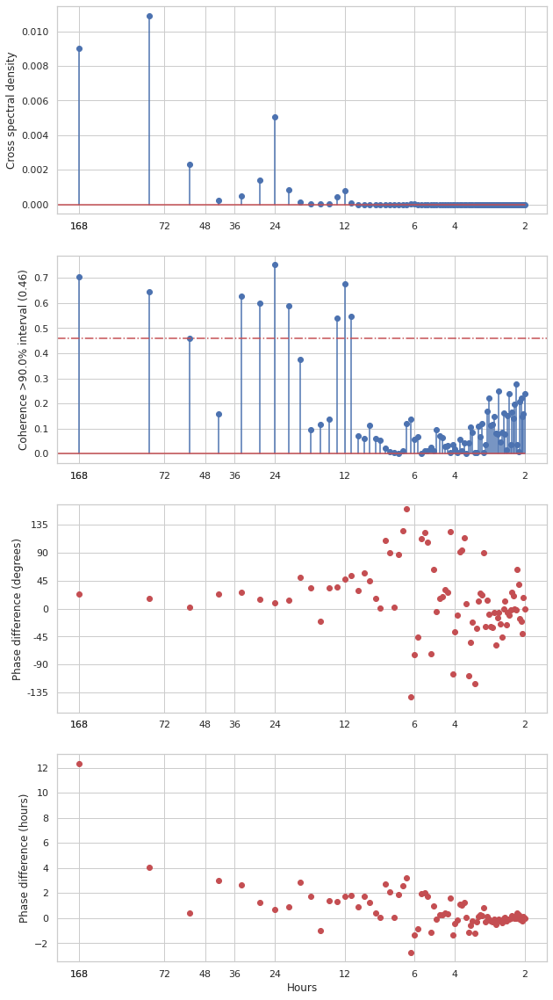

2021-05-25 00:06:50 INFO     602 (Benguela): ASO_ext, Lt = 64.44 -- T: 24.0, coh: 0.7518034184804033, hr: 0.7211208710234193
2021-05-25 00:06:50 INFO     602 (Benguela) (lat: -11.032, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:50 DEBUG    602: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/602_JFM_hours.npz
2021-05-25 00:06:50 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:50 DEBUG    602: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/602_JFM_hours.npz
2021-05-25 00:06:50 INFO     602 (Benguela): JFM_ext, Lt = 125.72
2021-05-25 00:06:50 INFO     602: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:50 INFO     602: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/602_JFM_ext_hours.npz
2021-05-25 00:06:50 INFO     602: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/602_JFM_ext_hours.npz
2021-05-25 00:06:50 INFO     602: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

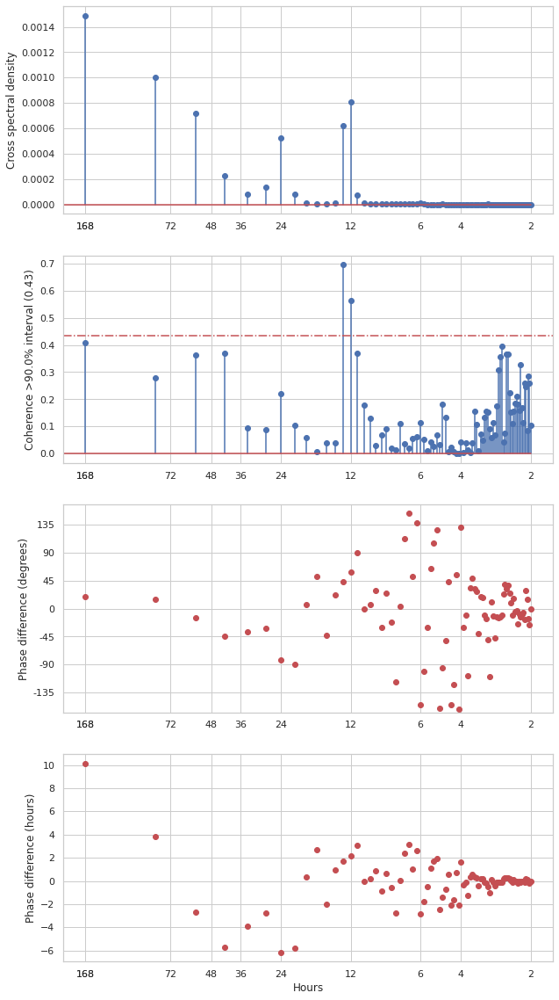

2021-05-25 00:06:53 INFO     602 (Benguela): JFM_ext, Lt = 125.72 -- T: 24.0, coh: 0.22041360731447804, hr: -6.134800671639081
2021-05-25 00:06:53 INFO     578 (Benguela) (lat: -16.398, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:53 DEBUG    578: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-05-25 00:06:53 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:53 DEBUG    578: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-05-25 00:06:53 INFO     578 (Benguela): ASO_ext, Lt = 64.19
2021-05-25 00:06:53 INFO     578: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:53 INFO     578: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/578_ASO_ext_hours.npz
2021-05-25 00:06:53 INFO     578: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/578_ASO_ext_hours.npz
2021-05-25 00:06:53 INFO     578: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at le

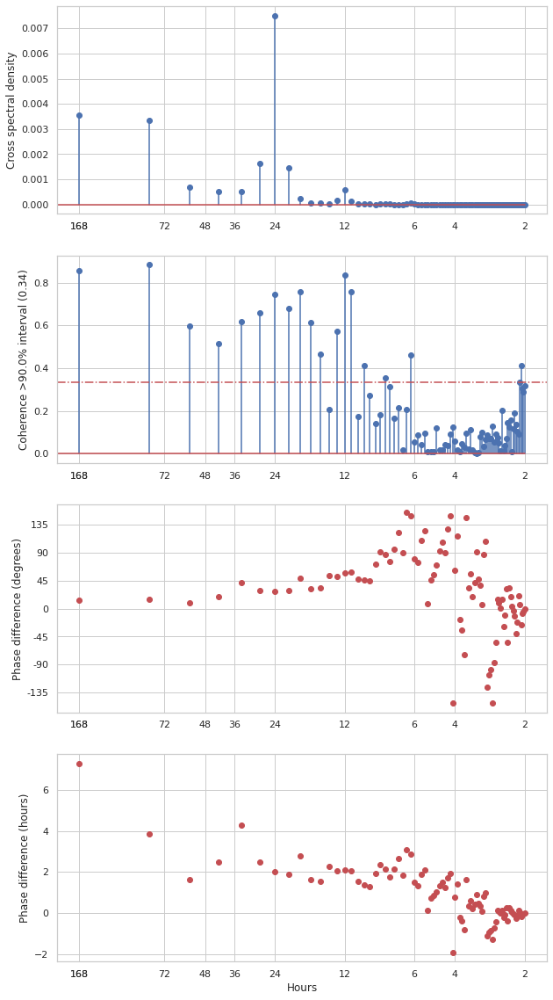

2021-05-25 00:06:55 INFO     578 (Benguela): ASO_ext, Lt = 64.19 -- T: 24.0, coh: 0.7436331595099579, hr: 2.0275484771636227
2021-05-25 00:06:55 INFO     578 (Benguela) (lat: -16.398, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:06:55 DEBUG    578: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-05-25 00:06:55 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:55 DEBUG    578: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-05-25 00:06:55 INFO     578 (Benguela): JFM_ext, Lt = 122.71
2021-05-25 00:06:55 INFO     578: JFM_ext (style=full) -- Ensuring
2021-05-25 00:06:55 INFO     578: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/578_JFM_ext_hours.npz
2021-05-25 00:06:55 INFO     578: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/578_JFM_ext_hours.npz
2021-05-25 00:06:55 INFO     578: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

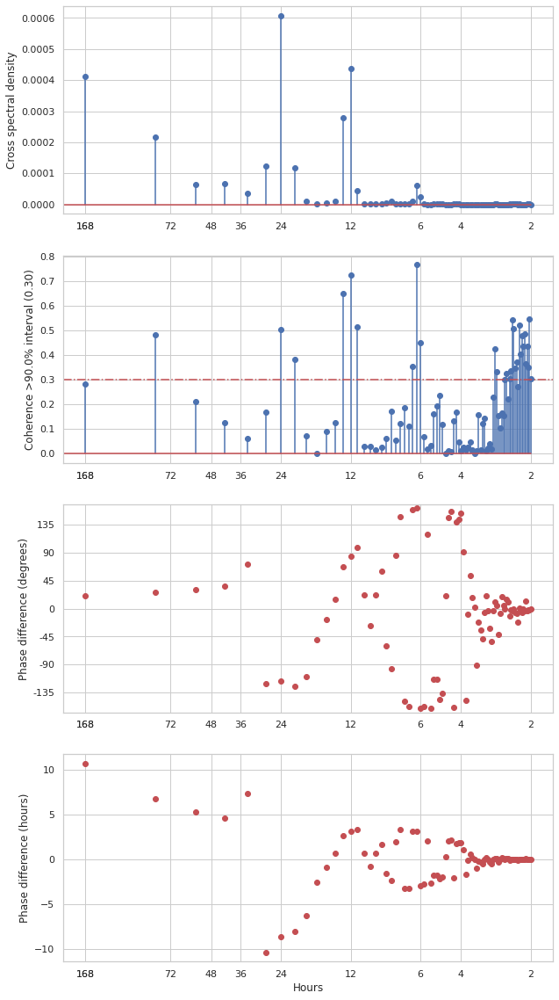

2021-05-25 00:06:57 INFO     578 (Benguela): JFM_ext, Lt = 122.71 -- T: 24.0, coh: 0.5027942345603432, hr: -8.635628600782262
2021-05-25 00:06:57 INFO     533 (Benguela) (lat: -26.641, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:06:57 DEBUG    533: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/533_ASO_hours.npz
2021-05-25 00:06:57 INFO     Spectra file exists. Skipping.
2021-05-25 00:06:57 DEBUG    533: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/533_ASO_hours.npz
2021-05-25 00:06:57 INFO     533 (Benguela): ASO_ext, Lt = 61.3
2021-05-25 00:06:57 INFO     533: ASO_ext (style=full) -- Ensuring
2021-05-25 00:06:57 INFO     533: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-05-25 00:06:57 INFO     533: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-05-25 00:06:57 INFO     533: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

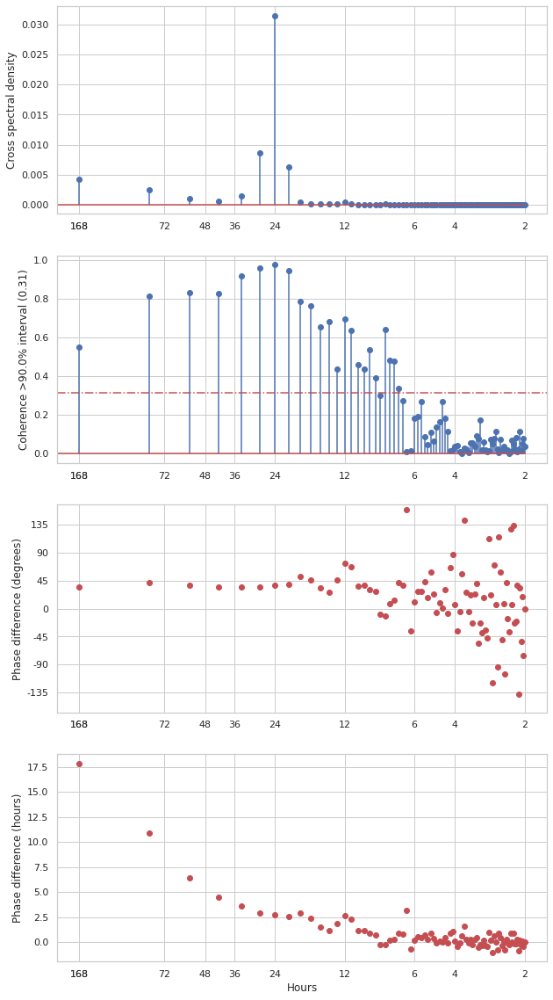

2021-05-25 00:07:00 INFO     533 (Benguela): ASO_ext, Lt = 61.3 -- T: 24.0, coh: 0.9734695628737831, hr: 2.735264453492842
2021-05-25 00:07:00 INFO     533 (Benguela) (lat: -26.641, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:00 DEBUG    533: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/533_JFM_hours.npz
2021-05-25 00:07:00 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:00 DEBUG    533: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/533_JFM_hours.npz
2021-05-25 00:07:00 INFO     533 (Benguela): JFM_ext, Lt = 119.46
2021-05-25 00:07:00 INFO     533: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:00 INFO     533: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-05-25 00:07:00 INFO     533: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-05-25 00:07:00 INFO     533: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least 

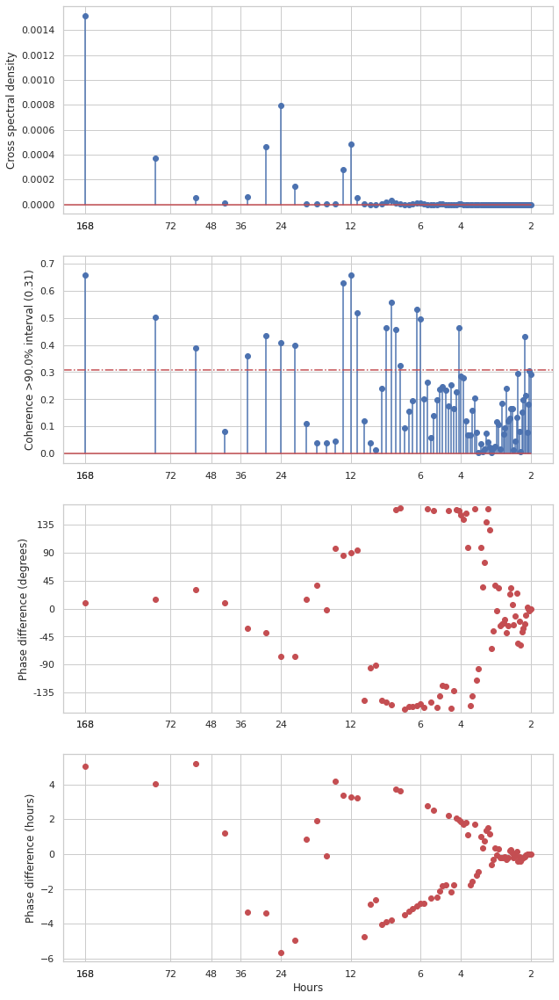

2021-05-25 00:07:02 INFO     533 (Benguela): JFM_ext, Lt = 119.46 -- T: 24.0, coh: 0.40945746879643, hr: -5.639192482819392


In [32]:
phasediff_slice = slice(0,91*24)
calc_phasediff("California", t_idx_slice=phasediff_slice, days_window=7)
calc_phasediff("Canarias", t_idx_slice=phasediff_slice, days_window=7)
calc_phasediff("Peru", t_idx_slice=phasediff_slice, days_window=7)
calc_phasediff("Benguela", t_idx_slice=phasediff_slice, days_window=7)

2021-05-25 00:07:02 INFO     868 (California) (lat: 48.383, lon: -137): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:02 DEBUG    868: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/868_ASO_hours.npz
2021-05-25 00:07:02 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:02 DEBUG    868: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/868_ASO_hours.npz
2021-05-25 00:07:02 INFO     868 (California): ASO_ext, Lt = 97.52
2021-05-25 00:07:02 INFO     868: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:02 INFO     868: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/868_ASO_ext_hours.npz
2021-05-25 00:07:02 INFO     868: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/868_ASO_ext_hours.npz
2021-05-25 00:07:02 INFO     868: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,9935)
2021-05-25 00:07:02 INFO     868: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats

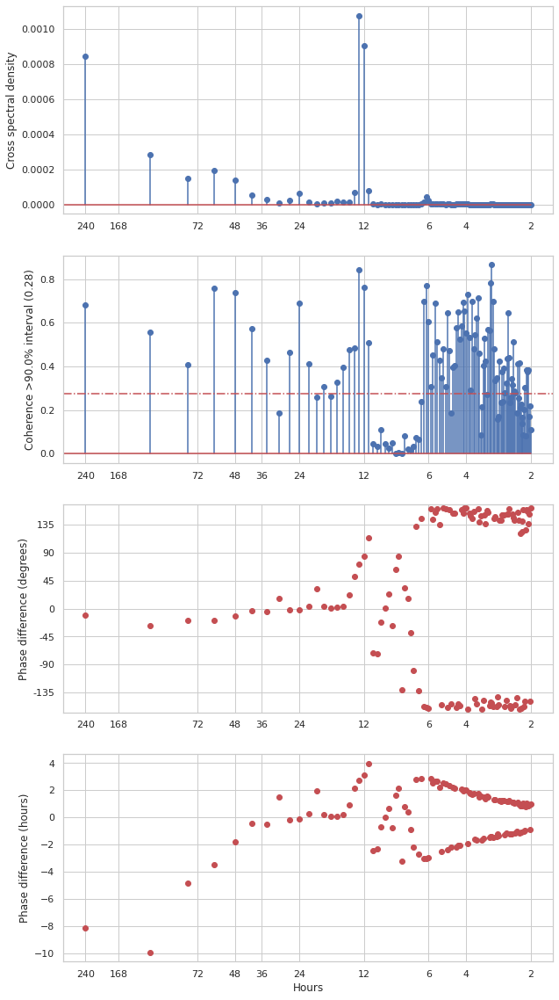

2021-05-25 00:07:04 INFO     868 (California): ASO_ext, Lt = 97.52 -- T: 24.0, coh: 0.6913527092159523, hr: -0.13904733865417498
2021-05-25 00:07:04 INFO     868 (California) (lat: 48.383, lon: -137): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:04 DEBUG    868: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/868_JFM_hours.npz
2021-05-25 00:07:04 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:04 DEBUG    868: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/868_JFM_hours.npz
2021-05-25 00:07:04 INFO     868 (California): JFM_ext, Lt = 40.0
2021-05-25 00:07:04 INFO     868: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:04 INFO     868: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/868_JFM_ext_hours.npz
2021-05-25 00:07:04 INFO     868: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/868_JFM_ext_hours.npz
2021-05-25 00:07:04 INFO     868: JFM_ext -- File exists for the same parameters, and time slice (2640,5543)

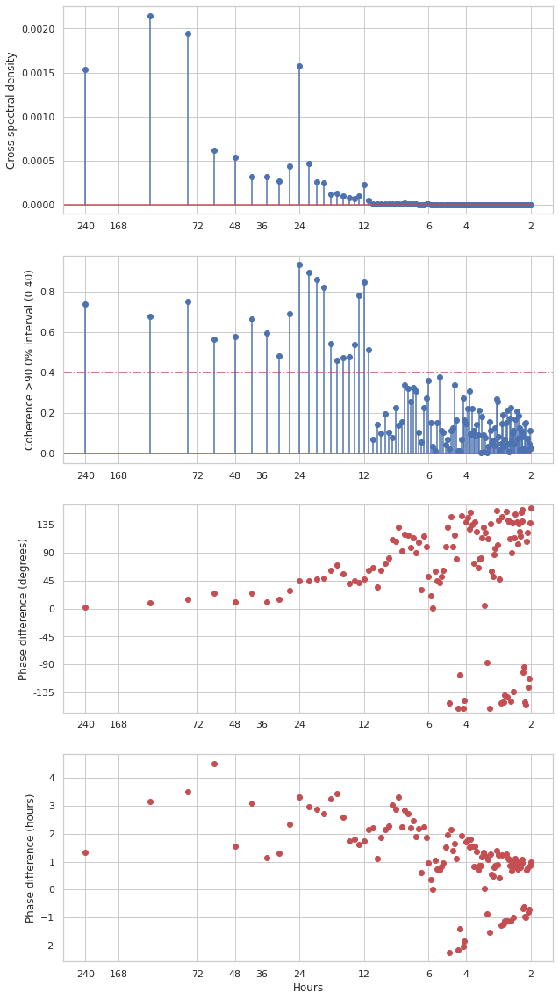

2021-05-25 00:07:07 INFO     868 (California): JFM_ext, Lt = 40.0 -- T: 24.0, coh: 0.9339077265362434, hr: 3.313542766179287
2021-05-25 00:07:07 INFO     852 (California) (lat: 44.521, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:07 DEBUG    852: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-05-25 00:07:07 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:07 DEBUG    852: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-05-25 00:07:07 INFO     852 (California): ASO_ext, Lt = 118.7
2021-05-25 00:07:07 INFO     852: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:07 INFO     852: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/852_ASO_ext_hours.npz
2021-05-25 00:07:07 INFO     852: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/852_ASO_ext_hours.npz
2021-05-25 00:07:07 INFO     852: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) a

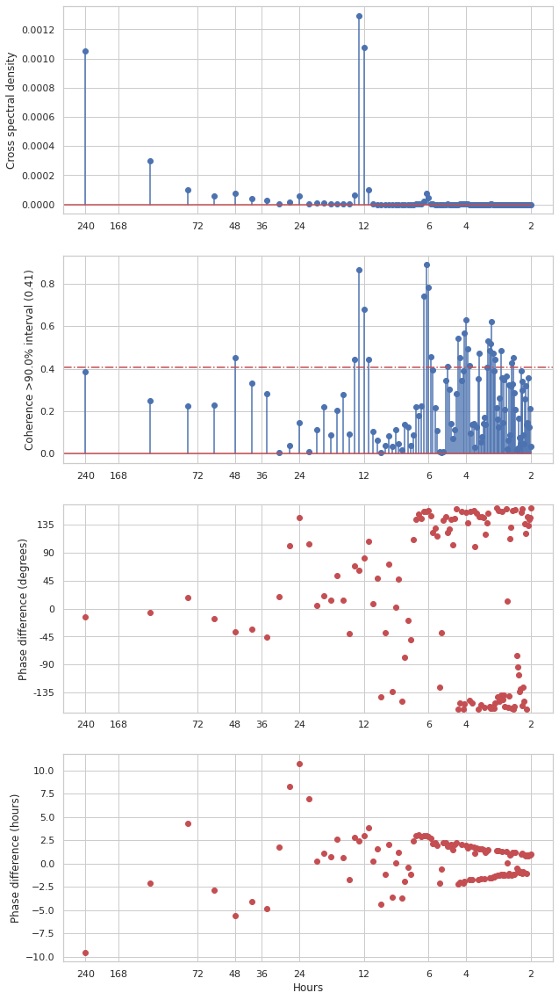

2021-05-25 00:07:09 INFO     852 (California): ASO_ext, Lt = 118.7 -- T: 24.0, coh: 0.14679510668736506, hr: 10.76621647980683
2021-05-25 00:07:09 INFO     852 (California) (lat: 44.521, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:09 DEBUG    852: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-05-25 00:07:09 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:09 DEBUG    852: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-05-25 00:07:09 INFO     852 (California): JFM_ext, Lt = 44.5
2021-05-25 00:07:09 INFO     852: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:09 INFO     852: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/852_JFM_ext_hours.npz
2021-05-25 00:07:09 INFO     852: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/852_JFM_ext_hours.npz
2021-05-25 00:07:09 INFO     852: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) a

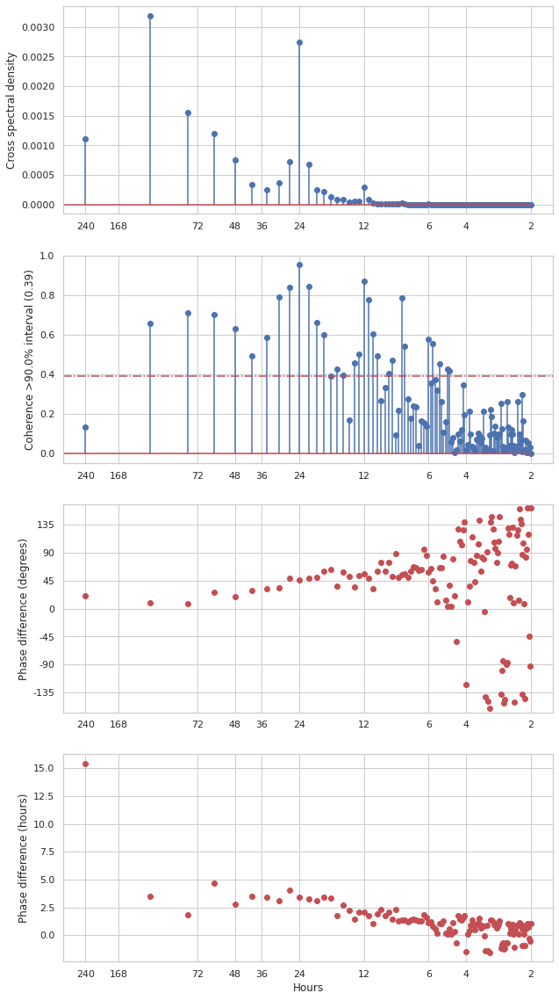

2021-05-25 00:07:11 INFO     852 (California): JFM_ext, Lt = 44.5 -- T: 24.0, coh: 0.9539941965113873, hr: 3.394527269608655
2021-05-25 00:07:11 INFO     831 (California) (lat: 40.411, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:11 DEBUG    831: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/831_ASO_hours.npz
2021-05-25 00:07:11 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:11 DEBUG    831: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/831_ASO_hours.npz
2021-05-25 00:07:11 INFO     831 (California): ASO_ext, Lt = 172.16
2021-05-25 00:07:11 INFO     831: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:11 INFO     831: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/831_ASO_ext_hours.npz
2021-05-25 00:07:11 INFO     831: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/831_ASO_ext_hours.npz
2021-05-25 00:07:11 INFO     831: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

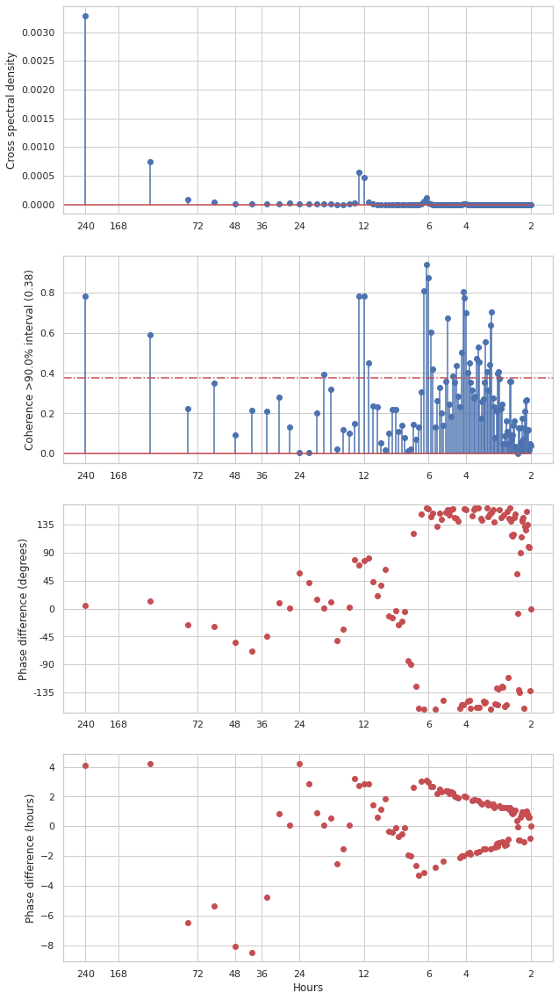

2021-05-25 00:07:14 INFO     831 (California): ASO_ext, Lt = 172.16 -- T: 24.0, coh: 0.004306805841971535, hr: 4.226189848124634
2021-05-25 00:07:14 INFO     831 (California) (lat: 40.411, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:14 DEBUG    831: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/831_JFM_hours.npz
2021-05-25 00:07:14 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:14 DEBUG    831: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/831_JFM_hours.npz
2021-05-25 00:07:14 INFO     831 (California): JFM_ext, Lt = 37.18
2021-05-25 00:07:14 INFO     831: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:14 INFO     831: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/831_JFM_ext_hours.npz
2021-05-25 00:07:14 INFO     831: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/831_JFM_ext_hours.npz
2021-05-25 00:07:14 INFO     831: JFM_ext -- File exists for the same parameters, and time slice (2640,5543

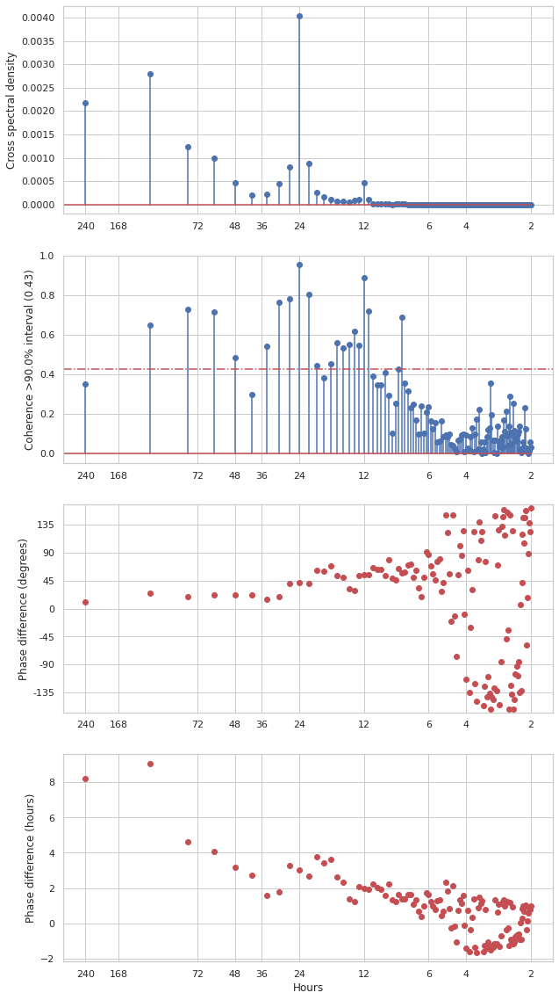

2021-05-25 00:07:16 INFO     831 (California): JFM_ext, Lt = 37.18 -- T: 24.0, coh: 0.9525639944200162, hr: 3.027583547658238
2021-05-25 00:07:16 INFO     809 (California) (lat: 36.056, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:16 DEBUG    809: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/809_ASO_hours.npz
2021-05-25 00:07:16 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:16 DEBUG    809: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/809_ASO_hours.npz
2021-05-25 00:07:16 INFO     809 (California): ASO_ext, Lt = 94.29
2021-05-25 00:07:16 INFO     809: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:16 INFO     809: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/809_ASO_ext_hours.npz
2021-05-25 00:07:16 INFO     809: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/809_ASO_ext_hours.npz
2021-05-25 00:07:16 INFO     809: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

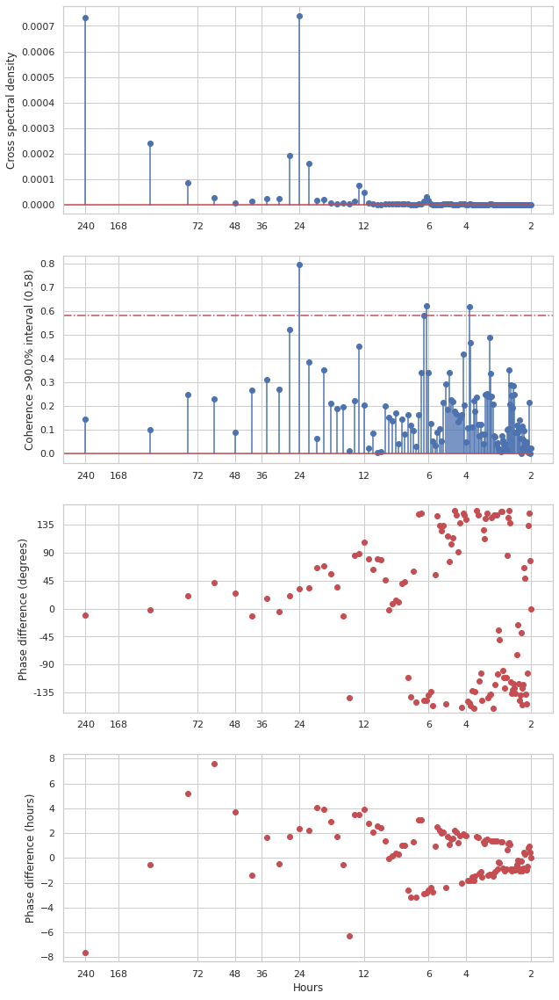

2021-05-25 00:07:19 INFO     809 (California): ASO_ext, Lt = 94.29 -- T: 24.0, coh: 0.7954017861842116, hr: 2.3350894630345005
2021-05-25 00:07:19 INFO     809 (California) (lat: 36.056, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:19 DEBUG    809: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/809_JFM_hours.npz
2021-05-25 00:07:19 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:19 DEBUG    809: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/809_JFM_hours.npz
2021-05-25 00:07:19 INFO     809 (California): JFM_ext, Lt = 41.19
2021-05-25 00:07:19 INFO     809: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:19 INFO     809: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/809_JFM_ext_hours.npz
2021-05-25 00:07:19 INFO     809: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/809_JFM_ext_hours.npz
2021-05-25 00:07:19 INFO     809: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

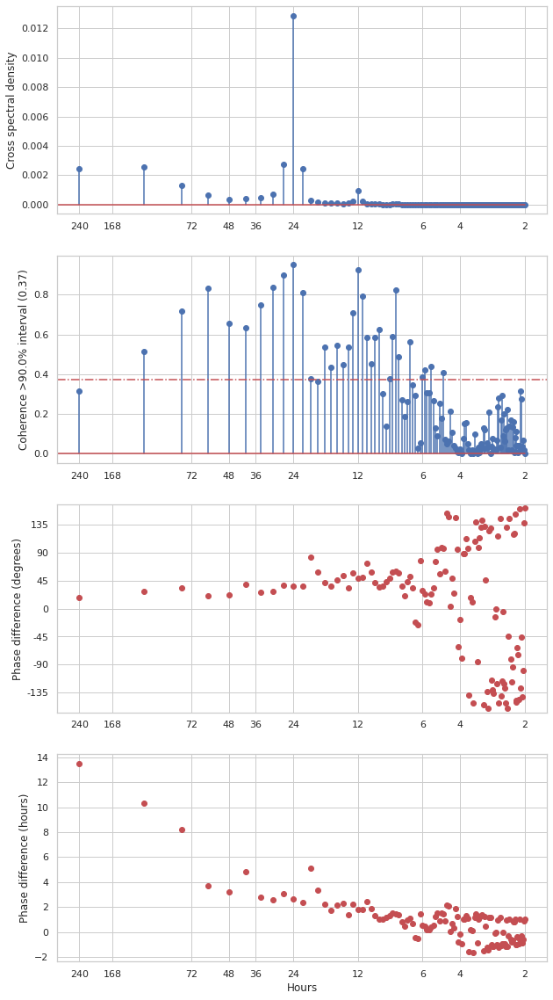

2021-05-25 00:07:21 INFO     809 (California): JFM_ext, Lt = 41.19 -- T: 24.0, coh: 0.9495956527885334, hr: 2.6756693805187024
2021-05-25 00:07:21 INFO     787 (California) (lat: 31.462, lon: -125): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:21 DEBUG    787: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/787_ASO_hours.npz
2021-05-25 00:07:21 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:21 DEBUG    787: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/787_ASO_hours.npz
2021-05-25 00:07:21 INFO     787 (California): ASO_ext, Lt = 107.77
2021-05-25 00:07:21 INFO     787: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:21 INFO     787: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/787_ASO_ext_hours.npz
2021-05-25 00:07:21 INFO     787: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/787_ASO_ext_hours.npz
2021-05-25 00:07:21 INFO     787: ASO_ext -- File exists for the same parameters, and time slice (7752,10295

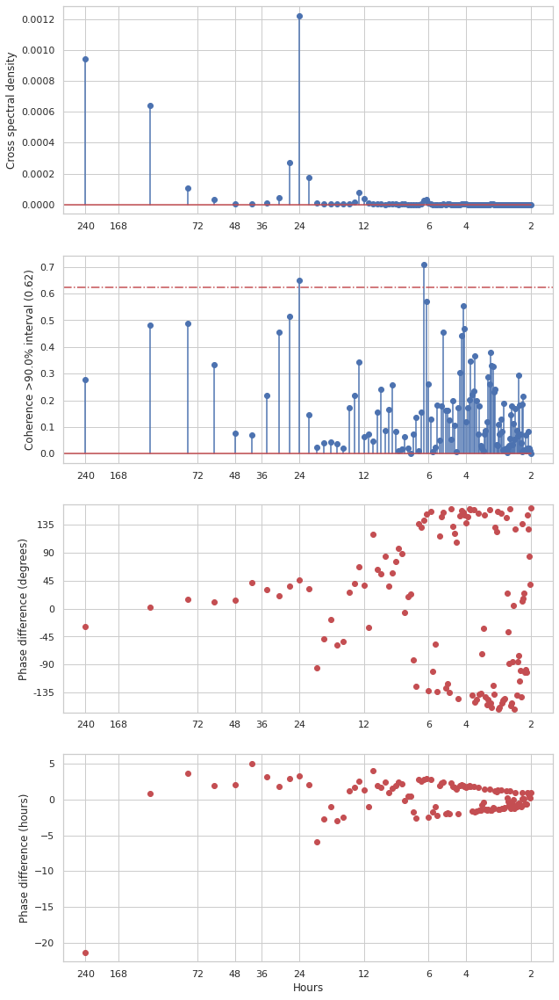

2021-05-25 00:07:23 INFO     787 (California): ASO_ext, Lt = 107.77 -- T: 24.0, coh: 0.6484161807810394, hr: 3.3416195804108626
2021-05-25 00:07:23 INFO     787 (California) (lat: 31.462, lon: -125): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:23 DEBUG    787: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/787_JFM_hours.npz
2021-05-25 00:07:23 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:23 DEBUG    787: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/787_JFM_hours.npz
2021-05-25 00:07:23 INFO     787 (California): JFM_ext, Lt = 32.0
2021-05-25 00:07:23 INFO     787: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:23 INFO     787: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/787_JFM_ext_hours.npz
2021-05-25 00:07:23 INFO     787: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/787_JFM_ext_hours.npz
2021-05-25 00:07:23 INFO     787: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

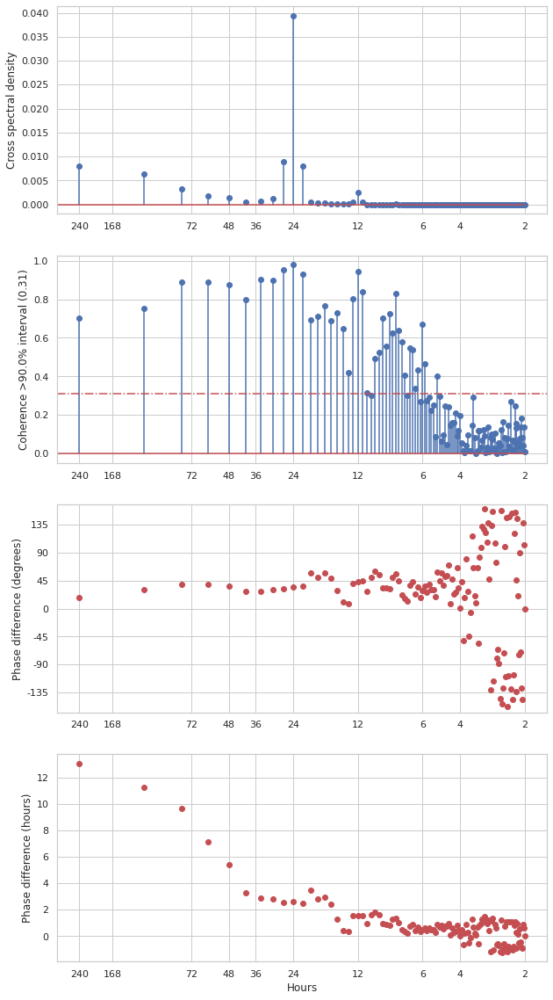

2021-05-25 00:07:26 INFO     787 (California): JFM_ext, Lt = 32.0 -- T: 24.0, coh: 0.9778219304796533, hr: 2.598827808082101
2021-05-25 00:07:26 INFO     762 (California) (lat: 26.641, lon: -125): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:26 DEBUG    762: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-25 00:07:26 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:26 DEBUG    762: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-25 00:07:26 INFO     762 (California): ASO_ext, Lt = 115.97
2021-05-25 00:07:26 INFO     762: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:26 INFO     762: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-25 00:07:26 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-25 00:07:26 INFO     762: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

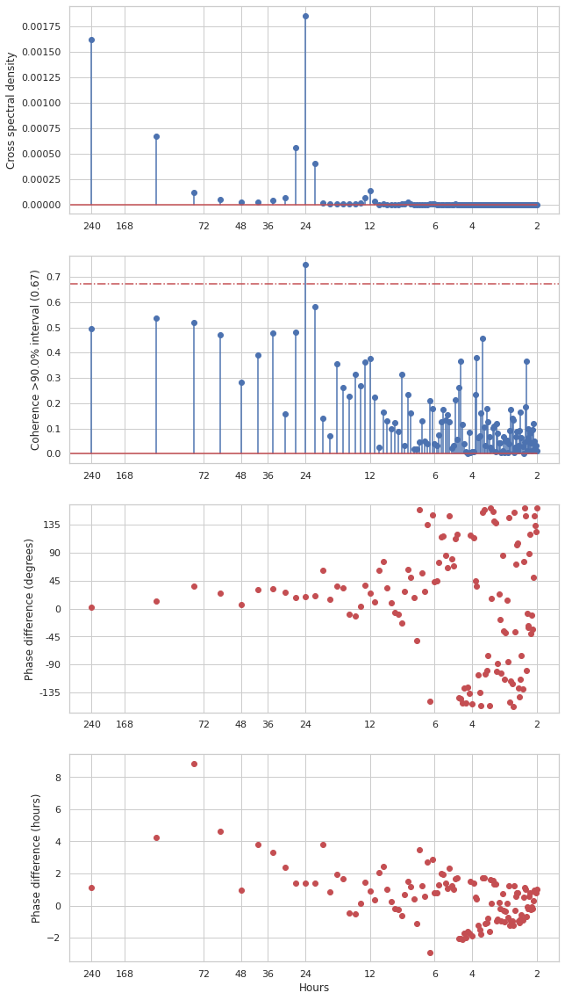

2021-05-25 00:07:28 INFO     762 (California): ASO_ext, Lt = 115.97 -- T: 24.0, coh: 0.7472200082575099, hr: 1.416956394309164
2021-05-25 00:07:28 INFO     762 (California) (lat: 26.641, lon: -125): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:28 DEBUG    762: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-25 00:07:28 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:28 DEBUG    762: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-25 00:07:28 INFO     762 (California): JFM_ext, Lt = 32.0
2021-05-25 00:07:28 INFO     762: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:28 INFO     762: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-25 00:07:28 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-25 00:07:28 INFO     762: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) a

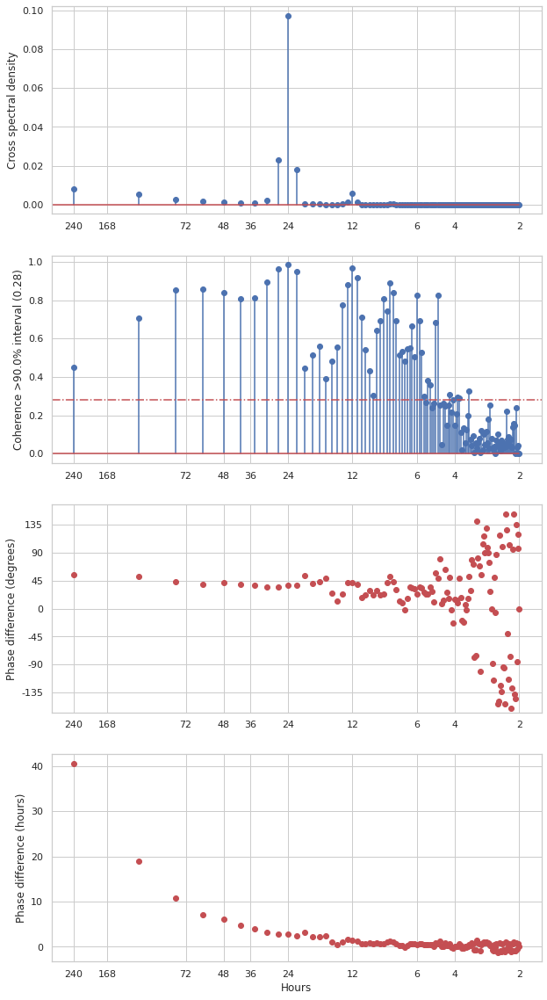

2021-05-25 00:07:31 INFO     762 (California): JFM_ext, Lt = 32.0 -- T: 24.0, coh: 0.9845446499278694, hr: 2.7149364602356605
2021-05-25 00:07:31 INFO     771 (Canarias) (lat: 31.462, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:31 DEBUG    771: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/771_ASO_hours.npz
2021-05-25 00:07:31 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:31 DEBUG    771: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/771_ASO_hours.npz
2021-05-25 00:07:31 INFO     771 (Canarias): ASO_ext, Lt = 70.06
2021-05-25 00:07:31 INFO     771: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:31 INFO     771: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/771_ASO_ext_hours.npz
2021-05-25 00:07:31 INFO     771: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/771_ASO_ext_hours.npz
2021-05-25 00:07:31 INFO     771: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at le

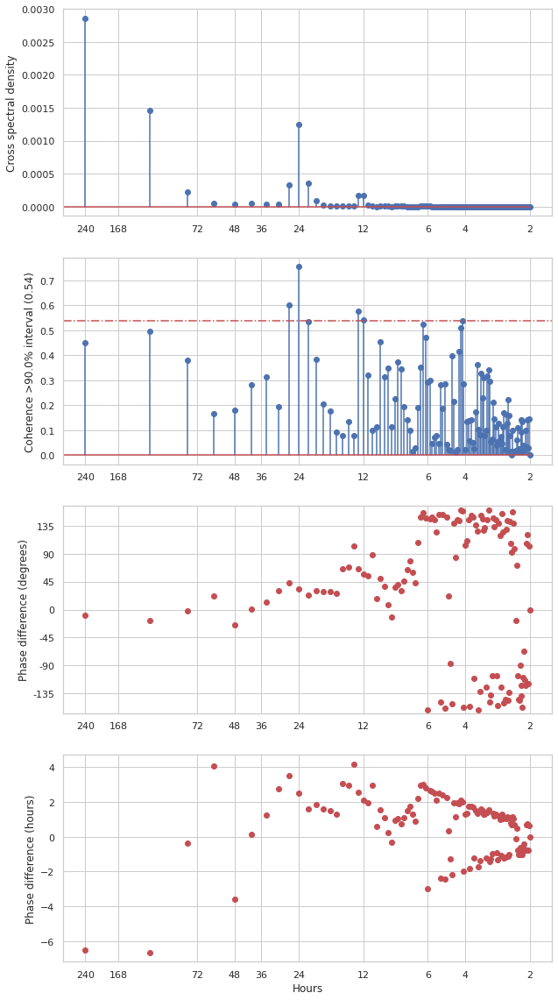

2021-05-25 00:07:33 INFO     771 (Canarias): ASO_ext, Lt = 70.06 -- T: 24.0, coh: 0.7543749728840842, hr: 2.4869635631679023
2021-05-25 00:07:33 INFO     771 (Canarias) (lat: 31.462, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:33 DEBUG    771: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/771_JFM_hours.npz
2021-05-25 00:07:33 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:33 DEBUG    771: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/771_JFM_hours.npz
2021-05-25 00:07:33 INFO     771 (Canarias): JFM_ext, Lt = 60.0
2021-05-25 00:07:33 INFO     771: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:33 INFO     771: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/771_JFM_ext_hours.npz
2021-05-25 00:07:33 INFO     771: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/771_JFM_ext_hours.npz
2021-05-25 00:07:33 INFO     771: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least

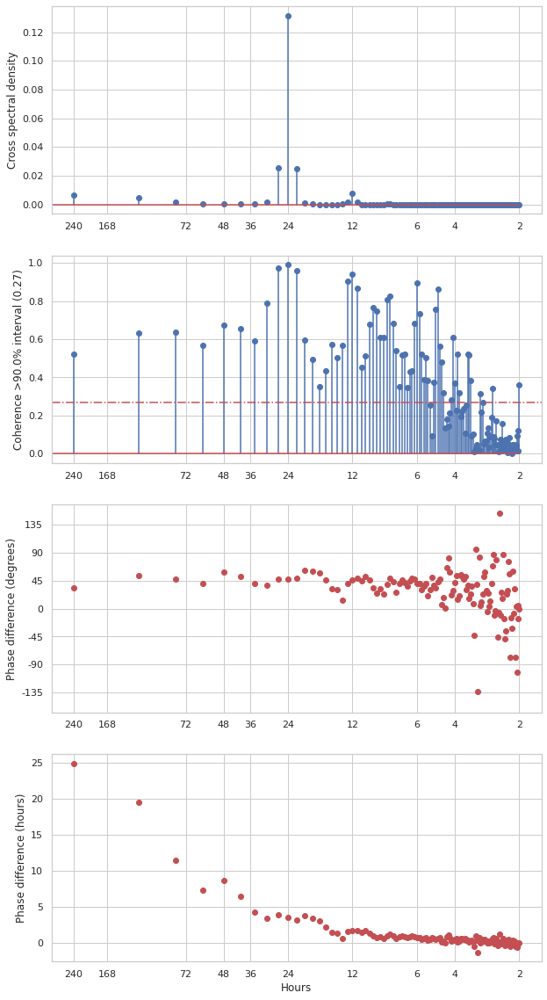

2021-05-25 00:07:35 INFO     771 (Canarias): JFM_ext, Lt = 60.0 -- T: 24.0, coh: 0.989884426980583, hr: 3.5000287145630518
2021-05-25 00:07:35 INFO     750 (Canarias) (lat: 26.641, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:35 DEBUG    750: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-05-25 00:07:35 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:35 DEBUG    750: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-05-25 00:07:35 INFO     750 (Canarias): ASO_ext, Lt = 73.42
2021-05-25 00:07:35 INFO     750: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:35 INFO     750: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-05-25 00:07:35 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-05-25 00:07:35 INFO     750: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least

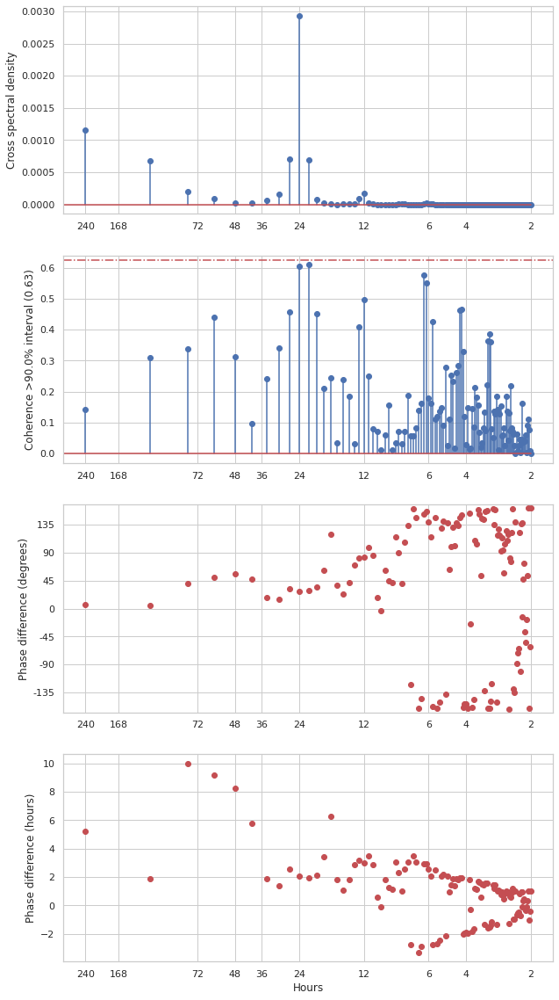

2021-05-25 00:07:38 INFO     750 (Canarias): ASO_ext, Lt = 73.42 -- T: 24.0, coh: 0.6049131708316173, hr: 2.0834472652298306
2021-05-25 00:07:38 INFO     750 (Canarias) (lat: 26.641, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:38 DEBUG    750: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-05-25 00:07:38 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:38 DEBUG    750: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-05-25 00:07:38 INFO     750 (Canarias): JFM_ext, Lt = 60.0
2021-05-25 00:07:38 INFO     750: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:38 INFO     750: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-05-25 00:07:38 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-05-25 00:07:38 INFO     750: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least

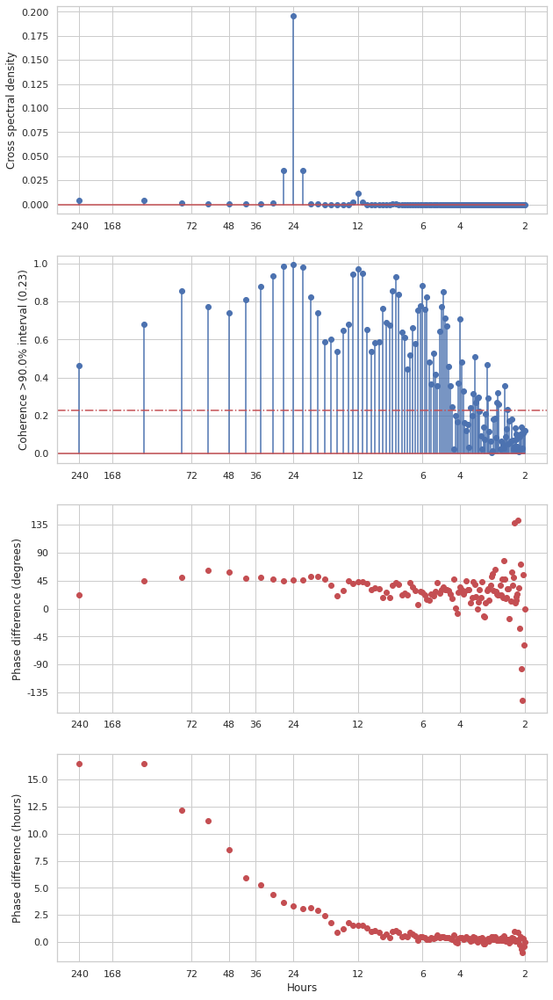

2021-05-25 00:07:40 INFO     750 (Canarias): JFM_ext, Lt = 60.0 -- T: 24.0, coh: 0.9924049124445634, hr: 3.352022396263728
2021-05-25 00:07:40 INFO     730 (Canarias) (lat: 21.611, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:40 DEBUG    730: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/730_ASO_hours.npz
2021-05-25 00:07:40 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:40 DEBUG    730: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/730_ASO_hours.npz
2021-05-25 00:07:40 INFO     730 (Canarias): ASO_ext, Lt = 77.7
2021-05-25 00:07:40 INFO     730: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:40 INFO     730: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/730_ASO_ext_hours.npz
2021-05-25 00:07:40 INFO     730: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/730_ASO_ext_hours.npz
2021-05-25 00:07:40 INFO     730: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least 

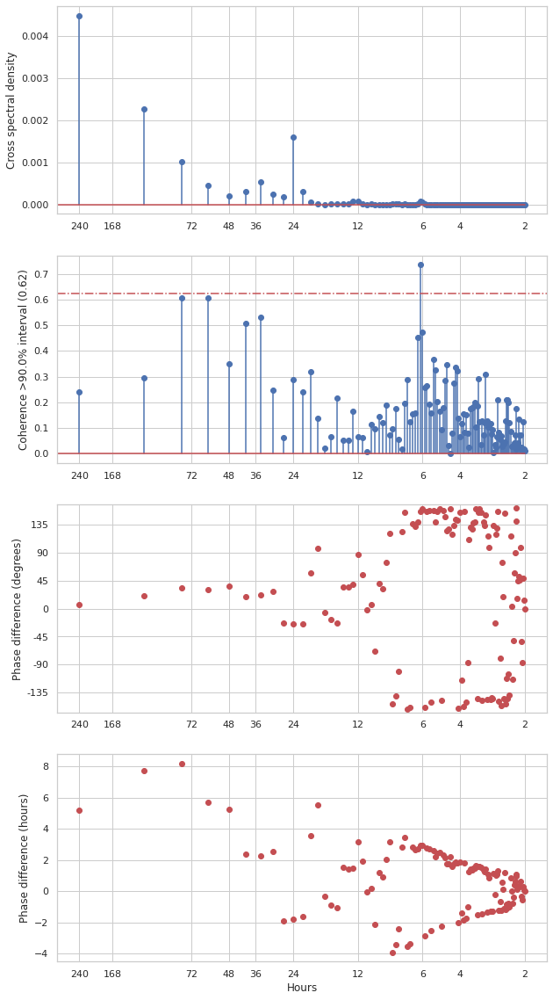

2021-05-25 00:07:43 INFO     730 (Canarias): ASO_ext, Lt = 77.7 -- T: 24.0, coh: 0.2889827802297888, hr: -1.7790082364025301
2021-05-25 00:07:43 INFO     730 (Canarias) (lat: 21.611, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:43 DEBUG    730: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/730_JFM_hours.npz
2021-05-25 00:07:43 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:43 DEBUG    730: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/730_JFM_hours.npz
2021-05-25 00:07:43 INFO     730 (Canarias): JFM_ext, Lt = 61.0
2021-05-25 00:07:43 INFO     730: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:43 INFO     730: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/730_JFM_ext_hours.npz
2021-05-25 00:07:43 INFO     730: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/730_JFM_ext_hours.npz
2021-05-25 00:07:43 INFO     730: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least

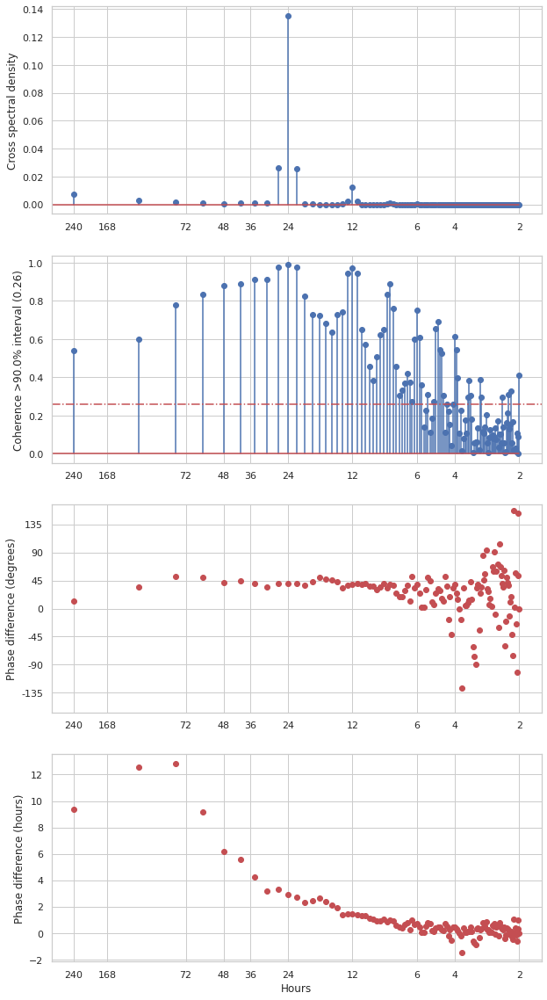

2021-05-25 00:07:45 INFO     730 (Canarias): JFM_ext, Lt = 61.0 -- T: 24.0, coh: 0.988582030323704, hr: 2.940913093047915
2021-05-25 00:07:45 INFO     709 (Canarias) (lat: 16.398, lon: -29): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:45 DEBUG    709: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/709_ASO_hours.npz
2021-05-25 00:07:45 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:45 DEBUG    709: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/709_ASO_hours.npz
2021-05-25 00:07:45 INFO     709 (Canarias): ASO_ext, Lt = 129.32
2021-05-25 00:07:45 INFO     709: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:45 INFO     709: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/709_ASO_ext_hours.npz
2021-05-25 00:07:45 INFO     709: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/709_ASO_ext_hours.npz
2021-05-25 00:07:45 INFO     709: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least

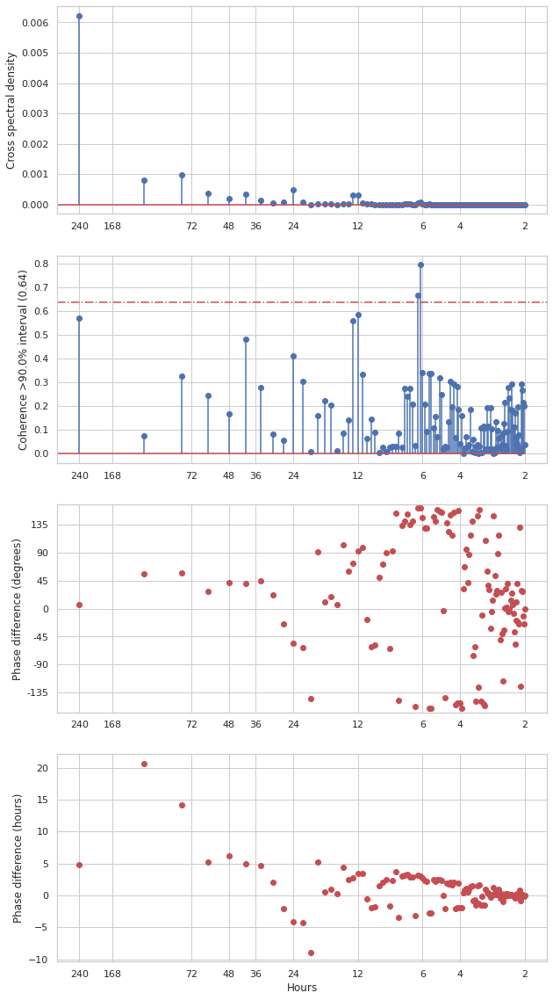

2021-05-25 00:07:47 INFO     709 (Canarias): ASO_ext, Lt = 129.32 -- T: 24.0, coh: 0.41112828471589474, hr: -4.123674820175844
2021-05-25 00:07:47 INFO     709 (Canarias) (lat: 16.398, lon: -29): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:47 DEBUG    709: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/709_JFM_hours.npz
2021-05-25 00:07:47 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:47 DEBUG    709: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/709_JFM_hours.npz
2021-05-25 00:07:47 INFO     709 (Canarias): JFM_ext, Lt = 66.59
2021-05-25 00:07:47 INFO     709: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:47 INFO     709: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/709_JFM_ext_hours.npz
2021-05-25 00:07:47 INFO     709: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/709_JFM_ext_hours.npz
2021-05-25 00:07:47 INFO     709: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at le

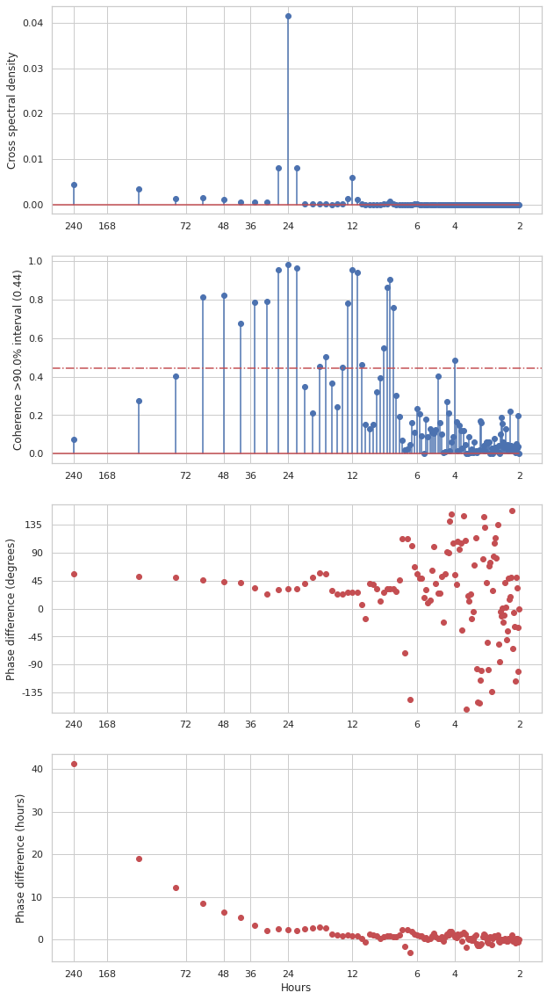

2021-05-25 00:07:50 INFO     709 (Canarias): JFM_ext, Lt = 66.59 -- T: 24.0, coh: 0.9797254196872767, hr: 2.323397202698763
2021-05-25 00:07:50 INFO     596 (Peru) (lat: -16.398, lon: -83): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:50 DEBUG    596: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/596_ASO_hours.npz
2021-05-25 00:07:50 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:50 DEBUG    596: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/596_ASO_hours.npz
2021-05-25 00:07:50 INFO     596 (Peru): ASO_ext, Lt = 63.94
2021-05-25 00:07:50 INFO     596: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:50 INFO     596: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/596_ASO_ext_hours.npz
2021-05-25 00:07:50 INFO     596: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/596_ASO_ext_hours.npz
2021-05-25 00:07:50 INFO     596: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least inclu

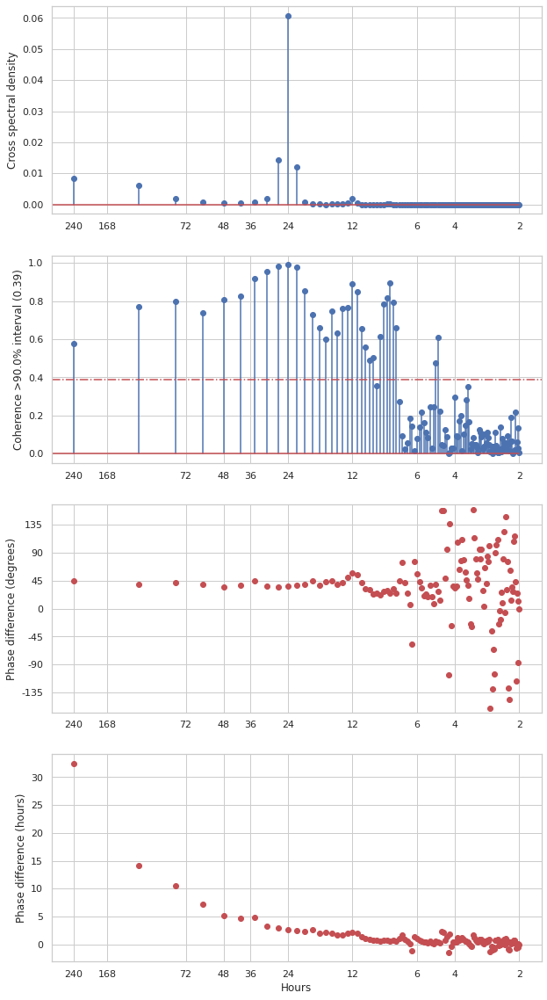

2021-05-25 00:07:52 INFO     596 (Peru): ASO_ext, Lt = 63.94 -- T: 24.0, coh: 0.9890620757905639, hr: 2.688084152853636
2021-05-25 00:07:52 INFO     596 (Peru) (lat: -16.398, lon: -83): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:52 DEBUG    596: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/596_JFM_hours.npz
2021-05-25 00:07:52 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:52 DEBUG    596: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/596_JFM_hours.npz
2021-05-25 00:07:52 INFO     596 (Peru): JFM_ext, Lt = 76.48
2021-05-25 00:07:52 INFO     596: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:52 INFO     596: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/596_JFM_ext_hours.npz
2021-05-25 00:07:52 INFO     596: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/596_JFM_ext_hours.npz
2021-05-25 00:07:52 INFO     596: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes w

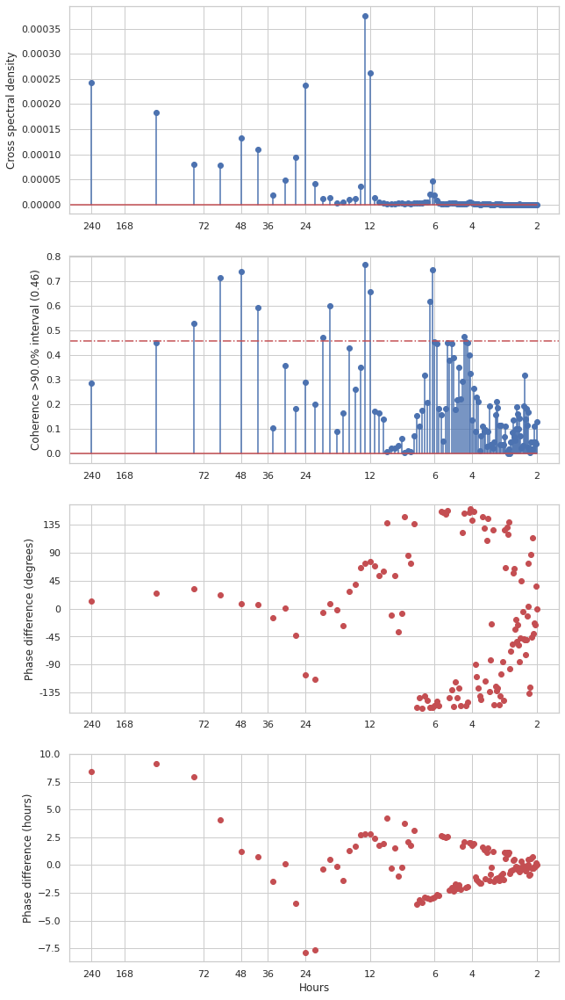

2021-05-25 00:07:55 INFO     596 (Peru): JFM_ext, Lt = 76.48 -- T: 24.0, coh: 0.2915080683181857, hr: -7.853535359512971
2021-05-25 00:07:55 INFO     572 (Peru) (lat: -21.611, lon: -77): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:07:55 DEBUG    572: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-25 00:07:55 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:55 DEBUG    572: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-25 00:07:55 INFO     572 (Peru): ASO_ext, Lt = 61.88
2021-05-25 00:07:55 INFO     572: ASO_ext (style=full) -- Ensuring
2021-05-25 00:07:55 INFO     572: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-25 00:07:55 INFO     572: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-25 00:07:55 INFO     572: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes

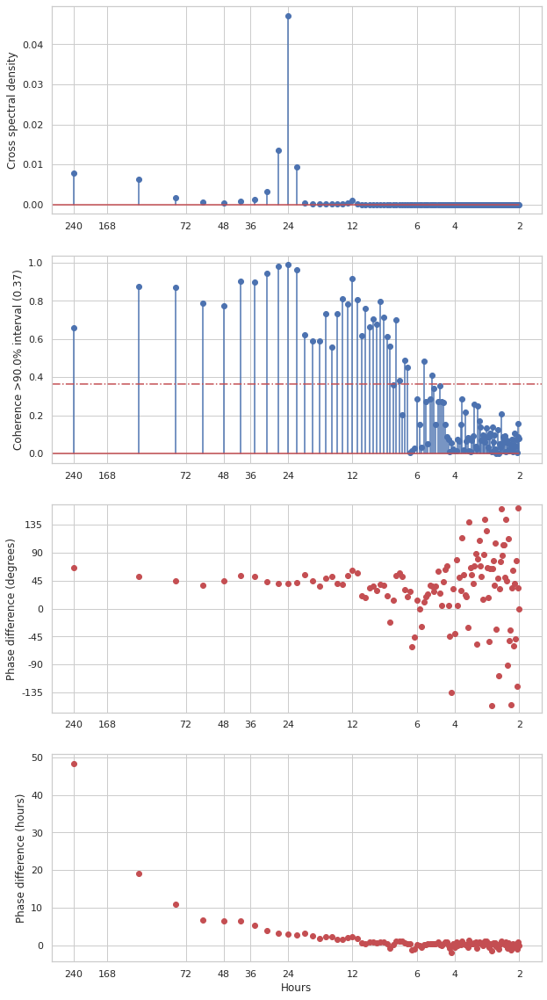

2021-05-25 00:07:57 INFO     572 (Peru): ASO_ext, Lt = 61.88 -- T: 24.0, coh: 0.9884452258384864, hr: 3.0028642302825594
2021-05-25 00:07:57 INFO     572 (Peru) (lat: -21.611, lon: -77): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:07:57 DEBUG    572: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-25 00:07:57 INFO     Spectra file exists. Skipping.
2021-05-25 00:07:57 DEBUG    572: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-25 00:07:57 INFO     572 (Peru): JFM_ext, Lt = 74.28
2021-05-25 00:07:57 INFO     572: JFM_ext (style=full) -- Ensuring
2021-05-25 00:07:57 INFO     572: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-25 00:07:57 INFO     572: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-25 00:07:57 INFO     572: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes 

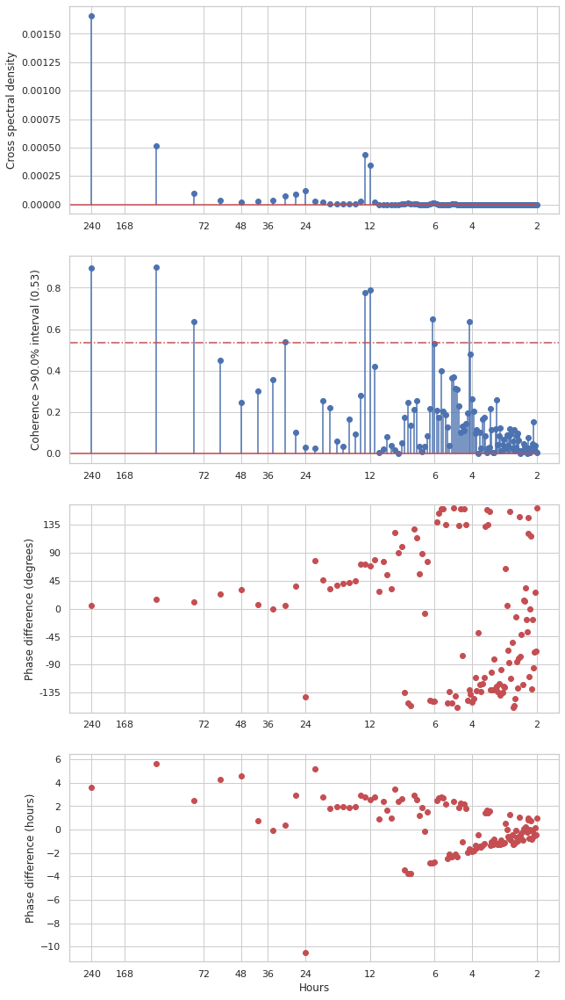

2021-05-25 00:07:59 INFO     572 (Peru): JFM_ext, Lt = 74.28 -- T: 24.0, coh: 0.031490747329425604, hr: -10.469934725652173
2021-05-25 00:08:00 INFO     450 (Peru) (lat: -40.411, lon: -83): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:00 DEBUG    450: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/450_ASO_hours.npz
2021-05-25 00:08:00 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:00 DEBUG    450: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/450_ASO_hours.npz
2021-05-25 00:08:00 INFO     450 (Peru): ASO_ext, Lt = 76.0
2021-05-25 00:08:00 INFO     450: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:00 INFO     450: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/450_ASO_ext_hours.npz
2021-05-25 00:08:00 INFO     450: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/450_ASO_ext_hours.npz
2021-05-25 00:08:00 INFO     450: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includ

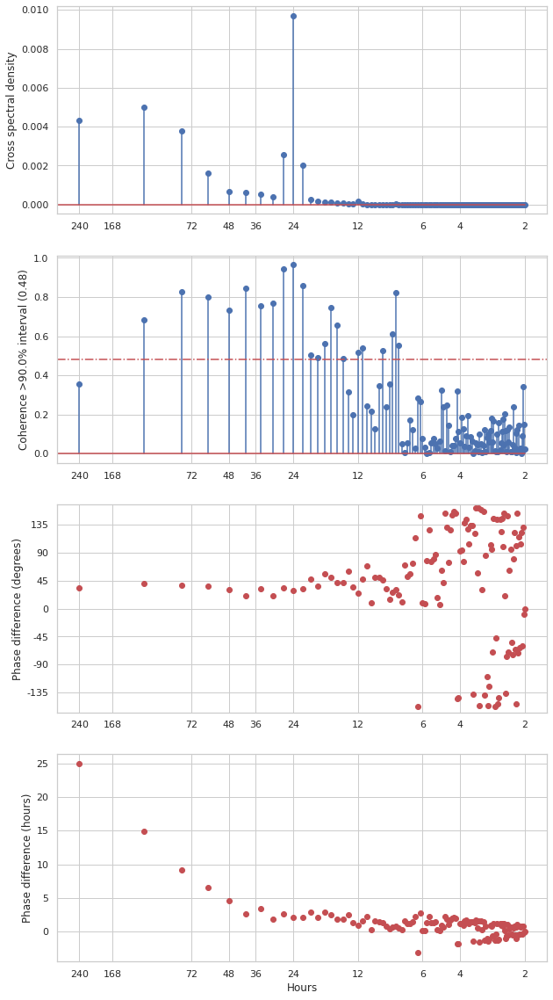

2021-05-25 00:08:02 INFO     450 (Peru): ASO_ext, Lt = 76.0 -- T: 24.0, coh: 0.9640847744488465, hr: 2.121242471732521
2021-05-25 00:08:02 INFO     450 (Peru) (lat: -40.411, lon: -83): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:02 DEBUG    450: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/450_JFM_hours.npz
2021-05-25 00:08:02 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:02 DEBUG    450: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/450_JFM_hours.npz
2021-05-25 00:08:02 INFO     450 (Peru): JFM_ext, Lt = 66.23
2021-05-25 00:08:02 INFO     450: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:02 INFO     450: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/450_JFM_ext_hours.npz
2021-05-25 00:08:02 INFO     450: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/450_JFM_ext_hours.npz
2021-05-25 00:08:02 INFO     450: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes wh

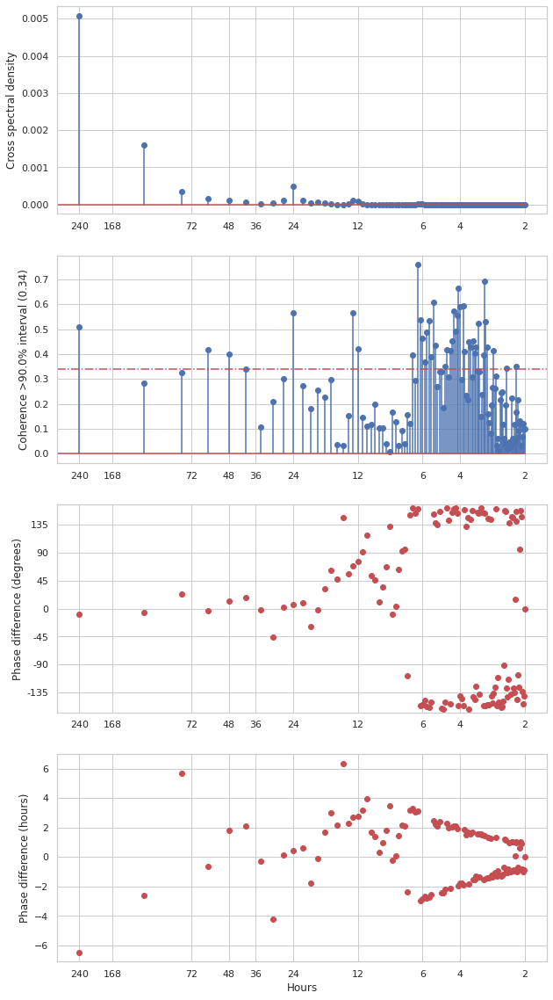

2021-05-25 00:08:04 INFO     450 (Peru): JFM_ext, Lt = 66.23 -- T: 24.0, coh: 0.5636968442592413, hr: 0.4567618101656648
2021-05-25 00:08:04 INFO     602 (Benguela) (lat: -11.032, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:04 DEBUG    602: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/602_ASO_hours.npz
2021-05-25 00:08:04 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:04 DEBUG    602: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/602_ASO_hours.npz
2021-05-25 00:08:04 INFO     602 (Benguela): ASO_ext, Lt = 64.44
2021-05-25 00:08:04 INFO     602: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:04 INFO     602: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/602_ASO_ext_hours.npz
2021-05-25 00:08:04 INFO     602: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/602_ASO_ext_hours.npz
2021-05-25 00:08:04 INFO     602: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least in

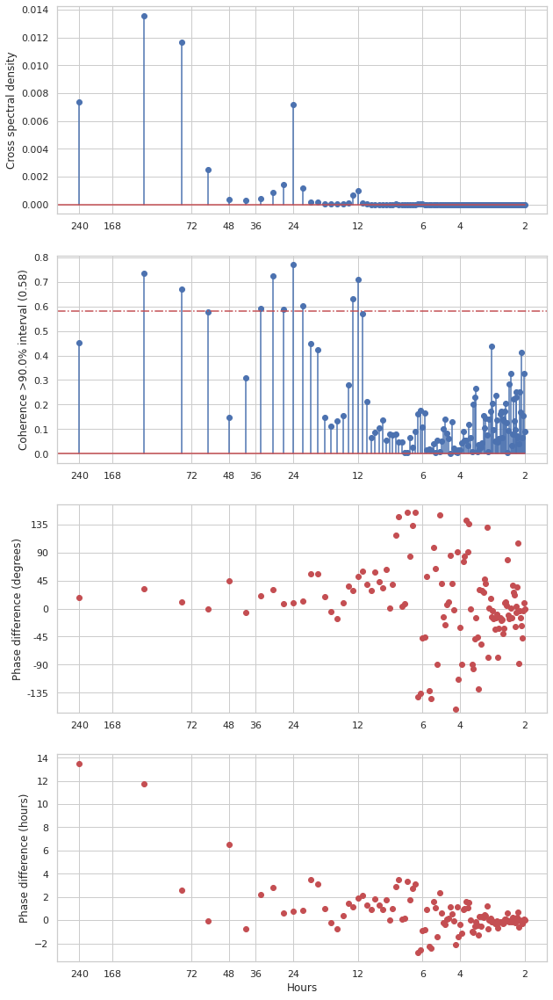

2021-05-25 00:08:07 INFO     602 (Benguela): ASO_ext, Lt = 64.44 -- T: 24.0, coh: 0.7686282917749934, hr: 0.7298424378365735
2021-05-25 00:08:07 INFO     602 (Benguela) (lat: -11.032, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:07 DEBUG    602: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/602_JFM_hours.npz
2021-05-25 00:08:07 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:07 DEBUG    602: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/602_JFM_hours.npz
2021-05-25 00:08:07 INFO     602 (Benguela): JFM_ext, Lt = 125.72
2021-05-25 00:08:07 INFO     602: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:07 INFO     602: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/602_JFM_ext_hours.npz
2021-05-25 00:08:07 INFO     602: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/602_JFM_ext_hours.npz
2021-05-25 00:08:07 INFO     602: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

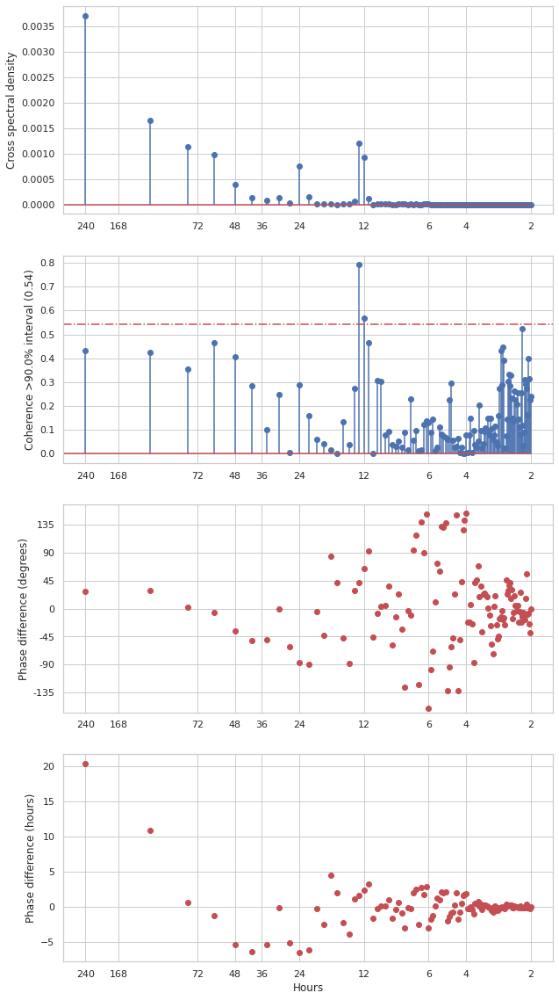

2021-05-25 00:08:09 INFO     602 (Benguela): JFM_ext, Lt = 125.72 -- T: 24.0, coh: 0.2885062326075447, hr: -6.399786158114319
2021-05-25 00:08:09 INFO     578 (Benguela) (lat: -16.398, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:09 DEBUG    578: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-05-25 00:08:09 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:09 DEBUG    578: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-05-25 00:08:09 INFO     578 (Benguela): ASO_ext, Lt = 64.19
2021-05-25 00:08:09 INFO     578: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:09 INFO     578: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/578_ASO_ext_hours.npz
2021-05-25 00:08:09 INFO     578: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/578_ASO_ext_hours.npz
2021-05-25 00:08:09 INFO     578: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at lea

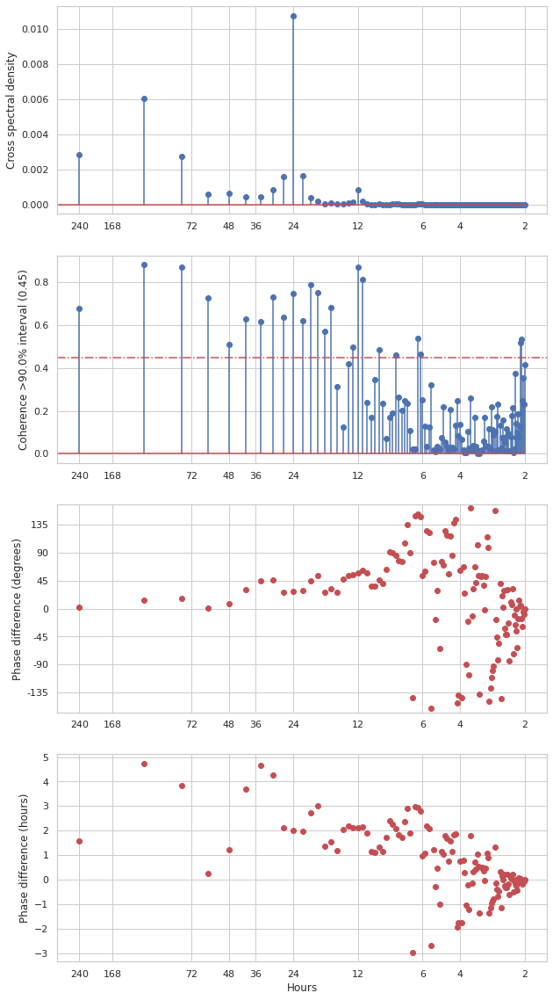

2021-05-25 00:08:12 INFO     578 (Benguela): ASO_ext, Lt = 64.19 -- T: 24.0, coh: 0.7490925080419198, hr: 2.0075345964761344
2021-05-25 00:08:12 INFO     578 (Benguela) (lat: -16.398, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:12 DEBUG    578: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-05-25 00:08:12 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:12 DEBUG    578: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-05-25 00:08:12 INFO     578 (Benguela): JFM_ext, Lt = 122.71
2021-05-25 00:08:12 INFO     578: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:12 INFO     578: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/578_JFM_ext_hours.npz
2021-05-25 00:08:12 INFO     578: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/578_JFM_ext_hours.npz
2021-05-25 00:08:12 INFO     578: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

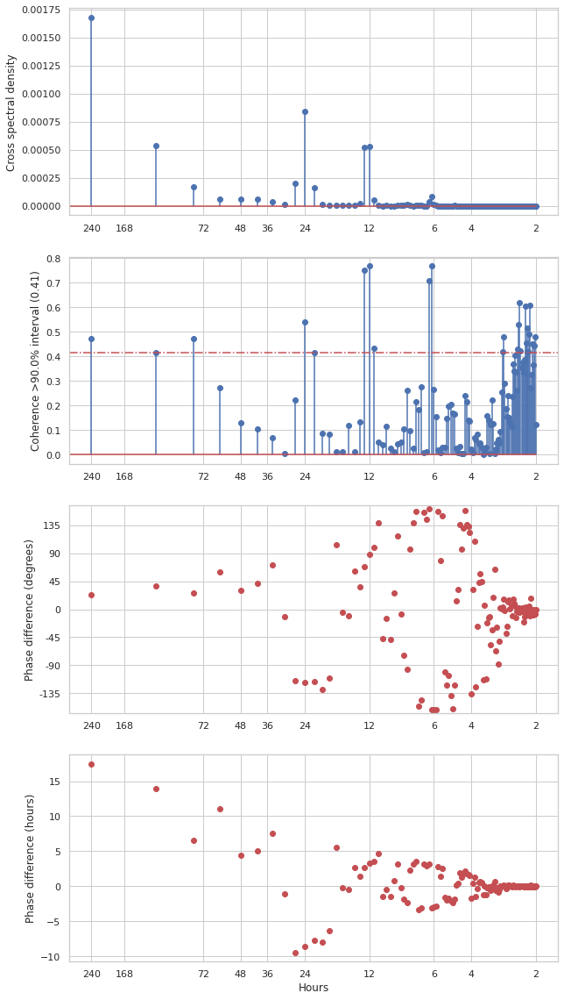

2021-05-25 00:08:14 INFO     578 (Benguela): JFM_ext, Lt = 122.71 -- T: 24.0, coh: 0.5401470784709849, hr: -8.673795284501665
2021-05-25 00:08:14 INFO     533 (Benguela) (lat: -26.641, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:14 DEBUG    533: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/533_ASO_hours.npz
2021-05-25 00:08:14 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:14 DEBUG    533: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/533_ASO_hours.npz
2021-05-25 00:08:14 INFO     533 (Benguela): ASO_ext, Lt = 61.3
2021-05-25 00:08:14 INFO     533: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:14 INFO     533: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-05-25 00:08:14 INFO     533: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-05-25 00:08:14 INFO     533: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

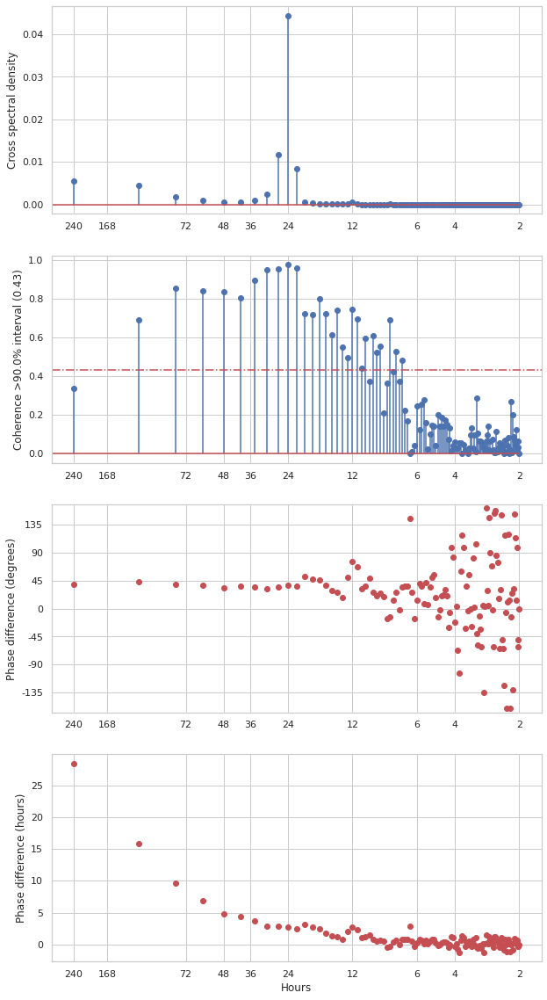

2021-05-25 00:08:16 INFO     533 (Benguela): ASO_ext, Lt = 61.3 -- T: 24.0, coh: 0.9746141713214805, hr: 2.72391791397797
2021-05-25 00:08:16 INFO     533 (Benguela) (lat: -26.641, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:16 DEBUG    533: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/533_JFM_hours.npz
2021-05-25 00:08:16 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:16 DEBUG    533: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/533_JFM_hours.npz
2021-05-25 00:08:16 INFO     533 (Benguela): JFM_ext, Lt = 119.46
2021-05-25 00:08:16 INFO     533: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:16 INFO     533: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-05-25 00:08:16 INFO     533: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-05-25 00:08:16 INFO     533: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least i

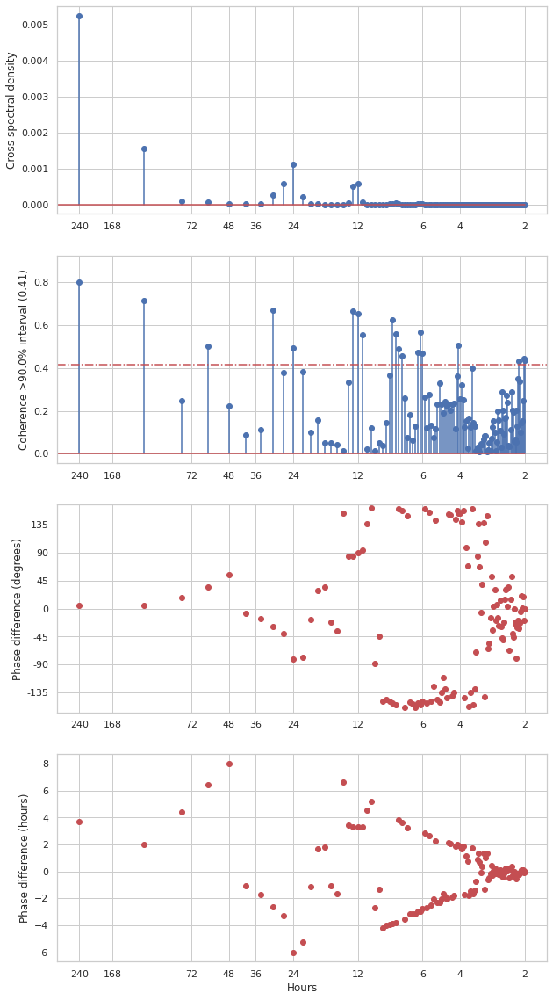

2021-05-25 00:08:19 INFO     533 (Benguela): JFM_ext, Lt = 119.46 -- T: 24.0, coh: 0.49346686254358646, hr: -5.999251784787028


In [33]:
calc_phasediff("California", t_idx_slice=phasediff_slice, days_window=10)
calc_phasediff("Canarias", t_idx_slice=phasediff_slice, days_window=10)
calc_phasediff("Peru", t_idx_slice=phasediff_slice, days_window=10)
calc_phasediff("Benguela", t_idx_slice=phasediff_slice, days_window=10)

2021-05-25 00:08:19 INFO     868 (California) (lat: 48.383, lon: -137): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:19 DEBUG    868: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/868_ASO_hours.npz
2021-05-25 00:08:19 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:19 DEBUG    868: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/868_ASO_hours.npz
2021-05-25 00:08:19 INFO     868 (California): ASO_ext, Lt = 97.52
2021-05-25 00:08:19 INFO     868: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:19 INFO     868: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/868_ASO_ext_hours.npz
2021-05-25 00:08:19 INFO     868: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/868_ASO_ext_hours.npz
2021-05-25 00:08:19 INFO     868: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (7752,9935)
2021-05-25 00:08:19 INFO     868: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats

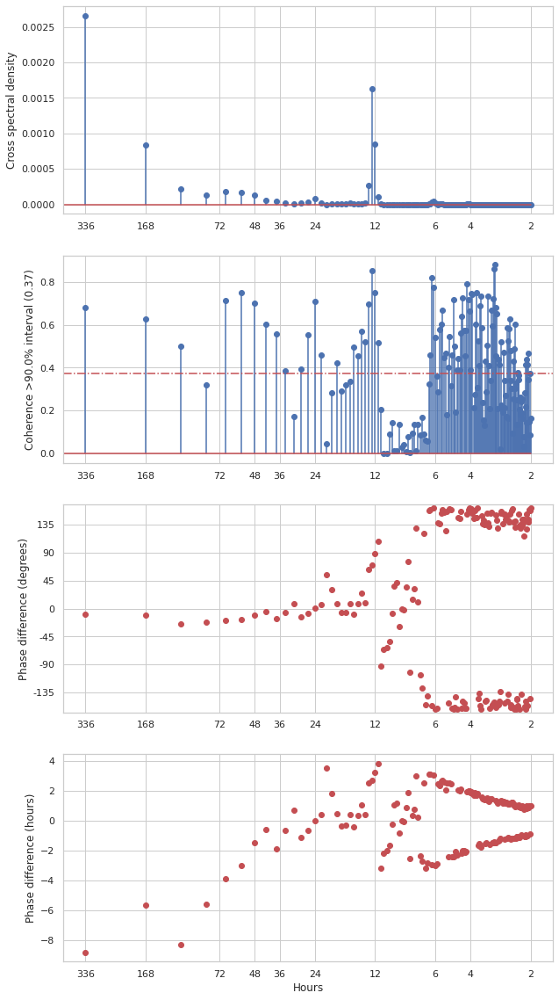

2021-05-25 00:08:21 INFO     868 (California): ASO_ext, Lt = 97.52 -- T: 24.0, coh: 0.7066843805014644, hr: 0.007182760786205598
2021-05-25 00:08:21 INFO     868 (California) (lat: 48.383, lon: -137): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:21 DEBUG    868: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/868_JFM_hours.npz
2021-05-25 00:08:21 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:21 DEBUG    868: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/868_JFM_hours.npz
2021-05-25 00:08:21 INFO     868 (California): JFM_ext, Lt = 40.0
2021-05-25 00:08:21 INFO     868: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:21 INFO     868: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/868_JFM_ext_hours.npz
2021-05-25 00:08:21 INFO     868: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/868_JFM_ext_hours.npz
2021-05-25 00:08:21 INFO     868: JFM_ext -- File exists for the same parameters, and time slice (2640,5543)

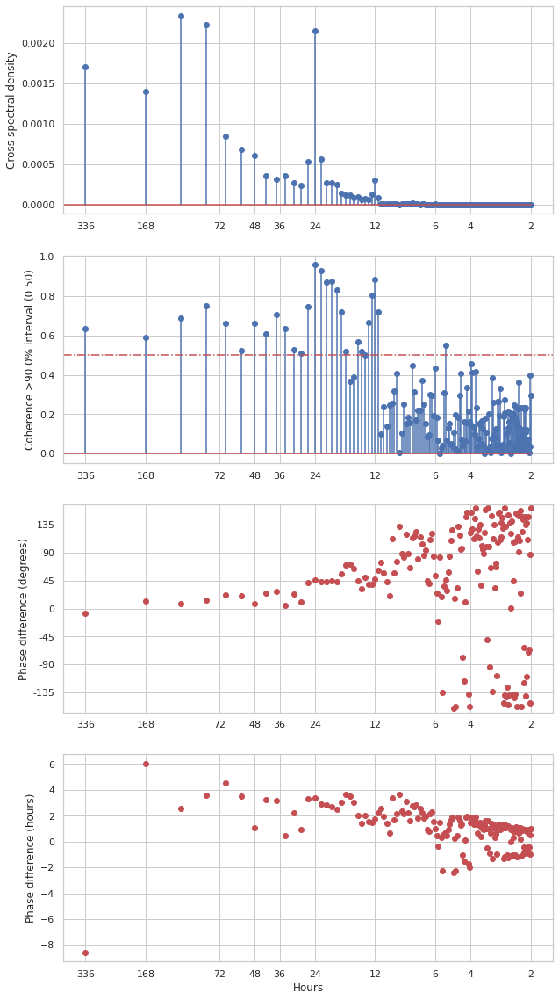

2021-05-25 00:08:24 INFO     868 (California): JFM_ext, Lt = 40.0 -- T: 24.0, coh: 0.9574509076994426, hr: 3.3931362463074746
2021-05-25 00:08:24 INFO     852 (California) (lat: 44.521, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:24 DEBUG    852: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-05-25 00:08:24 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:24 DEBUG    852: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-05-25 00:08:24 INFO     852 (California): ASO_ext, Lt = 118.7
2021-05-25 00:08:24 INFO     852: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:24 INFO     852: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/852_ASO_ext_hours.npz
2021-05-25 00:08:24 INFO     852: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/852_ASO_ext_hours.npz
2021-05-25 00:08:24 INFO     852: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

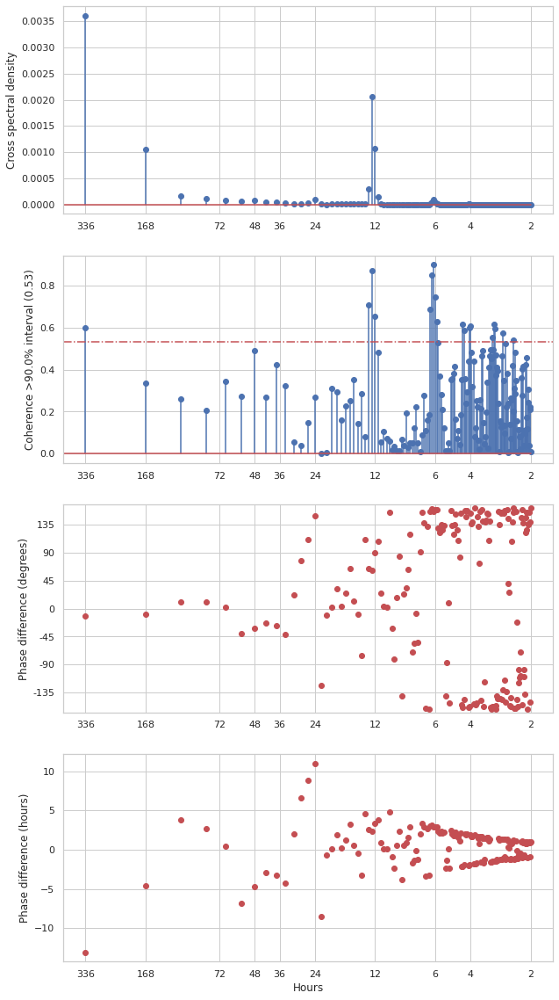

2021-05-25 00:08:26 INFO     852 (California): ASO_ext, Lt = 118.7 -- T: 24.0, coh: 0.2694314283816462, hr: 10.993451938461781
2021-05-25 00:08:26 INFO     852 (California) (lat: 44.521, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:26 DEBUG    852: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-05-25 00:08:26 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:26 DEBUG    852: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-05-25 00:08:26 INFO     852 (California): JFM_ext, Lt = 44.5
2021-05-25 00:08:26 INFO     852: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:26 INFO     852: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/852_JFM_ext_hours.npz
2021-05-25 00:08:26 INFO     852: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/852_JFM_ext_hours.npz
2021-05-25 00:08:26 INFO     852: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) a

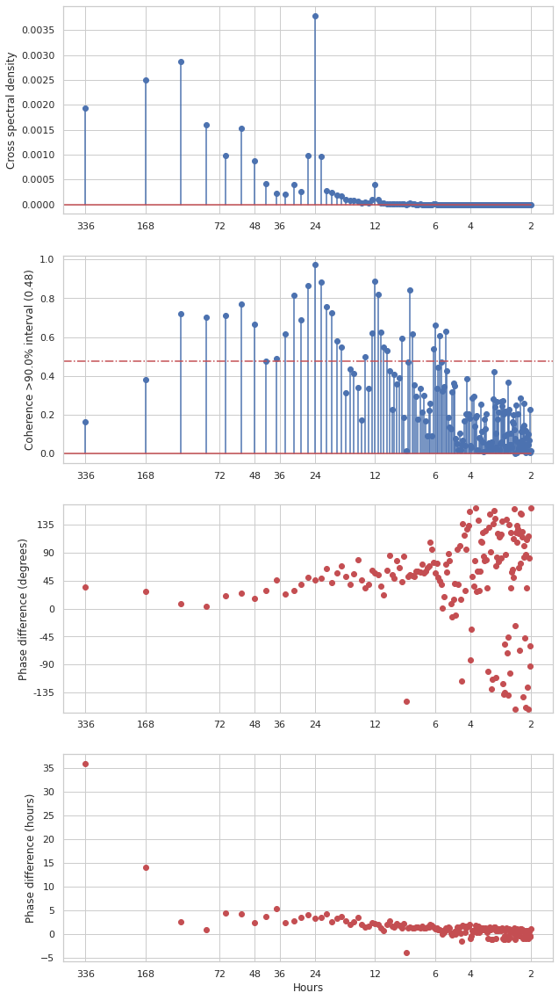

2021-05-25 00:08:29 INFO     852 (California): JFM_ext, Lt = 44.5 -- T: 24.0, coh: 0.9718201313963164, hr: 3.3589957776310966
2021-05-25 00:08:29 INFO     831 (California) (lat: 40.411, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:29 DEBUG    831: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/831_ASO_hours.npz
2021-05-25 00:08:29 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:29 DEBUG    831: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/831_ASO_hours.npz
2021-05-25 00:08:29 INFO     831 (California): ASO_ext, Lt = 172.16
2021-05-25 00:08:29 INFO     831: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:29 INFO     831: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/831_ASO_ext_hours.npz
2021-05-25 00:08:29 INFO     831: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/831_ASO_ext_hours.npz
2021-05-25 00:08:29 INFO     831: ASO_ext -- File exists for the same parameters, and time slice (7752,10295)

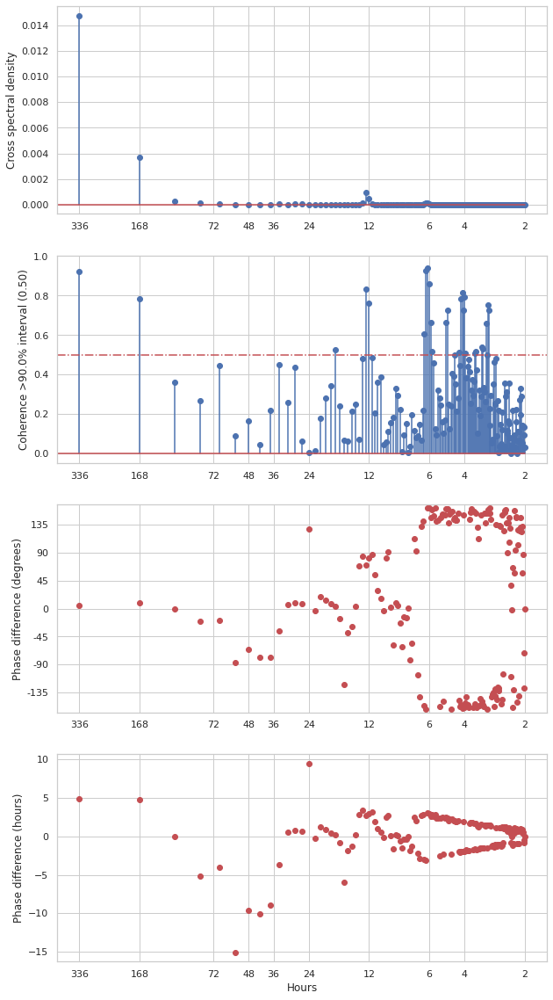

2021-05-25 00:08:31 INFO     831 (California): ASO_ext, Lt = 172.16 -- T: 24.0, coh: 0.007968433045763506, hr: 9.46561587242329
2021-05-25 00:08:31 INFO     831 (California) (lat: 40.411, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:31 DEBUG    831: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/831_JFM_hours.npz
2021-05-25 00:08:31 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:31 DEBUG    831: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/831_JFM_hours.npz
2021-05-25 00:08:31 INFO     831 (California): JFM_ext, Lt = 37.18
2021-05-25 00:08:31 INFO     831: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:31 INFO     831: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/831_JFM_ext_hours.npz
2021-05-25 00:08:31 INFO     831: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/831_JFM_ext_hours.npz
2021-05-25 00:08:31 INFO     831: JFM_ext -- File exists for the same parameters, and time slice (2640,5543)

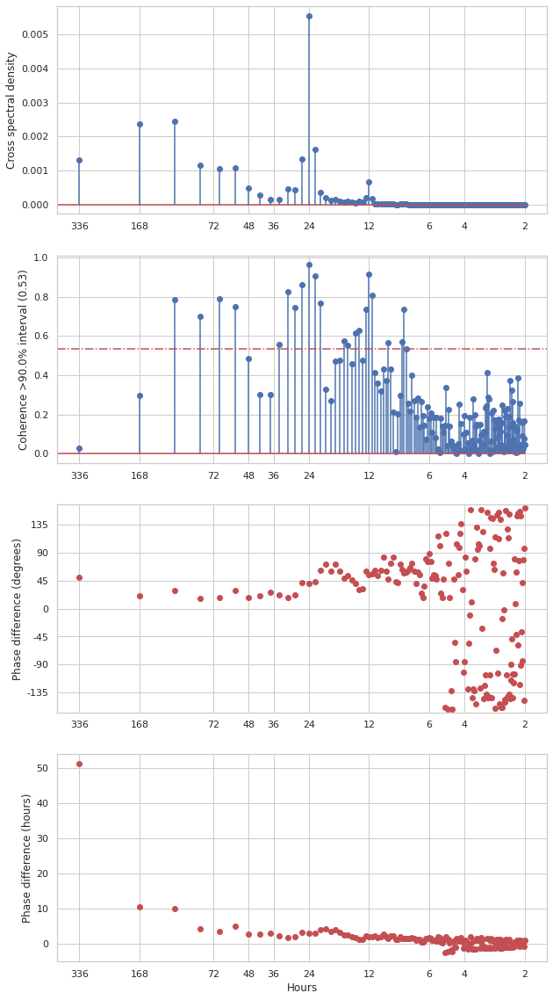

2021-05-25 00:08:34 INFO     831 (California): JFM_ext, Lt = 37.18 -- T: 24.0, coh: 0.9618180498768503, hr: 3.015946583344182
2021-05-25 00:08:34 INFO     809 (California) (lat: 36.056, lon: -131): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:34 DEBUG    809: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/809_ASO_hours.npz
2021-05-25 00:08:34 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:34 DEBUG    809: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/809_ASO_hours.npz
2021-05-25 00:08:34 INFO     809 (California): ASO_ext, Lt = 94.29
2021-05-25 00:08:34 INFO     809: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:34 INFO     809: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/809_ASO_ext_hours.npz
2021-05-25 00:08:34 INFO     809: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/809_ASO_ext_hours.npz
2021-05-25 00:08:34 INFO     809: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) 

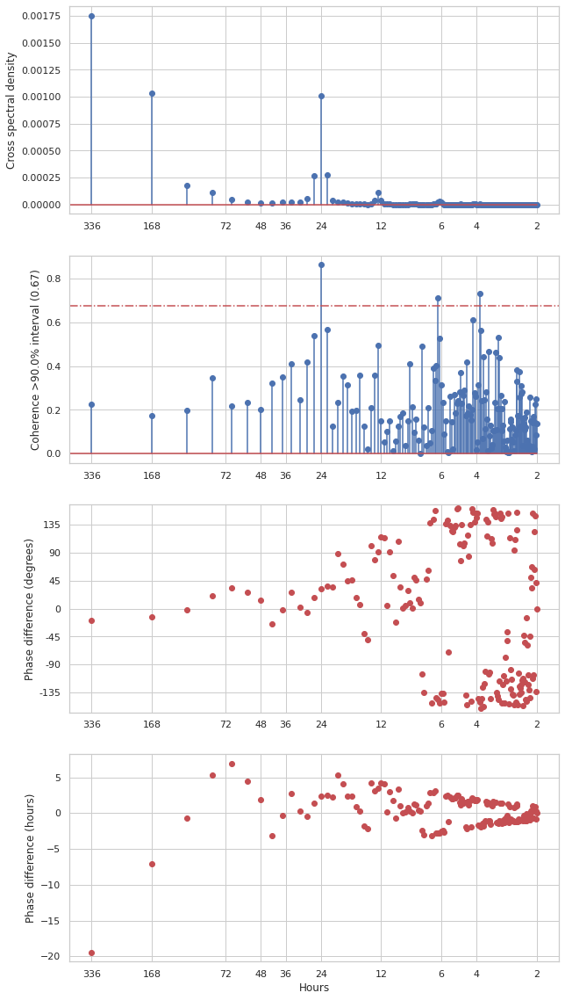

2021-05-25 00:08:36 INFO     809 (California): ASO_ext, Lt = 94.29 -- T: 24.0, coh: 0.8616853514122061, hr: 2.3399547771859446
2021-05-25 00:08:36 INFO     809 (California) (lat: 36.056, lon: -131): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:36 DEBUG    809: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/809_JFM_hours.npz
2021-05-25 00:08:36 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:36 DEBUG    809: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/809_JFM_hours.npz
2021-05-25 00:08:36 INFO     809 (California): JFM_ext, Lt = 41.19
2021-05-25 00:08:36 INFO     809: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:36 INFO     809: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/809_JFM_ext_hours.npz
2021-05-25 00:08:36 INFO     809: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/809_JFM_ext_hours.npz
2021-05-25 00:08:36 INFO     809: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) 

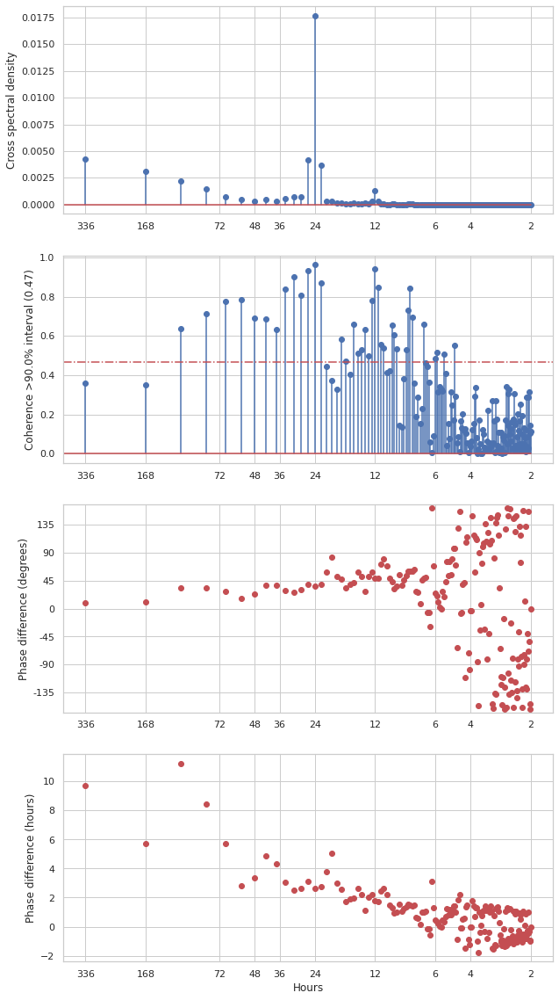

2021-05-25 00:08:39 INFO     809 (California): JFM_ext, Lt = 41.19 -- T: 24.0, coh: 0.9614007200549604, hr: 2.6355053713587338
2021-05-25 00:08:39 INFO     787 (California) (lat: 31.462, lon: -125): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:39 DEBUG    787: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/787_ASO_hours.npz
2021-05-25 00:08:39 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:39 DEBUG    787: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/787_ASO_hours.npz
2021-05-25 00:08:39 INFO     787 (California): ASO_ext, Lt = 107.77
2021-05-25 00:08:39 INFO     787: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:39 INFO     787: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/787_ASO_ext_hours.npz
2021-05-25 00:08:39 INFO     787: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/787_ASO_ext_hours.npz
2021-05-25 00:08:39 INFO     787: ASO_ext -- File exists for the same parameters, and time slice (7752,10295

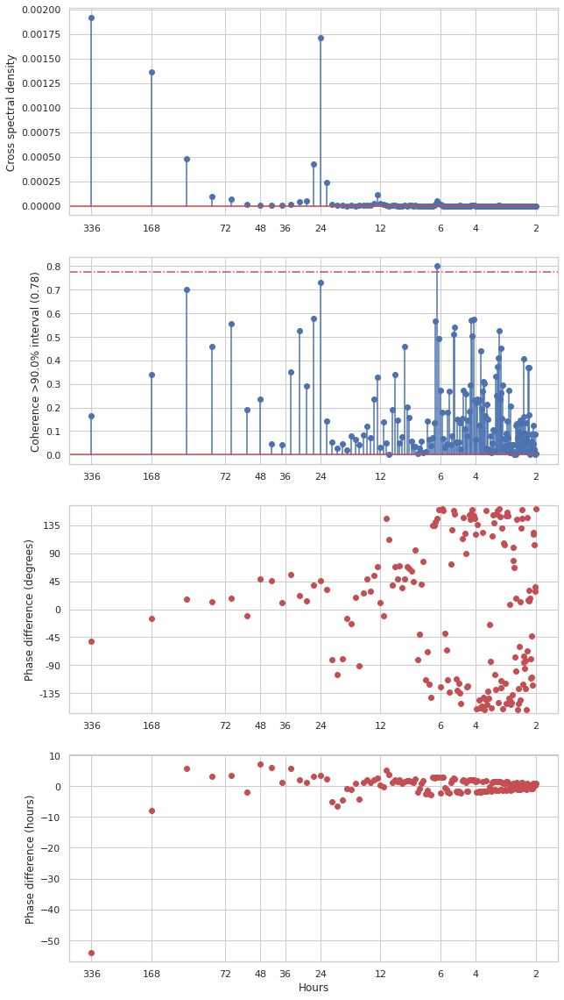

2021-05-25 00:08:41 INFO     787 (California): ASO_ext, Lt = 107.77 -- T: 24.0, coh: 0.731062072954712, hr: 3.419726006155531
2021-05-25 00:08:41 INFO     787 (California) (lat: 31.462, lon: -125): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:41 DEBUG    787: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/787_JFM_hours.npz
2021-05-25 00:08:41 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:41 DEBUG    787: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/787_JFM_hours.npz
2021-05-25 00:08:41 INFO     787 (California): JFM_ext, Lt = 32.0
2021-05-25 00:08:41 INFO     787: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:41 INFO     787: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/787_JFM_ext_hours.npz
2021-05-25 00:08:41 INFO     787: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/787_JFM_ext_hours.npz
2021-05-25 00:08:41 INFO     787: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at

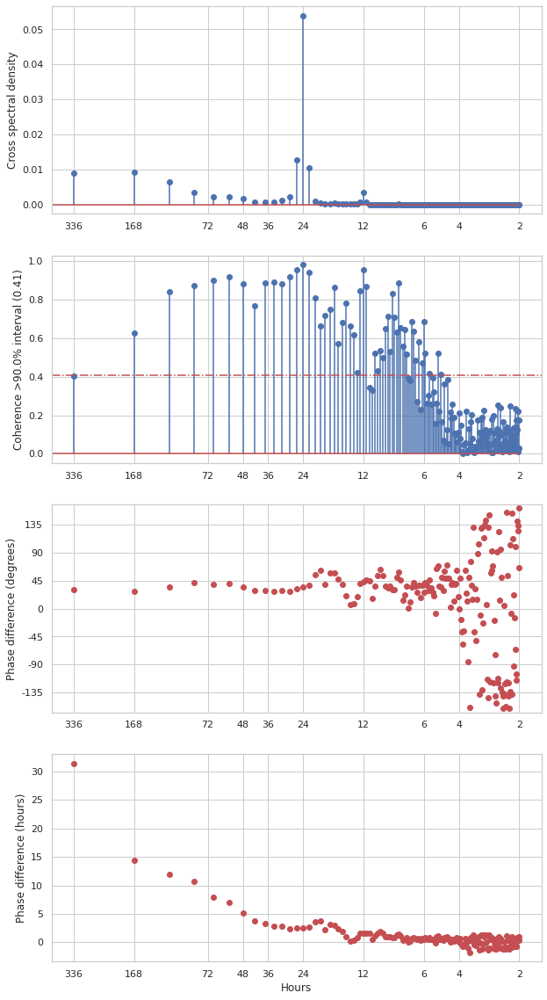

2021-05-25 00:08:44 INFO     787 (California): JFM_ext, Lt = 32.0 -- T: 24.0, coh: 0.9806385792179502, hr: 2.6007711326084095
2021-05-25 00:08:44 INFO     762 (California) (lat: 26.641, lon: -125): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:44 DEBUG    762: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-25 00:08:44 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:44 DEBUG    762: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-05-25 00:08:44 INFO     762 (California): ASO_ext, Lt = 115.97
2021-05-25 00:08:44 INFO     762: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:44 INFO     762: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-25 00:08:44 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-05-25 00:08:44 INFO     762: ASO_ext -- File exists for the same parameters, and time slice (7752,10295)

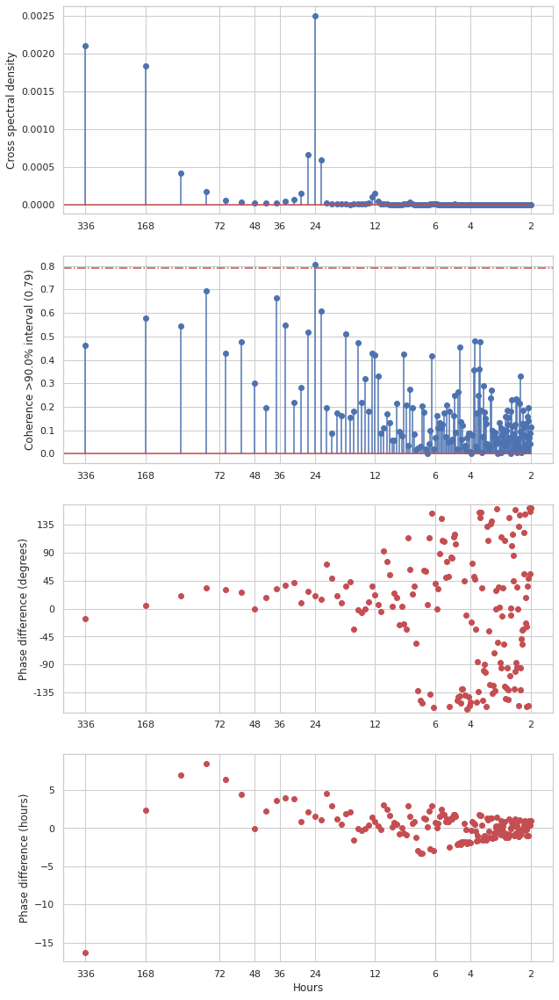

2021-05-25 00:08:47 INFO     762 (California): ASO_ext, Lt = 115.97 -- T: 24.0, coh: 0.8045797336633698, hr: 1.489198120087075
2021-05-25 00:08:47 INFO     762 (California) (lat: 26.641, lon: -125): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:47 DEBUG    762: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-25 00:08:47 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:47 DEBUG    762: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-05-25 00:08:47 INFO     762 (California): JFM_ext, Lt = 32.0
2021-05-25 00:08:47 INFO     762: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:47 INFO     762: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-25 00:08:47 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-05-25 00:08:47 INFO     762: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) a

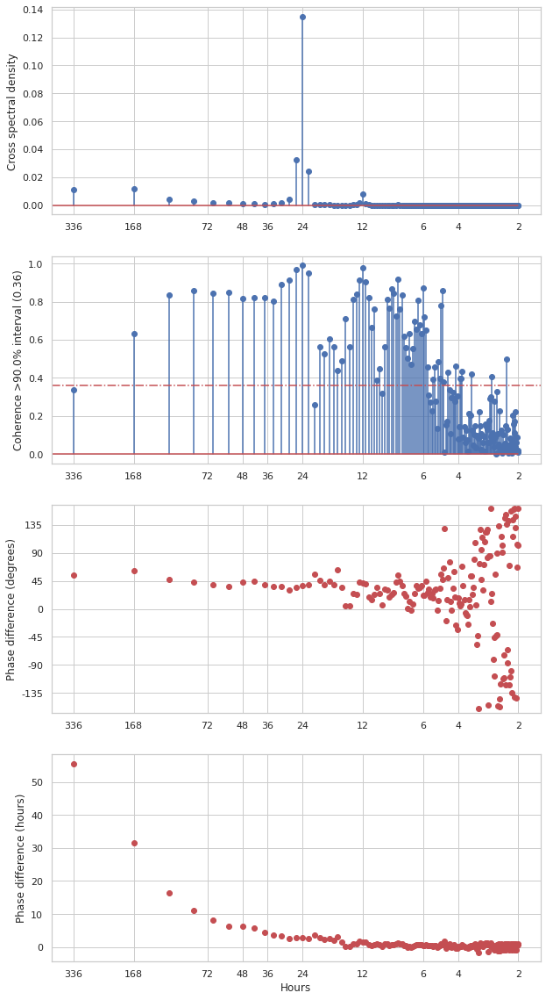

2021-05-25 00:08:49 INFO     762 (California): JFM_ext, Lt = 32.0 -- T: 24.0, coh: 0.9891043981191372, hr: 2.7226237179941664
2021-05-25 00:08:49 INFO     771 (Canarias) (lat: 31.462, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:49 DEBUG    771: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/771_ASO_hours.npz
2021-05-25 00:08:49 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:49 DEBUG    771: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/771_ASO_hours.npz
2021-05-25 00:08:49 INFO     771 (Canarias): ASO_ext, Lt = 70.06
2021-05-25 00:08:49 INFO     771: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:49 INFO     771: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/771_ASO_ext_hours.npz
2021-05-25 00:08:49 INFO     771: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/771_ASO_ext_hours.npz
2021-05-25 00:08:49 INFO     771: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at le

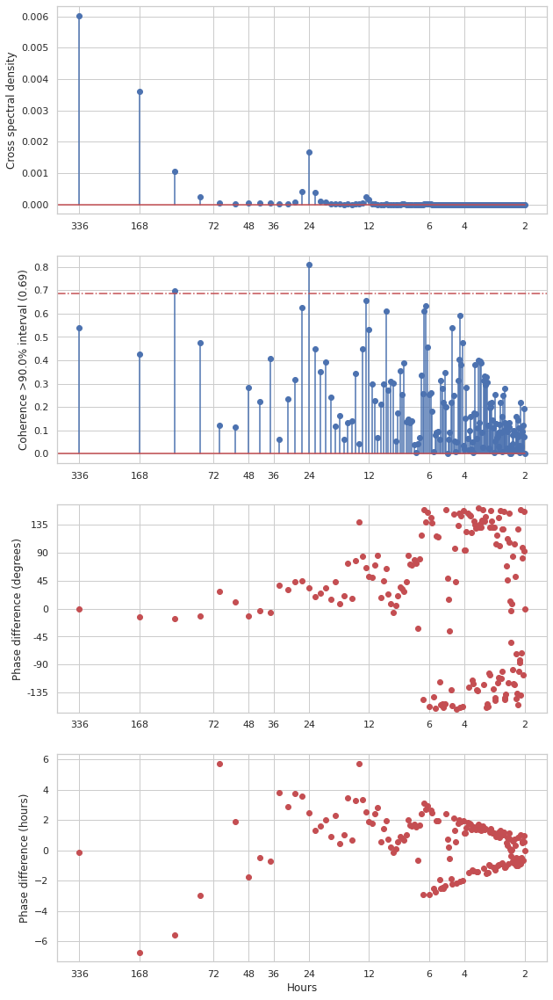

2021-05-25 00:08:52 INFO     771 (Canarias): ASO_ext, Lt = 70.06 -- T: 24.0, coh: 0.8084402027730548, hr: 2.4543546953239352
2021-05-25 00:08:52 INFO     771 (Canarias) (lat: 31.462, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:52 DEBUG    771: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/771_JFM_hours.npz
2021-05-25 00:08:52 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:52 DEBUG    771: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/771_JFM_hours.npz
2021-05-25 00:08:52 INFO     771 (Canarias): JFM_ext, Lt = 60.0
2021-05-25 00:08:52 INFO     771: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:52 INFO     771: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/771_JFM_ext_hours.npz
2021-05-25 00:08:52 INFO     771: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/771_JFM_ext_hours.npz
2021-05-25 00:08:52 INFO     771: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least

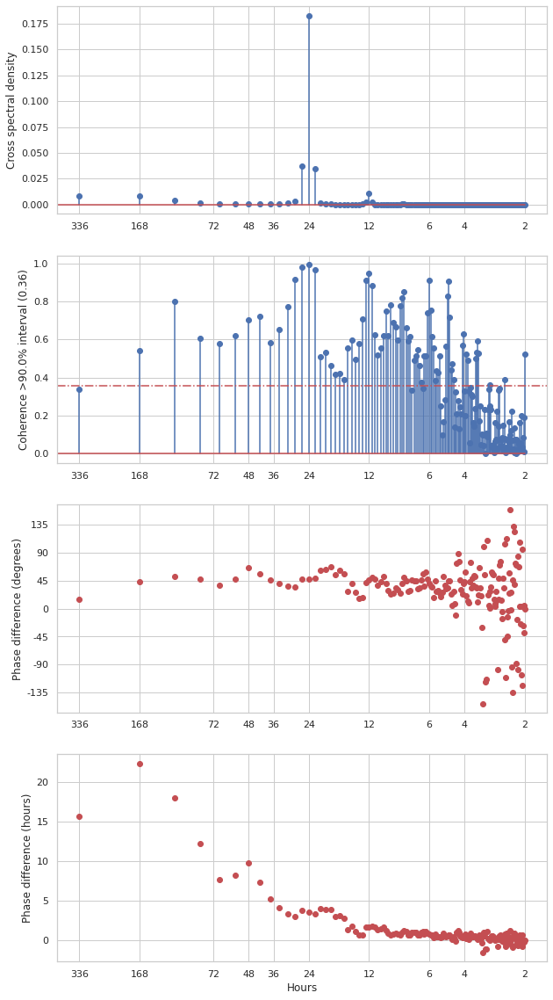

2021-05-25 00:08:54 INFO     771 (Canarias): JFM_ext, Lt = 60.0 -- T: 24.0, coh: 0.9916430450390036, hr: 3.4960151063442564
2021-05-25 00:08:54 INFO     750 (Canarias) (lat: 26.641, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:54 DEBUG    750: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-05-25 00:08:54 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:54 DEBUG    750: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-05-25 00:08:54 INFO     750 (Canarias): ASO_ext, Lt = 73.42
2021-05-25 00:08:54 INFO     750: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:54 INFO     750: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-05-25 00:08:54 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-05-25 00:08:54 INFO     750: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

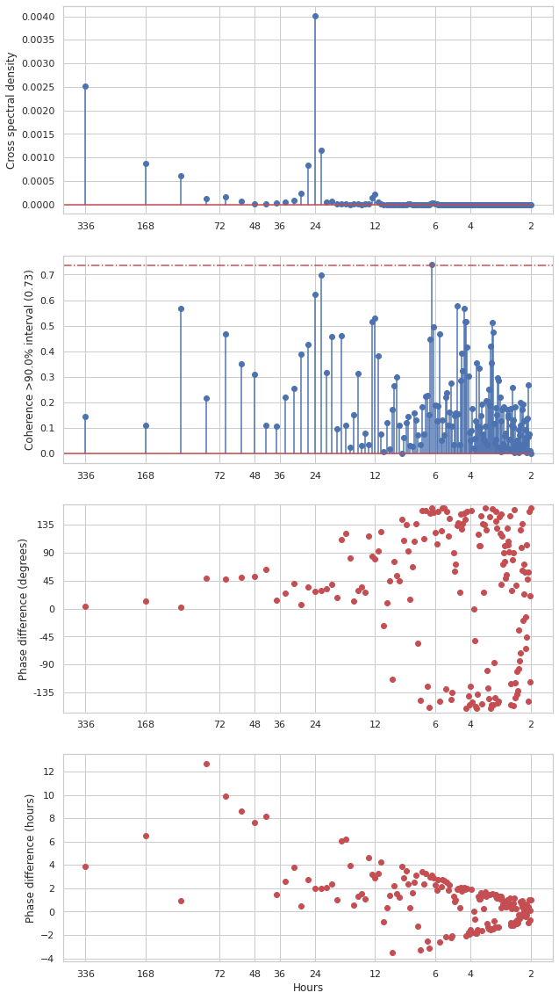

2021-05-25 00:08:57 INFO     750 (Canarias): ASO_ext, Lt = 73.42 -- T: 24.0, coh: 0.623212006759968, hr: 2.015653912879979
2021-05-25 00:08:57 INFO     750 (Canarias) (lat: 26.641, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:08:57 DEBUG    750: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-05-25 00:08:57 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:57 DEBUG    750: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-05-25 00:08:57 INFO     750 (Canarias): JFM_ext, Lt = 60.0
2021-05-25 00:08:57 INFO     750: JFM_ext (style=full) -- Ensuring
2021-05-25 00:08:57 INFO     750: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-05-25 00:08:57 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-05-25 00:08:57 INFO     750: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least i

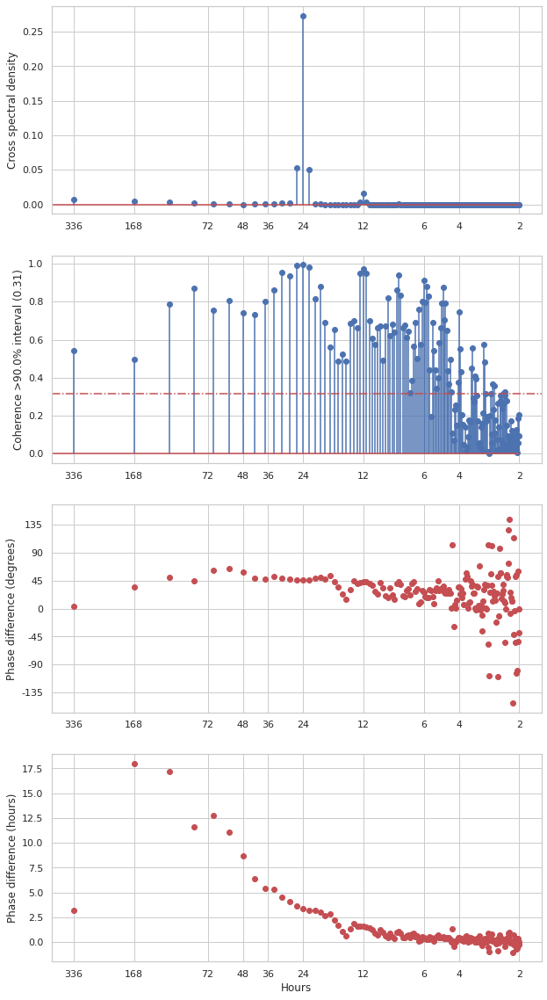

2021-05-25 00:08:59 INFO     750 (Canarias): JFM_ext, Lt = 60.0 -- T: 24.0, coh: 0.9932392406707204, hr: 3.3521511780024276
2021-05-25 00:08:59 INFO     730 (Canarias) (lat: 21.611, lon: -23): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:08:59 DEBUG    730: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/730_ASO_hours.npz
2021-05-25 00:08:59 INFO     Spectra file exists. Skipping.
2021-05-25 00:08:59 DEBUG    730: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/730_ASO_hours.npz
2021-05-25 00:08:59 INFO     730 (Canarias): ASO_ext, Lt = 77.7
2021-05-25 00:08:59 INFO     730: ASO_ext (style=full) -- Ensuring
2021-05-25 00:08:59 INFO     730: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/730_ASO_ext_hours.npz
2021-05-25 00:08:59 INFO     730: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/730_ASO_ext_hours.npz
2021-05-25 00:08:59 INFO     730: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least

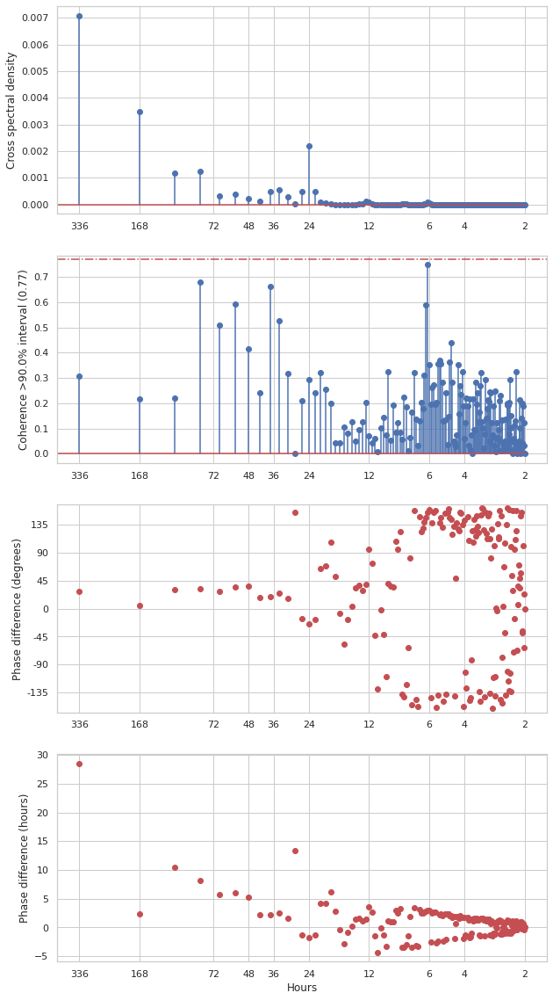

2021-05-25 00:09:02 INFO     730 (Canarias): ASO_ext, Lt = 77.7 -- T: 24.0, coh: 0.29420316435512567, hr: -1.8072135355920593
2021-05-25 00:09:02 INFO     730 (Canarias) (lat: 21.611, lon: -23): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:02 DEBUG    730: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/730_JFM_hours.npz
2021-05-25 00:09:02 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:02 DEBUG    730: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/730_JFM_hours.npz
2021-05-25 00:09:02 INFO     730 (Canarias): JFM_ext, Lt = 61.0
2021-05-25 00:09:02 INFO     730: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:02 INFO     730: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/730_JFM_ext_hours.npz
2021-05-25 00:09:02 INFO     730: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/730_JFM_ext_hours.npz
2021-05-25 00:09:02 INFO     730: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

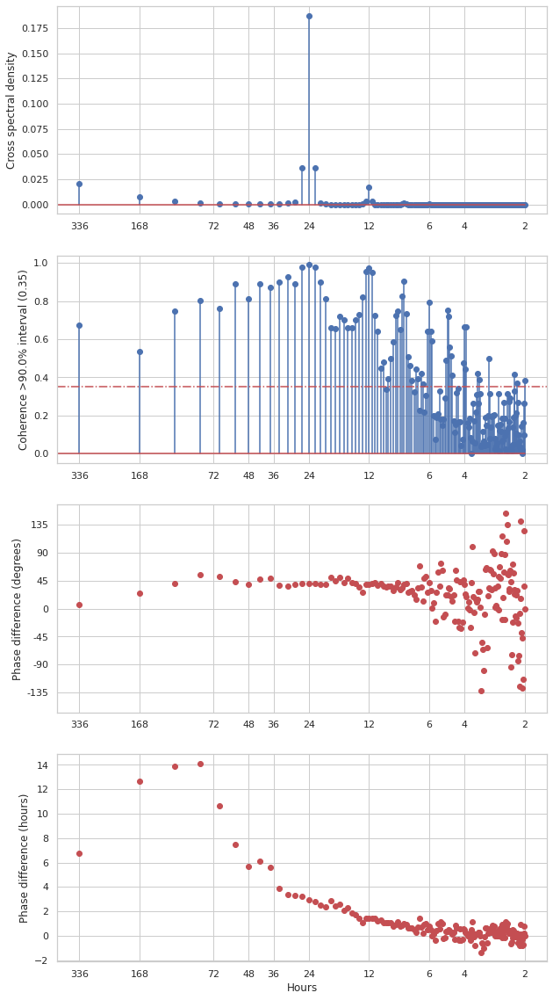

2021-05-25 00:09:04 INFO     730 (Canarias): JFM_ext, Lt = 61.0 -- T: 24.0, coh: 0.9897382974654405, hr: 2.937053421132261
2021-05-25 00:09:04 INFO     709 (Canarias) (lat: 16.398, lon: -29): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:04 DEBUG    709: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/709_ASO_hours.npz
2021-05-25 00:09:04 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:04 DEBUG    709: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/709_ASO_hours.npz
2021-05-25 00:09:04 INFO     709 (Canarias): ASO_ext, Lt = 129.32
2021-05-25 00:09:04 INFO     709: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:04 INFO     709: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/709_ASO_ext_hours.npz
2021-05-25 00:09:04 INFO     709: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/709_ASO_ext_hours.npz
2021-05-25 00:09:04 INFO     709: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

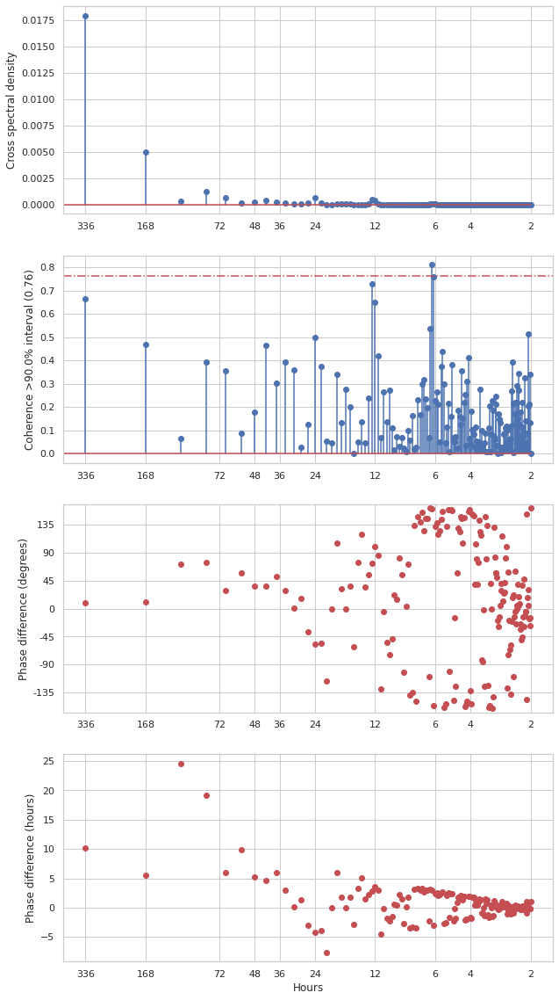

2021-05-25 00:09:07 INFO     709 (Canarias): ASO_ext, Lt = 129.32 -- T: 24.0, coh: 0.49794152150294024, hr: -4.2408345467541455
2021-05-25 00:09:07 INFO     709 (Canarias) (lat: 16.398, lon: -29): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:07 DEBUG    709: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/709_JFM_hours.npz
2021-05-25 00:09:07 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:07 DEBUG    709: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/709_JFM_hours.npz
2021-05-25 00:09:07 INFO     709 (Canarias): JFM_ext, Lt = 66.59
2021-05-25 00:09:07 INFO     709: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:07 INFO     709: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/709_JFM_ext_hours.npz
2021-05-25 00:09:07 INFO     709: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/709_JFM_ext_hours.npz
2021-05-25 00:09:07 INFO     709: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at l

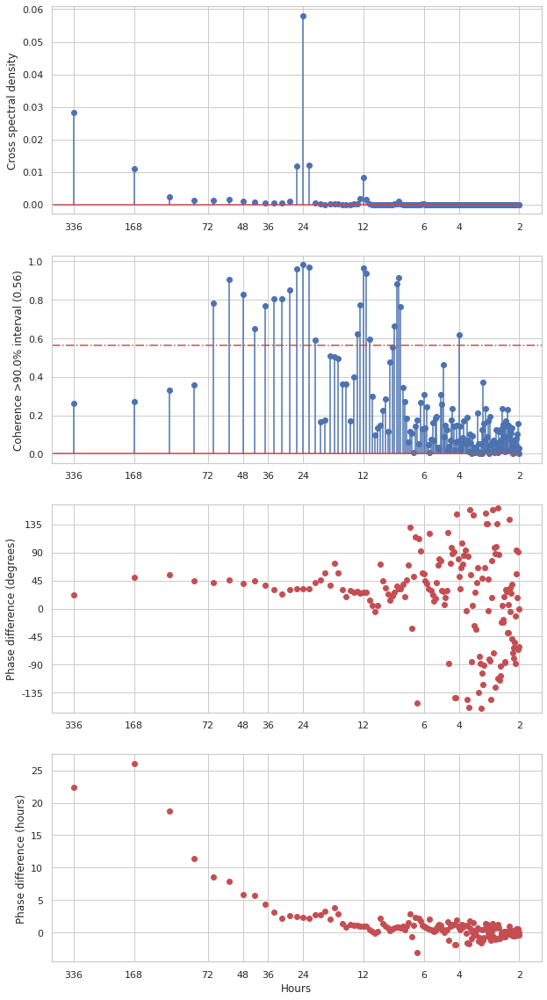

2021-05-25 00:09:09 INFO     709 (Canarias): JFM_ext, Lt = 66.59 -- T: 24.0, coh: 0.9806903413543769, hr: 2.3255818489229507
2021-05-25 00:09:09 INFO     596 (Peru) (lat: -16.398, lon: -83): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:09 DEBUG    596: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/596_ASO_hours.npz
2021-05-25 00:09:09 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:09 DEBUG    596: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/596_ASO_hours.npz
2021-05-25 00:09:09 INFO     596 (Peru): ASO_ext, Lt = 63.94
2021-05-25 00:09:09 INFO     596: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:09 INFO     596: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/596_ASO_ext_hours.npz
2021-05-25 00:09:09 INFO     596: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/596_ASO_ext_hours.npz
2021-05-25 00:09:09 INFO     596: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least incl

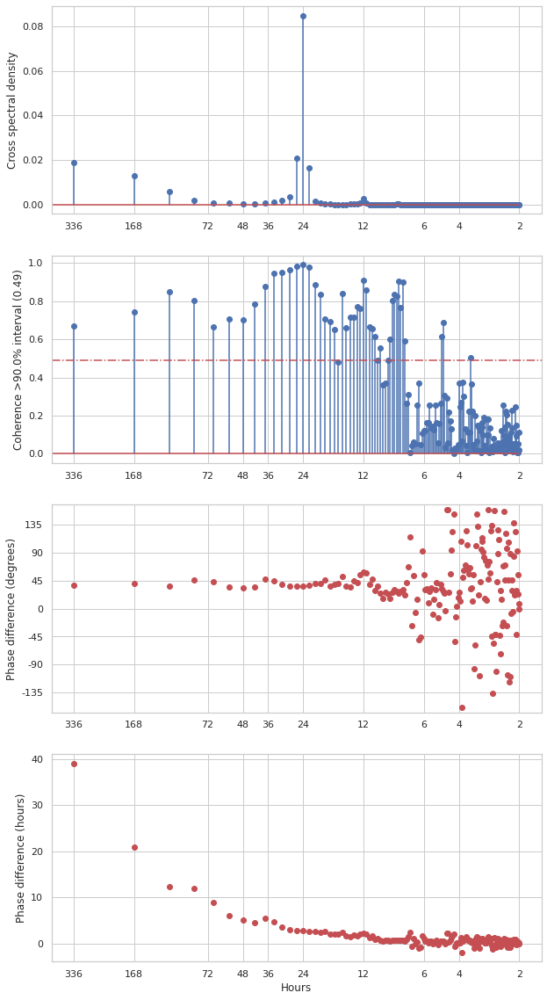

2021-05-25 00:09:12 INFO     596 (Peru): ASO_ext, Lt = 63.94 -- T: 24.0, coh: 0.9900477319113206, hr: 2.694141872716716
2021-05-25 00:09:12 INFO     596 (Peru) (lat: -16.398, lon: -83): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:12 DEBUG    596: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/596_JFM_hours.npz
2021-05-25 00:09:12 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:12 DEBUG    596: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/596_JFM_hours.npz
2021-05-25 00:09:12 INFO     596 (Peru): JFM_ext, Lt = 76.48
2021-05-25 00:09:12 INFO     596: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:12 INFO     596: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/596_JFM_ext_hours.npz
2021-05-25 00:09:12 INFO     596: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/596_JFM_ext_hours.npz
2021-05-25 00:09:12 INFO     596: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes w

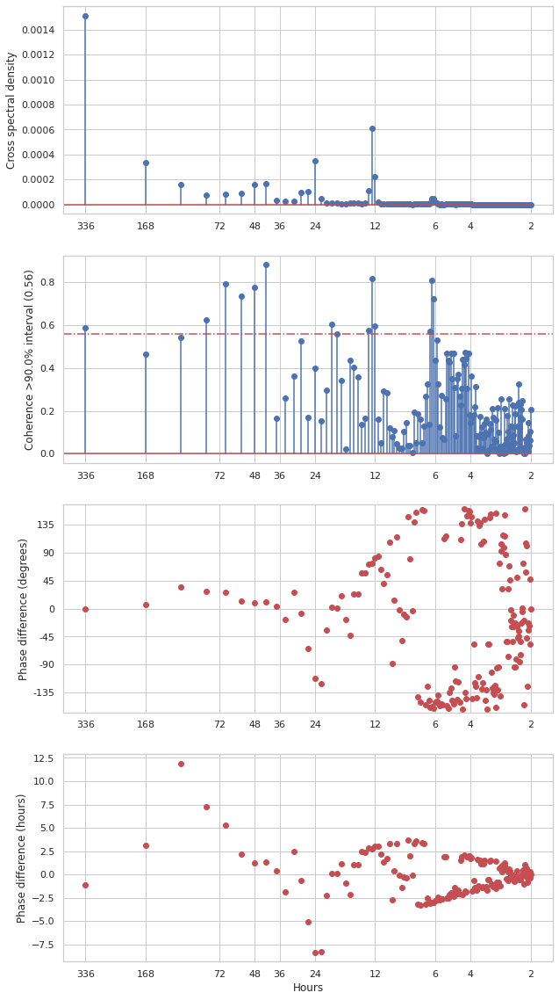

2021-05-25 00:09:14 INFO     596 (Peru): JFM_ext, Lt = 76.48 -- T: 24.0, coh: 0.40021014151735307, hr: -8.332973964525648
2021-05-25 00:09:14 INFO     572 (Peru) (lat: -21.611, lon: -77): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:14 DEBUG    572: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-25 00:09:14 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:14 DEBUG    572: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-05-25 00:09:14 INFO     572 (Peru): ASO_ext, Lt = 61.88
2021-05-25 00:09:14 INFO     572: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:14 INFO     572: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-25 00:09:14 INFO     572: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_ASO_ext_hours.npz
2021-05-25 00:09:14 INFO     572: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least include

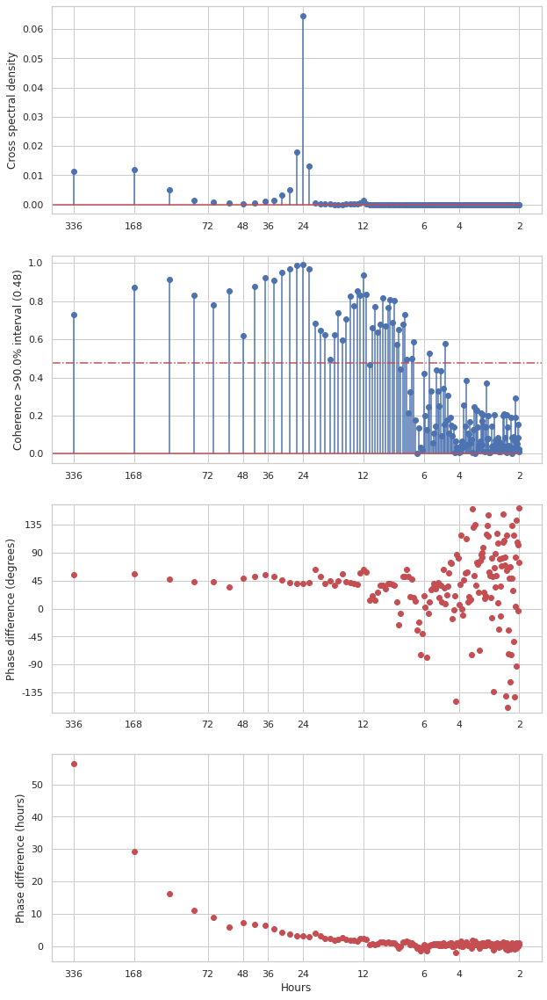

2021-05-25 00:09:17 INFO     572 (Peru): ASO_ext, Lt = 61.88 -- T: 24.0, coh: 0.9900925215139421, hr: 3.01123821137986
2021-05-25 00:09:17 INFO     572 (Peru) (lat: -21.611, lon: -77): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:17 DEBUG    572: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-25 00:09:17 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:17 DEBUG    572: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-05-25 00:09:17 INFO     572 (Peru): JFM_ext, Lt = 74.28
2021-05-25 00:09:17 INFO     572: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:17 INFO     572: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-25 00:09:17 INFO     572: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/572_JFM_ext_hours.npz
2021-05-25 00:09:17 INFO     572: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes wh

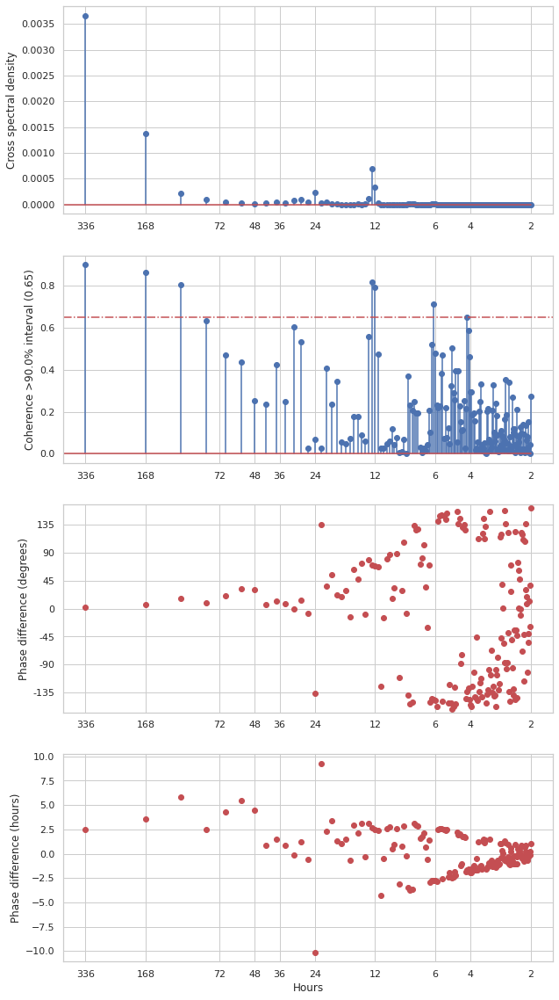

2021-05-25 00:09:19 INFO     572 (Peru): JFM_ext, Lt = 74.28 -- T: 24.0, coh: 0.06707903402030771, hr: -10.12168131124825
2021-05-25 00:09:19 INFO     450 (Peru) (lat: -40.411, lon: -83): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:19 DEBUG    450: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/450_ASO_hours.npz
2021-05-25 00:09:19 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:19 DEBUG    450: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/450_ASO_hours.npz
2021-05-25 00:09:19 INFO     450 (Peru): ASO_ext, Lt = 76.0
2021-05-25 00:09:19 INFO     450: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:19 INFO     450: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/450_ASO_ext_hours.npz
2021-05-25 00:09:19 INFO     450: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/450_ASO_ext_hours.npz
2021-05-25 00:09:19 INFO     450: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes

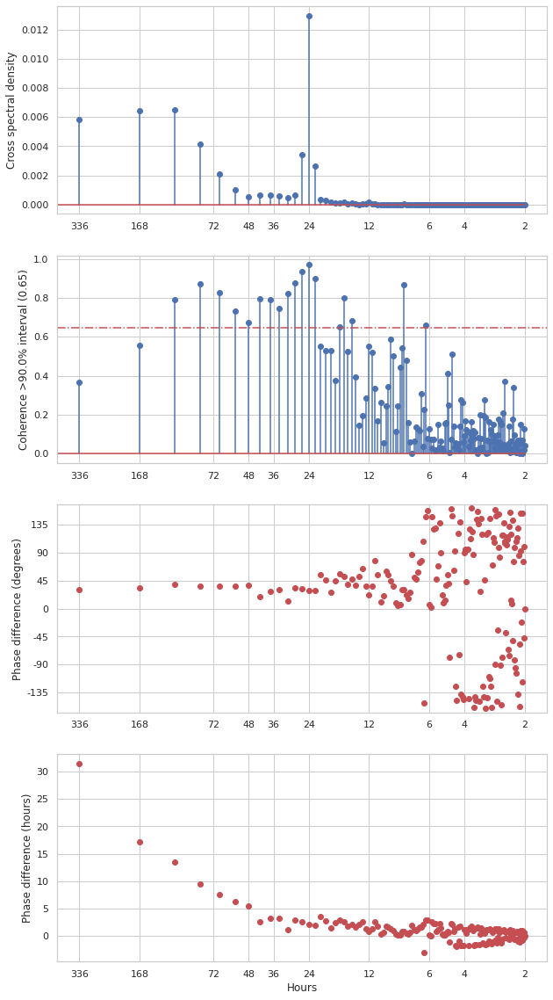

2021-05-25 00:09:22 INFO     450 (Peru): ASO_ext, Lt = 76.0 -- T: 24.0, coh: 0.9697842119648464, hr: 2.0967685767572375
2021-05-25 00:09:22 INFO     450 (Peru) (lat: -40.411, lon: -83): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:22 DEBUG    450: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/450_JFM_hours.npz
2021-05-25 00:09:22 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:22 DEBUG    450: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/450_JFM_hours.npz
2021-05-25 00:09:22 INFO     450 (Peru): JFM_ext, Lt = 66.23
2021-05-25 00:09:22 INFO     450: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:22 INFO     450: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/450_JFM_ext_hours.npz
2021-05-25 00:09:22 INFO     450: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/450_JFM_ext_hours.npz
2021-05-25 00:09:22 INFO     450: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes w

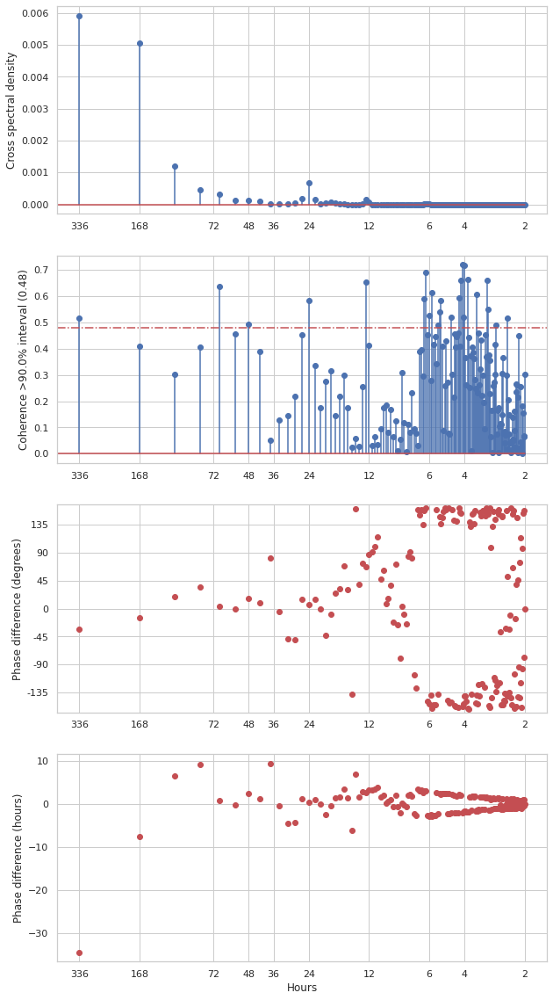

2021-05-25 00:09:24 INFO     450 (Peru): JFM_ext, Lt = 66.23 -- T: 24.0, coh: 0.583523908329249, hr: 0.42109958659210206
2021-05-25 00:09:24 INFO     602 (Benguela) (lat: -11.032, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:24 DEBUG    602: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/602_ASO_hours.npz
2021-05-25 00:09:24 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:24 DEBUG    602: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/602_ASO_hours.npz
2021-05-25 00:09:24 INFO     602 (Benguela): ASO_ext, Lt = 64.44
2021-05-25 00:09:24 INFO     602: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:24 INFO     602: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/602_ASO_ext_hours.npz
2021-05-25 00:09:24 INFO     602: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/602_ASO_ext_hours.npz
2021-05-25 00:09:24 INFO     602: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least in

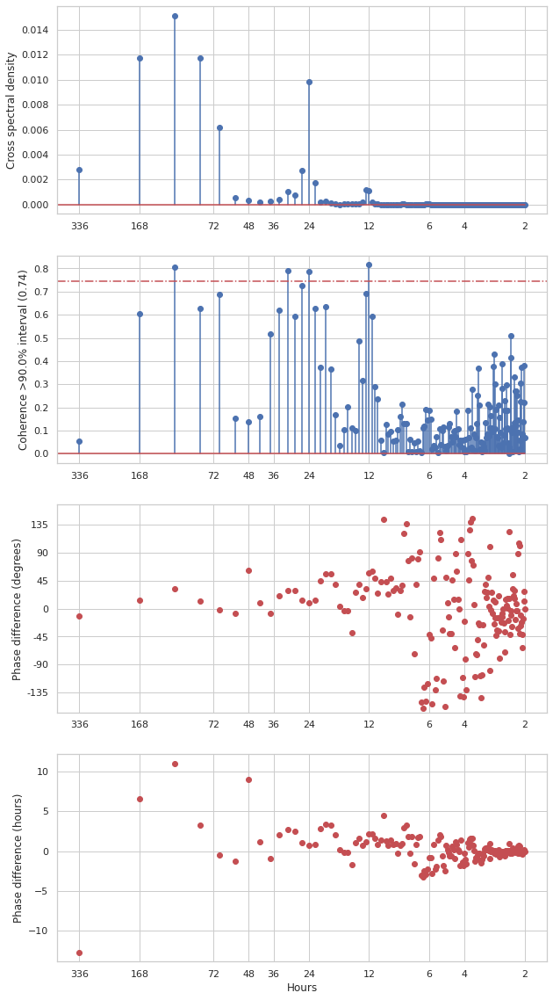

2021-05-25 00:09:27 INFO     602 (Benguela): ASO_ext, Lt = 64.44 -- T: 24.0, coh: 0.7870560905427968, hr: 0.7263418051581881
2021-05-25 00:09:27 INFO     602 (Benguela) (lat: -11.032, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:27 DEBUG    602: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/602_JFM_hours.npz
2021-05-25 00:09:27 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:27 DEBUG    602: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/602_JFM_hours.npz
2021-05-25 00:09:27 INFO     602 (Benguela): JFM_ext, Lt = 125.72
2021-05-25 00:09:27 INFO     602: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:27 INFO     602: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/602_JFM_ext_hours.npz
2021-05-25 00:09:27 INFO     602: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/602_JFM_ext_hours.npz
2021-05-25 00:09:27 INFO     602: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

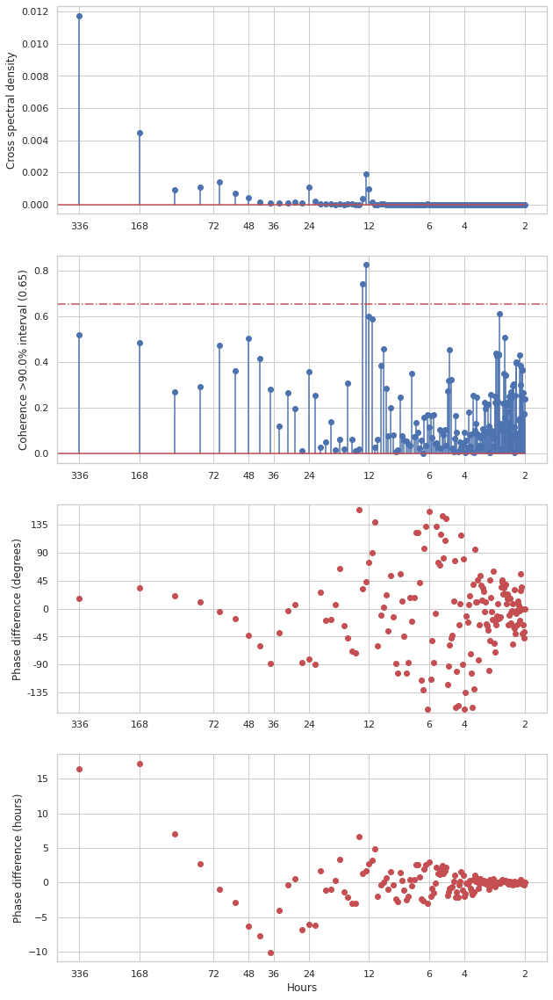

2021-05-25 00:09:29 INFO     602 (Benguela): JFM_ext, Lt = 125.72 -- T: 24.0, coh: 0.36018035741227455, hr: -6.0271853287325845
2021-05-25 00:09:29 INFO     578 (Benguela) (lat: -16.398, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:29 DEBUG    578: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-05-25 00:09:29 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:29 DEBUG    578: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-05-25 00:09:29 INFO     578 (Benguela): ASO_ext, Lt = 64.19
2021-05-25 00:09:29 INFO     578: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:29 INFO     578: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/578_ASO_ext_hours.npz
2021-05-25 00:09:29 INFO     578: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/578_ASO_ext_hours.npz
2021-05-25 00:09:29 INFO     578: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at l

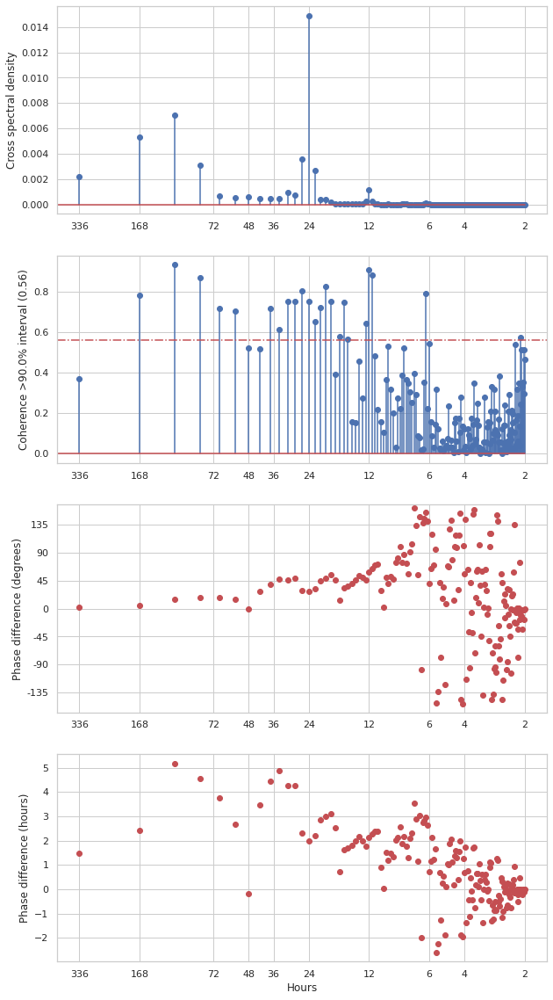

2021-05-25 00:09:32 INFO     578 (Benguela): ASO_ext, Lt = 64.19 -- T: 24.0, coh: 0.7515062992657354, hr: 1.9946699797128713
2021-05-25 00:09:32 INFO     578 (Benguela) (lat: -16.398, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:32 DEBUG    578: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-05-25 00:09:32 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:32 DEBUG    578: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-05-25 00:09:32 INFO     578 (Benguela): JFM_ext, Lt = 122.71
2021-05-25 00:09:32 INFO     578: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:32 INFO     578: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/578_JFM_ext_hours.npz
2021-05-25 00:09:32 INFO     578: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/578_JFM_ext_hours.npz
2021-05-25 00:09:32 INFO     578: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at leas

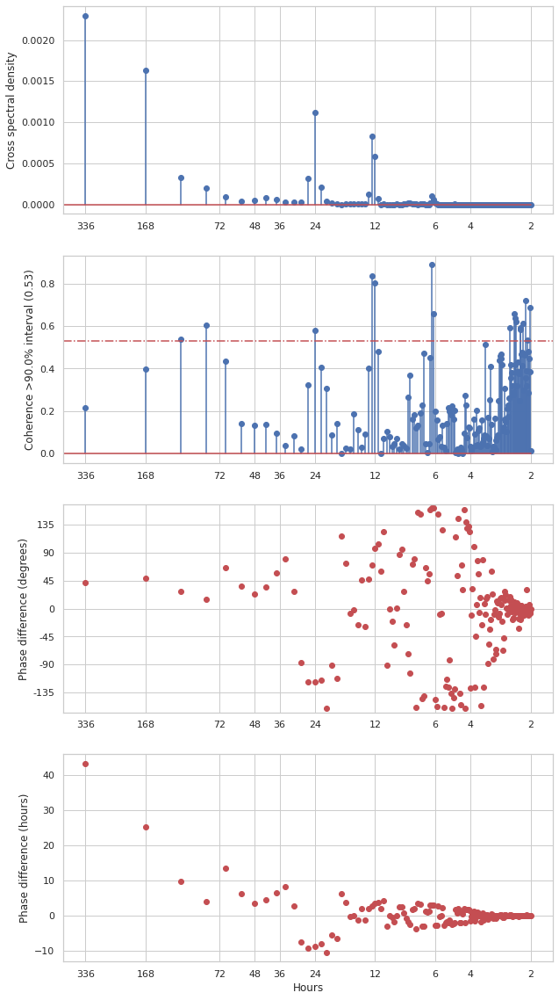

2021-05-25 00:09:35 INFO     578 (Benguela): JFM_ext, Lt = 122.71 -- T: 24.0, coh: 0.5778213407122773, hr: -8.663638800815846
2021-05-25 00:09:35 INFO     533 (Benguela) (lat: -26.641, lon: 7): ASO_ext, (2012-08-01 00:00:00+00:00 to 2012-10-30 23:00:00+00:00)
2021-05-25 00:09:35 DEBUG    533: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/533_ASO_hours.npz
2021-05-25 00:09:35 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:35 DEBUG    533: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/533_ASO_hours.npz
2021-05-25 00:09:35 INFO     533 (Benguela): ASO_ext, Lt = 61.3
2021-05-25 00:09:35 INFO     533: ASO_ext (style=full) -- Ensuring
2021-05-25 00:09:35 INFO     533: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-05-25 00:09:35 INFO     533: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_ASO_ext_hours.npz
2021-05-25 00:09:35 INFO     533: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at leas

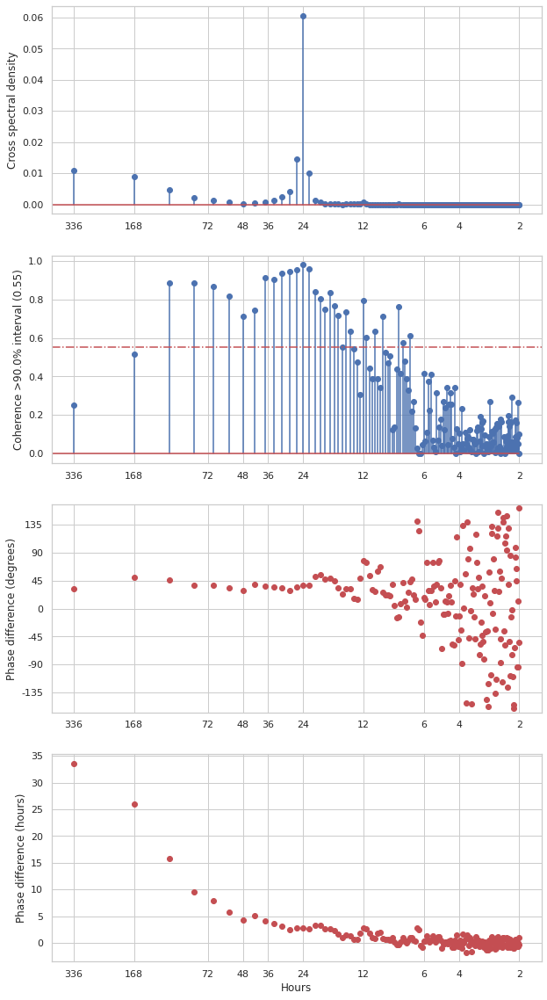

2021-05-25 00:09:37 INFO     533 (Benguela): ASO_ext, Lt = 61.3 -- T: 24.0, coh: 0.9779952036644213, hr: 2.725999184621742
2021-05-25 00:09:37 INFO     533 (Benguela) (lat: -26.641, lon: 7): JFM_ext, (2012-01-01 00:00:00+00:00 to 2012-03-31 23:00:00+00:00)
2021-05-25 00:09:37 DEBUG    533: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/533_JFM_hours.npz
2021-05-25 00:09:37 INFO     Spectra file exists. Skipping.
2021-05-25 00:09:37 DEBUG    533: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/533_JFM_hours.npz
2021-05-25 00:09:37 INFO     533 (Benguela): JFM_ext, Lt = 119.46
2021-05-25 00:09:37 INFO     533: JFM_ext (style=full) -- Ensuring
2021-05-25 00:09:37 INFO     533: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-05-25 00:09:37 INFO     533: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/533_JFM_ext_hours.npz
2021-05-25 00:09:37 INFO     533: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least 

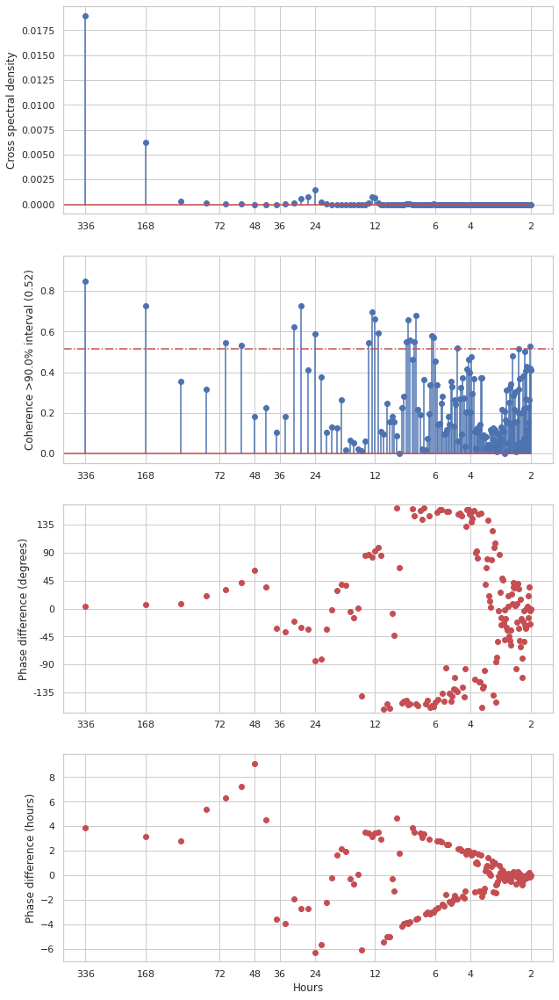

2021-05-25 00:09:40 INFO     533 (Benguela): JFM_ext, Lt = 119.46 -- T: 24.0, coh: 0.5895497383248922, hr: -6.2509143616994125


In [34]:
calc_phasediff("California", t_idx_slice=phasediff_slice, days_window=14)
calc_phasediff("Canarias", t_idx_slice=phasediff_slice, days_window=14)
calc_phasediff("Peru", t_idx_slice=phasediff_slice, days_window=14)
calc_phasediff("Benguela", t_idx_slice=phasediff_slice, days_window=14)

## RV y DIV en marzo y octubre 2012

In [95]:
nn=20
cbar_w, cbar_h = 0.03, 0.239
divnorm_deltaro = DivergingNorm(vmin=-1.,vcenter=0.,vmax=1.)

In [120]:
def plot_rvdiv_seasons(current, timezone=0, hr_offset=7, days_offset=30):
  rows,cols = 3,2
  fig = plt.figure(figsize=(8,9))
  
  #rid = ids_regions[current][-2]
  for rid in ids_regions[current][1:2]:
    print(current,ids_regions[current],rid)
    grid = VorticityGrid(rid)
    
    # ASO
    idx_taso = -days_offset*24 - hr_offset - timezone
    idx_t_aso = idx_t["hours"]["ASO"][idx_taso]
    time_sim_aso = simulationTime(idx_t_aso)
    region_aso = LLCRegion(rid, [idx_t_aso], tag='ASO')
    spectra_aso = load_spectra(rid,"ASO")
    Lt_aso = spectra_aso["Lt_km"]
    print(rid, "ASO", idx_taso, time_sim_aso, "Lt = ", Lt_aso)
    uaso,vaso = uv4idt(rid,idx_t_aso,0)
    logging.info("Sizes U,V [MB]: {},{}".format(uaso.nbytes/(1024**2),vaso.nbytes/(1024**2)))
    logging.info("dtypes U,V: {},{}".format(uaso.dtype,vaso.dtype))
    ro_aso = grid.rv(uaso,vaso)/grid.f
    delta_aso = grid.div(uaso,vaso)/grid.f
    # JFM
    idx_tjfm = -days_offset*24 - hr_offset - timezone
    idx_t_jfm = idx_t["hours"]["JFM"][idx_tjfm]
    time_sim_jfm = simulationTime(idx_t_jfm)
    region_jfm = LLCRegion(rid, [idx_t_jfm], tag='JFM')
    spectra_jfm = load_spectra(rid,"JFM")
    Lt_jfm = spectra_jfm["Lt_km"]
    print(rid, "JFM", idx_tjfm, time_sim_jfm, "Lt = ", Lt_jfm)
    ujfm,vjfm = uv4idt(rid,idx_t_jfm,0)
    logging.info("Sizes U,V [MB]: {},{}".format(ujfm.nbytes/(1024**2),vjfm.nbytes/(1024**2)))
    logging.info("dtypes U,V: {},{}".format(ujfm.dtype,vjfm.dtype))
    #ro_jfm = grid.rv(ujfm,vjfm)/grid.f
    #delta_jfm = grid.div(ujfm,vjfm)/grid.f
    
    # RV and DIV filtered
    _,_,rohi_aso,delhi_aso = get_ro_delta(region_aso, Lt_aso)
    _,_,rohi_jfm,delhi_jfm = get_ro_delta(region_jfm, Lt_jfm)
    
    ### Plot
    
    ## RV
    ro_aso = rohi_aso[0,:,:]
    ro_jfm = rohi_jfm[0,:,:]
    
    ##
    ax0 = fig.add_subplot(rows,cols,1)
    plt.title("Summer",size='xx-large')
    plt.pcolormesh(grid.lon_g,grid.lat_g,ro_aso,norm=divnorm_deltaro,cmap=cmocean.cm.curl)
    #
    plt.xlabel("Longitude", size='large')
    plt.ylabel("Latitude", size='large')
    ##
    ax1 = fig.add_subplot(rows,cols,2,sharey=ax0)
    plt.setp(ax1.get_yticklabels(), visible=False)
    #
    plt.title("Winter",size='xx-large')
    plt.pcolormesh(grid.lon_g,grid.lat_g,ro_jfm,norm=divnorm_deltaro,cmap=cmocean.cm.curl)
    #
    plt.xlabel("Longitude", size='large')
    ## cbar
    cax = plt.axes([0.97, 0.714, cbar_w, cbar_h])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='medium')
    cb.set_label('$\zeta/f$')
    
    ## DIV
    delta_aso = delhi_aso[0,:,:]
    delta_jfm = delhi_jfm[0,:,:]
    
    ##
    ax2 = fig.add_subplot(rows,cols,3,sharex=ax0)
    #
    plt.pcolormesh(grid.lon_c,grid.lat_c,delta_aso,norm=divnorm_deltaro,cmap=plt.cm.RdBu)
    #
    plt.xlabel("Longitude", size='large')
    plt.ylabel("\nLatitude", size='large')
    ##
    ax3 = fig.add_subplot(rows,cols,4,sharex=ax1,sharey=ax2)
    plt.setp(ax3.get_yticklabels(), visible=False)
    #
    plt.pcolormesh(grid.lon_c,grid.lat_c,delta_jfm,norm=divnorm_deltaro,cmap=plt.cm.RdBu)
    #
    plt.xlabel("Longitude", size='large')
    #cbar
    cax = plt.axes([0.97, 0.396, cbar_w, cbar_h])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='medium')
    cb.set_label('$\delta/f$')
    
    ## Theta
    #theta_aso = theta4idt(rid,idx_t_aso,0)
    #theta_jfm = theta4idt(rid,idx_t_jfm,0)
    #min_theta = min(np.min(theta_jfm),np.min(theta_aso))
    #max_theta = max(np.max(theta_jfm),np.max(theta_aso))
    #norm_theta = Normalize(vmin=min_theta ,vmax=max_theta)
    #cont_alpha = 0.5
    #cont_per_degree = 3.0
    #theta_contours = [x/cont_per_degree for x in range(int(cont_per_degree*min_theta),int(cont_per_degree*max_theta))]
    
    ##
    #ax4 = fig.add_subplot(rows,cols,5,sharex=ax0)
    #
    #plt.contour(grid.lon_c,grid.lat_c,theta_aso,theta_contours,colors='gray',zorder=10,alpha=cont_alpha)
    #plt.pcolormesh(grid.lon_c,grid.lat_c,theta_aso,norm=norm_theta,cmap=cmocean.cm.thermal)
    #
    #plt.xlabel("Longitude", size='large')
    #plt.ylabel("Latitude", size='large')
    ##
    #ax5 = fig.add_subplot(rows,cols,6,sharex=ax1,sharey=ax4)
    #plt.setp(ax5.get_yticklabels(), visible=False)
    #
    #plt.contour(grid.lon_c,grid.lat_c,theta_jfm,theta_contours,colors='gray',zorder=10,alpha=cont_alpha)
    #plt.pcolormesh(grid.lon_c,grid.lat_c,theta_jfm,norm=norm_theta,cmap=cmocean.cm.thermal)
    #
    #plt.xlabel("Longitude", size='large')
    #cbar
    #cax = plt.axes([0.97, 0.312, cbar_w, cbar_h])
    #cb = plt.colorbar(cax=cax)
    #cb.ax.tick_params(labelsize='medium')
    #cb.set_label('SST [C]')

    ## Joint PDF
    min_ro = min(np.min(ro_jfm),np.min(ro_aso))
    max_ro = max(np.max(ro_jfm),np.max(ro_aso))
    min_delta = min(np.min(delta_jfm),np.min(delta_aso))
    max_delta = max(np.max(delta_jfm),np.max(delta_aso))
    rolim = [min_ro,max_ro]
    deltalim = [min_delta,max_delta]
    
    ##
    ax6 = fig.add_subplot(rows,cols,5)
    plt.hist2d(ro_aso.flat[:],delta_aso.flat[:],bins=100,density=True,norm=LogNorm(),cmap=plt.cm.cubehelix_r)
    #
    plt.xlim([-1.5,1.5])
    plt.ylim([-1.5,1.5])
    plt.axvline(x=0,ls='--',c='k',alpha=0.5)
    plt.axhline(y=0,ls='--',c='k',alpha=0.5)
    plt.xlabel("${\zeta}/{f}$",size='large')
    plt.ylabel("${\delta}/{f}$",size='large')
    #
    ax7 = fig.add_subplot(rows,cols,6, sharey=ax6)
    plt.setp(ax7.get_yticklabels(), visible=False)
    #
    plt.hist2d(ro_jfm.flat[:],delta_jfm.flat[:],bins=100,density=True,norm=LogNorm(),cmap=plt.cm.cubehelix_r)
    #
    plt.xlim([-1.5,1.5])
    plt.ylim([-1.5,1.5])
    plt.axvline(x=0,ls='--',c='k',alpha=0.5)
    plt.axhline(y=0,ls='--',c='k',alpha=0.5)
    plt.xlabel("${\zeta}/{f}$",size='large')
    #cbar
    cax = plt.axes([0.97, 0.079, cbar_w, cbar_h])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='medium')
    cb.set_label('Joint probability density function')

    # Shared xy labels
    fig.tight_layout()

    plt.savefig("figs/{}_snaps_seasons.pdf".format(current), bbox_inches='tight')
    plt.show()

California [868, 852, 831, 809, 787, 762] 852


2021-07-07 18:40:58 INFO     Grid: dx = 1.5383772590277776 km, dy = 1.6505256729166673 km, dt = 1 h
2021-07-07 18:40:58 INFO     Exists? 852: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-07-07 18:40:58 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 18:40:58 INFO     Sizes U,V [MB]: 0.31640625,0.31640625
2021-07-07 18:40:58 INFO     dtypes U,V: float32,float32


852 ASO -729 2012-10-01 15:00:00+00:00 Lt =  118.7


2021-07-07 18:40:58 INFO     Grid: dx = 1.5383772590277776 km, dy = 1.6505256729166673 km, dt = 1 h
2021-07-07 18:40:58 INFO     Exists? 852: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-07-07 18:40:58 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 18:40:58 INFO     Sizes U,V [MB]: 0.31640625,0.31640625
2021-07-07 18:40:58 INFO     dtypes U,V: float32,float32
2021-07-07 18:40:58 INFO     Loading U: shape (k=0): (288, 288, 1)


852 JFM -729 2012-03-01 15:00:00+00:00 Lt =  44.5


2021-07-07 18:40:59 INFO     Loading V: shape (k=0): (288, 288, 1)
2021-07-07 18:40:59 INFO     kxky -- Nx: 288, Ny: 288
2021-07-07 18:40:59 INFO     kxky -- Lx: 576, Ly: 576
2021-07-07 18:40:59 INFO     kxky -- Nx: 288, Ny: 288
2021-07-07 18:40:59 INFO     kxky -- Lx: 576, Ly: 576
2021-07-07 18:40:59 INFO     Loading U: shape (k=0): (288, 288, 1)
2021-07-07 18:40:59 INFO     Loading V: shape (k=0): (288, 288, 1)
2021-07-07 18:40:59 INFO     kxky -- Nx: 288, Ny: 288
2021-07-07 18:40:59 INFO     kxky -- Lx: 576, Ly: 576
2021-07-07 18:40:59 INFO     kxky -- Nx: 288, Ny: 288
2021-07-07 18:40:59 INFO     kxky -- Lx: 576, Ly: 576


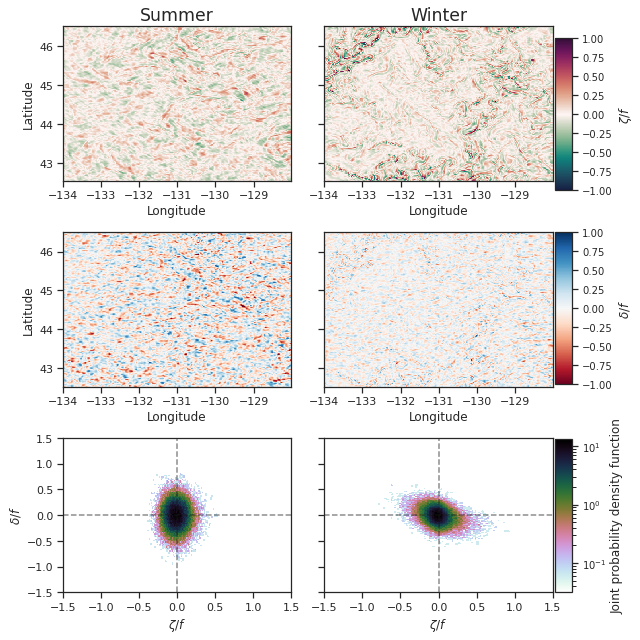

In [70]:
plot_rvdiv_seasons("California")

Canarias [771, 750, 730, 709] 750


2021-07-23 12:30:05 INFO     Grid: dx = 2.0694956027777773 km, dy = 1.902540301736111 km, dt = 1 h
2021-07-23 12:30:05 INFO     Exists? 750: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-07-23 12:30:05 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-23 12:30:05 INFO     Sizes U,V [MB]: 0.3175048828125,0.3175048828125
2021-07-23 12:30:05 INFO     dtypes U,V: float32,float32


750 ASO -727 2012-10-01 17:00:00+00:00 Lt =  73.42


2021-07-23 12:30:05 INFO     Grid: dx = 2.0694956027777773 km, dy = 1.902540301736111 km, dt = 1 h
2021-07-23 12:30:05 INFO     Exists? 750: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-07-23 12:30:06 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-23 12:30:06 INFO     Sizes U,V [MB]: 0.3175048828125,0.3175048828125
2021-07-23 12:30:06 INFO     dtypes U,V: float32,float32
2021-07-23 12:30:06 INFO     Loading U: shape (k=0): (288, 289, 1)


750 JFM -727 2012-03-01 17:00:00+00:00 Lt =  60.0


2021-07-23 12:30:06 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-23 12:30:06 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:30:06 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:30:06 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:30:06 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:30:06 INFO     Loading U: shape (k=0): (288, 289, 1)
2021-07-23 12:30:06 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-23 12:30:06 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:30:06 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:30:06 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:30:06 INFO     kxky -- Lx: 578, Ly: 576


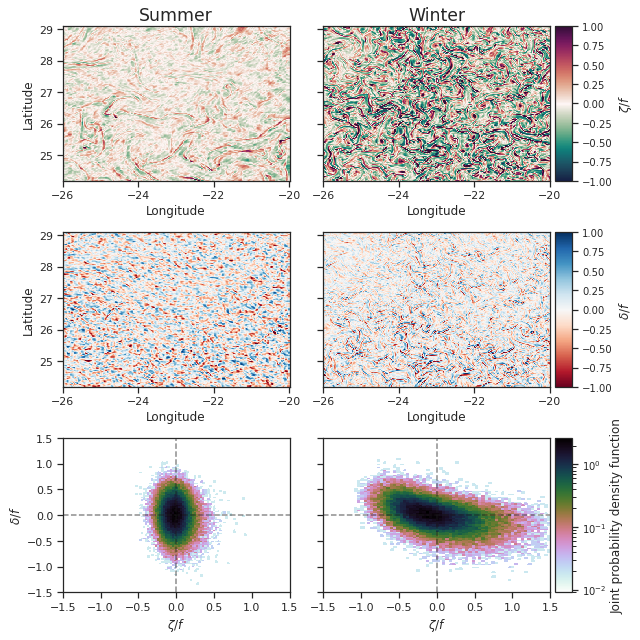

In [121]:
plot_rvdiv_seasons("Canarias")

Peru [596, 572, 450] 572


2021-07-07 17:14:28 INFO     Grid: dx = 1.9787329799999998 km, dy = 2.152516785862069 km, dt = 1 h
2021-07-07 17:14:28 INFO     Exists? 572: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-07-07 17:14:28 DEBUG    572: _ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-07-07 17:14:28 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 17:14:28 DEBUG    572: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_ASO_hours.npz
2021-07-07 17:14:29 INFO     Sizes U,V [MB]: 0.31970977783203125,0.31970977783203125
2021-07-07 17:14:29 INFO     dtypes U,V: float32,float32


572 ASO -729 2012-10-01 15:00:00+00:00 Lt =  61.88


2021-07-07 17:14:29 INFO     Grid: dx = 1.9787329799999998 km, dy = 2.152516785862069 km, dt = 1 h
2021-07-07 17:14:29 INFO     Exists? 572: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-07-07 17:14:29 DEBUG    572: _JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-07-07 17:14:29 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 17:14:29 DEBUG    572: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/572_JFM_hours.npz
2021-07-07 17:14:29 INFO     Sizes U,V [MB]: 0.31970977783203125,0.31970977783203125
2021-07-07 17:14:29 INFO     dtypes U,V: float32,float32
2021-07-07 17:14:29 INFO     Loading U: shape (k=0): (290, 289, 1)


572 JFM -729 2012-03-01 15:00:00+00:00 Lt =  74.28


2021-07-07 17:14:29 DEBUG    Geting result U - 1/4
2021-07-07 17:14:29 DEBUG    Loading U (thread: 0dd8d5ff-94d4-4863-849e-11f1d8e0fbbf): shape (k=0): (290, 289, 0)
2021-07-07 17:14:29 DEBUG    Loading U (thread: 0cbc19fa-365e-4c8e-8dc5-68f9988c2f21): shape (k=0): (290, 289, 0)
2021-07-07 17:14:29 DEBUG    Loading U (thread: 9b395588-544a-488f-bf4a-b1c2cf0c65be): shape (k=0): (290, 289, 0)
2021-07-07 17:14:29 DEBUG    Loading U (thread: c5700c19-fd23-4d3a-8f47-c8f30aba253e): shape (k=0): (290, 289, 1)
2021-07-07 17:14:29 DEBUG    Got result U - 1/4
2021-07-07 17:14:29 DEBUG    Geting result U - 2/4
2021-07-07 17:14:29 DEBUG    Got result U - 2/4
2021-07-07 17:14:29 DEBUG    Geting result U - 3/4
2021-07-07 17:14:29 DEBUG    Got result U - 3/4
2021-07-07 17:14:29 DEBUG    Geting result U - 4/4
2021-07-07 17:14:29 DEBUG    Got result U - 4/4
2021-07-07 17:14:30 INFO     Loading V: shape (k=0): (290, 289, 1)
2021-07-07 17:14:30 DEBUG    Geting result V - 1/4
2021-07-07 17:14:30 DEBUG    L

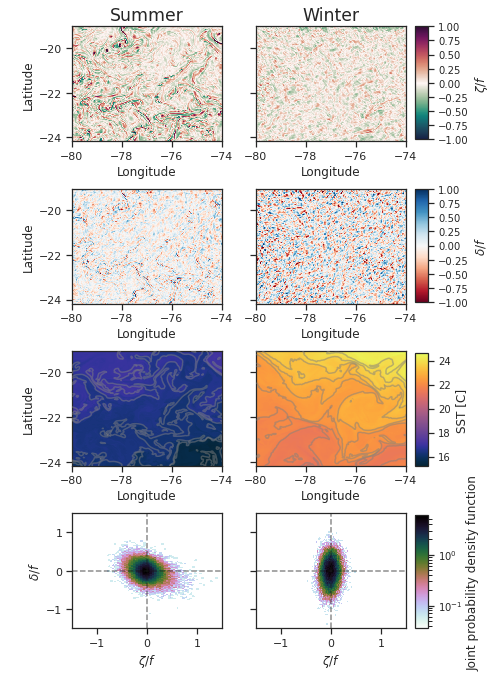

In [41]:
plot_rvdiv_seasons("Peru")

Benguela [602, 578, 533] 578


2021-07-07 17:14:33 INFO     Grid: dx = 2.221089057638889 km, dy = 2.0441720753472223 km, dt = 1 h
2021-07-07 17:14:33 INFO     Exists? 578: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-07-07 17:14:33 DEBUG    578: _ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-07-07 17:14:33 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 17:14:33 DEBUG    578: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_ASO_hours.npz
2021-07-07 17:14:34 INFO     Sizes U,V [MB]: 0.3175048828125,0.3175048828125
2021-07-07 17:14:34 INFO     dtypes U,V: float32,float32


578 ASO -729 2012-10-01 15:00:00+00:00 Lt =  64.19


2021-07-07 17:14:34 INFO     Grid: dx = 2.221089057638889 km, dy = 2.0441720753472223 km, dt = 1 h
2021-07-07 17:14:34 INFO     Exists? 578: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-07-07 17:14:34 DEBUG    578: _JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-07-07 17:14:34 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 17:14:34 DEBUG    578: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/578_JFM_hours.npz
2021-07-07 17:14:34 INFO     Sizes U,V [MB]: 0.3175048828125,0.3175048828125
2021-07-07 17:14:34 INFO     dtypes U,V: float32,float32
2021-07-07 17:14:34 INFO     Loading U: shape (k=0): (288, 289, 1)


578 JFM -729 2012-03-01 15:00:00+00:00 Lt =  122.71


2021-07-07 17:14:34 DEBUG    Geting result U - 1/4
2021-07-07 17:14:34 DEBUG    Loading U (thread: d228ec0d-54f3-4a7c-b82b-f6789148d5e3): shape (k=0): (288, 289, 0)
2021-07-07 17:14:34 DEBUG    Loading U (thread: b1ec30ec-a9f9-40ca-8e42-cdabe998e6d5): shape (k=0): (288, 289, 1)
2021-07-07 17:14:34 DEBUG    Loading U (thread: d3d24faa-3837-4bfb-92a4-5929ff0eb27a): shape (k=0): (288, 289, 0)
2021-07-07 17:14:34 DEBUG    Loading U (thread: 211c08d3-383f-46f5-b060-83a90515765d): shape (k=0): (288, 289, 0)
2021-07-07 17:14:34 DEBUG    Got result U - 1/4
2021-07-07 17:14:34 DEBUG    Geting result U - 2/4
2021-07-07 17:14:34 DEBUG    Got result U - 2/4
2021-07-07 17:14:34 DEBUG    Geting result U - 3/4
2021-07-07 17:14:34 DEBUG    Got result U - 3/4
2021-07-07 17:14:34 DEBUG    Geting result U - 4/4
2021-07-07 17:14:34 DEBUG    Got result U - 4/4
2021-07-07 17:14:35 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-07 17:14:35 DEBUG    Geting result V - 1/4
2021-07-07 17:14:35 DEBUG    L

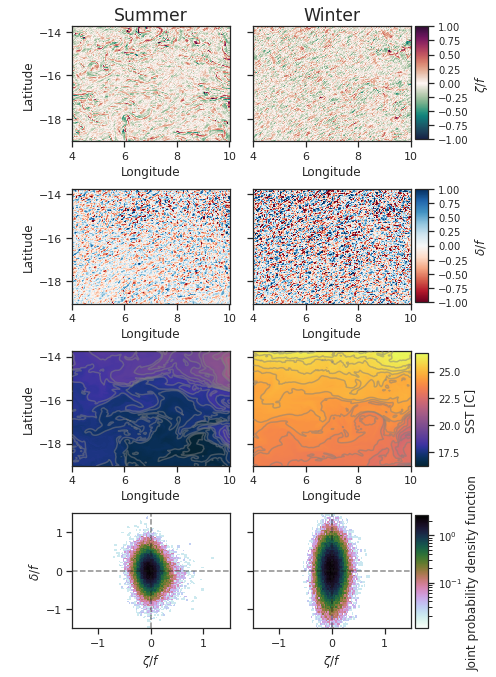

In [42]:
plot_rvdiv_seasons("Benguela")

In [122]:
def plot_rvdiv_daynight(current, season, dayIdx=0, timezone=0):
  #rid = ids_regions[current][-2]
  rows,cols = 3,2
  fig = plt.figure(figsize=(8,9))
  
  for rid in ids_regions[current][1:2]:
    print(current,ids_regions[current],rid)
    grid = VorticityGrid(rid)
    # DAY
    idx_t_day = idx_t["hours"][season][dayIdx - timezone]
    region_day = LLCRegion(rid, [idx_t_day], tag=season)
    time_sim_day = simulationTime(idx_t_day)
    print("Day", dayIdx - timezone, idx_t_day, time_sim_day)
    ujfm,vjfm = uv4idt(rid,idx_t_day,0)
    #ro_day = grid.rv(ujfm,vjfm)/grid.f
    #delta_day = grid.div(ujfm,vjfm)/grid.f
    # NIGHT
    nightIdx = dayIdx - timezone + 12
    idx_t_night = idx_t["hours"][season][nightIdx]
    region_night = LLCRegion(rid, [idx_t_night], tag=season)
    time_sim_night = simulationTime(idx_t_night)
    print("Night", nightIdx, idx_t_night, time_sim_night)
    spectra_tmp = load_spectra(rid,season)
    Lt = spectra_tmp["Lt_km"]
    
    # RV and DIV filtered
    _,_,rohi_day,delhi_day = get_ro_delta(region_day, Lt)
    _,_,rohi_night,delhi_night = get_ro_delta(region_night, Lt)
    
    ### Plot
    
    ax0 = fig.add_subplot(rows,cols,1)
    plt.title("5 pm",size='xx-large')
    ro_day = rohi_day[0,:,:]
    plt.pcolormesh(grid.lon_g,grid.lat_g,ro_day,norm=divnorm_deltaro,cmap=cmocean.cm.curl)
    plt.xlabel("Longitude", size='large')
    plt.ylabel("Latitude", size='large')
    ax1 = fig.add_subplot(rows,cols,2,sharey=ax0)
    plt.setp(ax1.get_yticklabels(), visible=False)
    plt.title("5 am",size='xx-large')
    ro_night = rohi_night[0,:,:]
    plt.pcolormesh(grid.lon_g,grid.lat_g,ro_night,norm=divnorm_deltaro,cmap=cmocean.cm.curl)
    plt.xlabel("Longitude", size='large')
    cax = plt.axes([0.97, 0.714, cbar_w, cbar_h])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='medium')
    cb.set_label('$\zeta/f$')
    
    ax2 = fig.add_subplot(rows,cols,3,sharex=ax0)
    delta_day = delhi_day[0,:,:]
    plt.pcolormesh(grid.lon_c,grid.lat_c,delta_day,norm=divnorm_deltaro,cmap=plt.cm.RdBu)
    plt.xlabel("Longitude", size='large')
    plt.ylabel("\nLatitude", size='large')
    ax3 = fig.add_subplot(rows,cols,4,sharex=ax1,sharey=ax2)
    plt.setp(ax3.get_yticklabels(), visible=False)
    delta_night = delhi_night[0,:,:]
    plt.pcolormesh(grid.lon_c,grid.lat_c,delta_night,norm=divnorm_deltaro,cmap=plt.cm.RdBu)
    plt.xlabel("Longitude", size='large')
    cax = plt.axes([0.97, 0.396, cbar_w, cbar_h])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='medium')
    cb.set_label('$\delta/f$')
    
    ## Theta
    #theta_day = theta4idt(rid,idx_t_day,0)
    #theta_night = theta4idt(rid,idx_t_night,0)
    #min_theta = min(np.min(theta_day),np.min(theta_night))
    #max_theta = max(np.max(theta_day),np.max(theta_night))
    #norm_theta = Normalize(vmin=min_theta ,vmax=max_theta)
    #ax4 = fig.add_subplot(rows,cols,5,sharex=ax0)
    #plt.pcolormesh(grid.lon_c,grid.lat_c,theta_day,norm=norm_theta,cmap=cmocean.cm.thermal)
    #plt.xlabel("Longitude", size='large')
    #plt.ylabel("Latitude", size='large')
    #ax5 = fig.add_subplot(rows,cols,6,sharex=ax1,sharey=ax4)
    #plt.setp(ax5.get_yticklabels(), visible=False)
    #plt.pcolormesh(grid.lon_c,grid.lat_c,theta_night,norm=norm_theta,cmap=cmocean.cm.thermal)
    #plt.xlabel("Longitude", size='large')
    #cax = plt.axes([0.97, 0.312, cbar_w, cbar_h])
    #cb = plt.colorbar(cax=cax)
    #cb.ax.tick_params(labelsize='medium')
    #cb.set_label('SST [C]')
    
    # Wind
    #taux_day,tauy_day = tau4idt(rid,idx_t_day,0)
    #taux_night,tauy_night = tau4idt(rid,idx_t_night,0)
    #taunorm_day = np.sqrt(taux_day**2 + tauy_day**2)
    #taunorm_night = np.sqrt(taux_night**2 + tauy_night**2)
    #min_tau = min(np.min(taunorm_day),np.min(taunorm_night))
    #max_tau = max(np.max(taunorm_day),np.max(taunorm_night))
    #norm_tau = Normalize(vmin=min_tau ,vmax=max_tau)
    #plt.sca(ax[6])
    #plt.quiver(grid.lon_c[::nn,::nn],grid.lat_c[::nn,::nn],taux_day[::nn,::nn]/max_tau,tauy_day[::nn,::nn]/max_tau,angles='xy',scale_units='xy',scale=3.,color='white',zorder=10,alpha=0.75)
    #plt.pcolormesh(grid.lon_c,grid.lat_c,taunorm_day,norm=norm_tau,cmap=cmocean.cm.speed)
    #plt.title("Wind stress: 5 pm @ {} ({}) - mean = {:0.2g}".format(rid,current, np.mean(taunorm_day)))
    #plt.colorbar()
    #plt.sca(ax[7])
    #plt.quiver(grid.lon_c[::nn,::nn],grid.lat_c[::nn,::nn],taux_night[::nn,::nn]/max_tau,tauy_night[::nn,::nn]/max_tau,angles='xy',scale_units='xy',scale=3.,color='white',zorder=10,alpha=0.75)
    #plt.pcolormesh(grid.lon_c,grid.lat_c,taunorm_night,norm=norm_tau,cmap=cmocean.cm.speed)
    #plt.title("Wind stress: 5 am @ {} ({}) - mean = {:0.2g}".format(rid,current, np.mean(taunorm_night)))
    #plt.colorbar()
    
    # Joint PDF
    min_ro = min(np.min(ro_day),np.min(ro_night))
    max_ro = max(np.max(ro_day),np.max(ro_night))
    min_delta = min(np.min(delta_day),np.min(delta_night))
    max_delta = max(np.max(delta_day),np.max(delta_night))
    rolim = [min_ro,max_ro]
    deltalim = [min_delta,max_delta]
    #*plt.sca(ax[6])
    ax6 = fig.add_subplot(rows,cols,5)
    plt.hist2d(ro_day.flat[:],delta_day.flat[:],bins=100,density=True,norm=LogNorm(),cmap=plt.cm.cubehelix_r)
    plt.xlim([-1.5,1.5])
    plt.ylim([-1.5,1.5])
    plt.axvline(x=0,ls='--',c='k',alpha=0.5)
    plt.axhline(y=0,ls='--',c='k',alpha=0.5)
    plt.xlabel("${\zeta}/{f}$",size='large')
    plt.ylabel("${\delta}/{f}$",size='large')
    ax7 = fig.add_subplot(rows,cols,6, sharey=ax6)
    plt.setp(ax7.get_yticklabels(), visible=False)
    plt.hist2d(ro_night.flat[:],delta_night.flat[:],bins=100,density=True,norm=LogNorm(),cmap=plt.cm.cubehelix_r)
    plt.xlim([-1.5,1.5])
    plt.ylim([-1.5,1.5])
    plt.axvline(x=0,ls='--',c='k',alpha=0.5)
    plt.axhline(y=0,ls='--',c='k',alpha=0.5)
    plt.xlabel("${\zeta}/{f}$",size='large')
    #plt.ylabel("JPDF\n${\delta}/{f}$",size='large')
    cax = plt.axes([0.97, 0.079, cbar_w, cbar_h])
    cb = plt.colorbar(cax=cax)
    cb.ax.tick_params(labelsize='medium')
    cb.set_label('Joint probability density function')

    # Shared xy labels
    fig.tight_layout()

    plt.savefig("figs/{}_snaps_{}_daynight.pdf".format(current,season), bbox_inches='tight')
    plt.show()

California [868, 852, 831, 809, 787, 762] 852


2021-07-07 17:16:19 INFO     Grid: dx = 1.5383772590277776 km, dy = 1.6505256729166673 km, dt = 1 h
2021-07-07 17:16:19 INFO     Exists? 852: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-07-07 17:16:19 DEBUG    852: _ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-07-07 17:16:19 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']


Day 1441 9193 2012-09-30 01:00:00+00:00


2021-07-07 17:16:20 INFO     Grid: dx = 1.5383772590277776 km, dy = 1.6505256729166673 km, dt = 1 h
2021-07-07 17:16:20 INFO     Exists? 852: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-07-07 17:16:20 DEBUG    852: _ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-07-07 17:16:20 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 17:16:20 DEBUG    852: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_ASO_hours.npz
2021-07-07 17:16:20 INFO     Loading U: shape (k=0): (288, 288, 1)


Night 1453 9205 2012-09-30 13:00:00+00:00


2021-07-07 17:16:20 DEBUG    Geting result U - 1/4
2021-07-07 17:16:20 DEBUG    Loading U (thread: 08ace573-d65a-412c-89a9-61f7444d94bf): shape (k=0): (288, 288, 1)
2021-07-07 17:16:20 DEBUG    Loading U (thread: e312cb6d-6ce6-4d08-8af6-4a762b210378): shape (k=0): (288, 288, 0)
2021-07-07 17:16:20 DEBUG    Loading U (thread: ff8ee999-aff4-4da2-a752-bf06ade4f74b): shape (k=0): (288, 288, 0)
2021-07-07 17:16:20 DEBUG    Loading U (thread: fc1de629-7aaa-40c9-bca7-2419dc003e02): shape (k=0): (288, 288, 0)
2021-07-07 17:16:20 DEBUG    Got result U - 1/4
2021-07-07 17:16:20 DEBUG    Geting result U - 2/4
2021-07-07 17:16:20 DEBUG    Got result U - 2/4
2021-07-07 17:16:20 DEBUG    Geting result U - 3/4
2021-07-07 17:16:20 DEBUG    Got result U - 3/4
2021-07-07 17:16:20 DEBUG    Geting result U - 4/4
2021-07-07 17:16:20 DEBUG    Got result U - 4/4
2021-07-07 17:16:20 INFO     Loading V: shape (k=0): (288, 288, 1)
2021-07-07 17:16:20 DEBUG    Geting result V - 1/4
2021-07-07 17:16:20 DEBUG    L

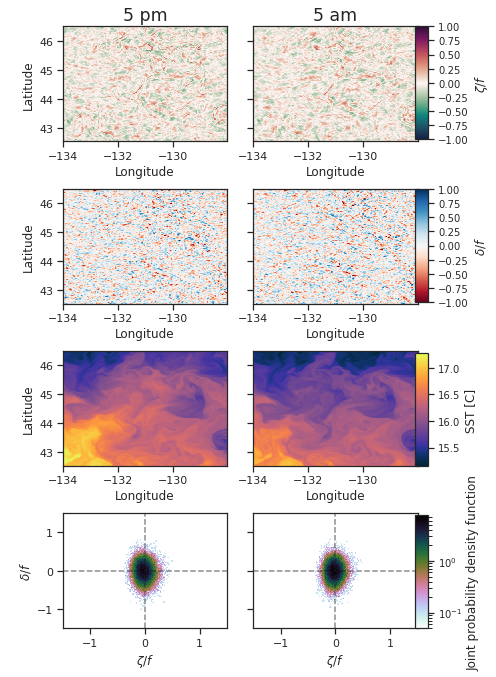

California [868, 852, 831, 809, 787, 762] 852


2021-07-07 17:16:24 INFO     Grid: dx = 1.5383772590277776 km, dy = 1.6505256729166673 km, dt = 1 h
2021-07-07 17:16:24 INFO     Exists? 852: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-07-07 17:16:24 DEBUG    852: _JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-07-07 17:16:24 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']


Day 1441 4081 2012-03-01 01:00:00+00:00


2021-07-07 17:16:25 INFO     Grid: dx = 1.5383772590277776 km, dy = 1.6505256729166673 km, dt = 1 h
2021-07-07 17:16:25 INFO     Exists? 852: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-07-07 17:16:25 DEBUG    852: _JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-07-07 17:16:25 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-07 17:16:25 DEBUG    852: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/852_JFM_hours.npz
2021-07-07 17:16:25 INFO     Loading U: shape (k=0): (288, 288, 1)


Night 1453 4093 2012-03-01 13:00:00+00:00


2021-07-07 17:16:25 DEBUG    Geting result U - 1/4
2021-07-07 17:16:25 DEBUG    Loading U (thread: de2c0918-86c0-4b25-a973-e4cbb400de57): shape (k=0): (288, 288, 1)
2021-07-07 17:16:25 DEBUG    Loading U (thread: 369aaed8-7e98-4bb3-a12e-4b1d81beaac5): shape (k=0): (288, 288, 0)
2021-07-07 17:16:25 DEBUG    Loading U (thread: bef94e50-18ed-4a02-a89d-708548c74f96): shape (k=0): (288, 288, 0)
2021-07-07 17:16:25 DEBUG    Loading U (thread: c673f532-9cc0-4eb9-bdd8-71958b5905aa): shape (k=0): (288, 288, 0)
2021-07-07 17:16:25 DEBUG    Got result U - 1/4
2021-07-07 17:16:25 DEBUG    Geting result U - 2/4
2021-07-07 17:16:25 DEBUG    Got result U - 2/4
2021-07-07 17:16:25 DEBUG    Geting result U - 3/4
2021-07-07 17:16:25 DEBUG    Got result U - 3/4
2021-07-07 17:16:25 DEBUG    Geting result U - 4/4
2021-07-07 17:16:25 DEBUG    Got result U - 4/4
2021-07-07 17:16:25 INFO     Loading V: shape (k=0): (288, 288, 1)
2021-07-07 17:16:25 DEBUG    Geting result V - 1/4
2021-07-07 17:16:25 DEBUG    L

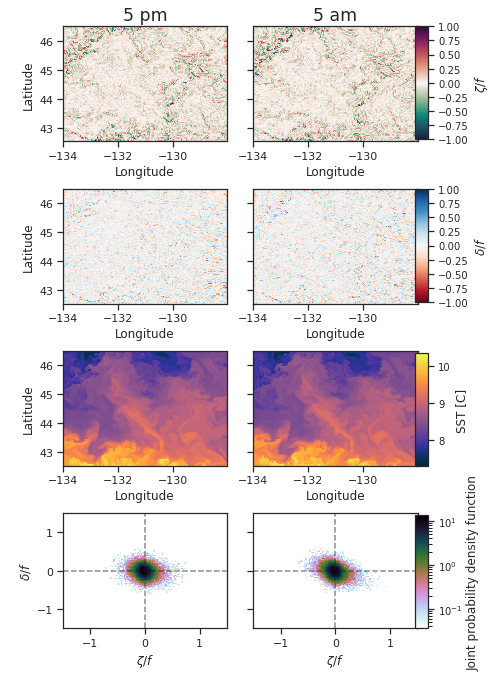

2021-07-07 17:16:27 INFO     762 (California): ASO_ext, (2012-09-23 01:00:00+00:00 to 2012-10-07 00:00:00+00:00)
2021-07-07 17:16:27 DEBUG    762: ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-07-07 17:16:27 INFO     Spectra file exists. Skipping.
2021-07-07 17:16:27 DEBUG    762: ASO -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_ASO_hours.npz
2021-07-07 17:16:28 INFO     762 (California): ASO_ext, Lt = 115.97
2021-07-07 17:16:28 INFO     762: ASO_ext (style=full) -- Ensuring
2021-07-07 17:16:28 INFO     762: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-07-07 17:16:28 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz
2021-07-07 17:16:28 INFO     762: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (9025,9360)
2021-07-07 17:16:28 INFO     762: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_ASO_ext_hours.npz


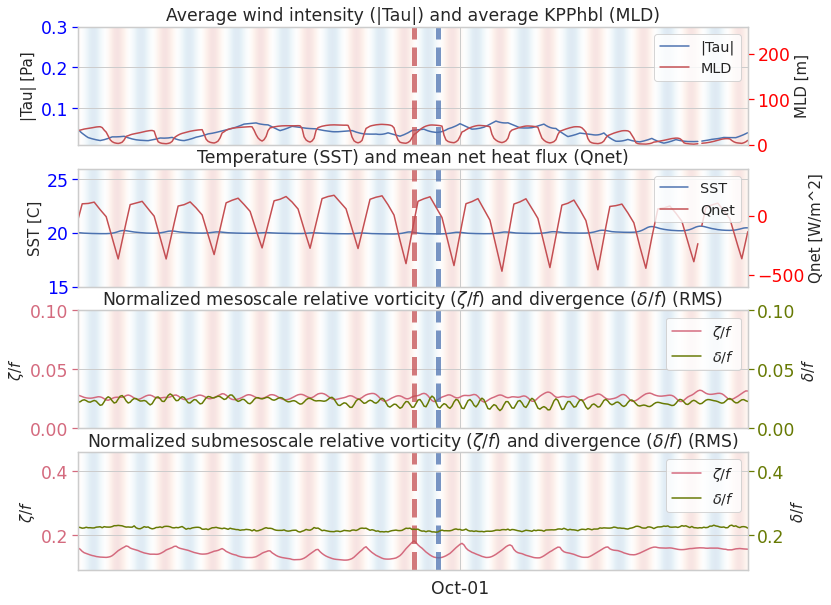

2021-07-07 17:16:30 INFO     762 (California): JFM_ext, (2012-02-23 01:00:00+00:00 to 2012-03-08 00:00:00+00:00)
2021-07-07 17:16:30 DEBUG    762: JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-07-07 17:16:30 INFO     Spectra file exists. Skipping.
2021-07-07 17:16:30 DEBUG    762: JFM -- Opening /mnt/disks/LLC4320/Postprocess/wk_spectra/762_JFM_hours.npz
2021-07-07 17:16:30 INFO     762 (California): JFM_ext, Lt = 32.0
2021-07-07 17:16:30 INFO     762: JFM_ext (style=full) -- Ensuring
2021-07-07 17:16:30 INFO     762: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-07-07 17:16:30 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz
2021-07-07 17:16:30 INFO     762: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes what we need (3913,4248)
2021-07-07 17:16:30 INFO     762: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/762_JFM_ext_hours.npz


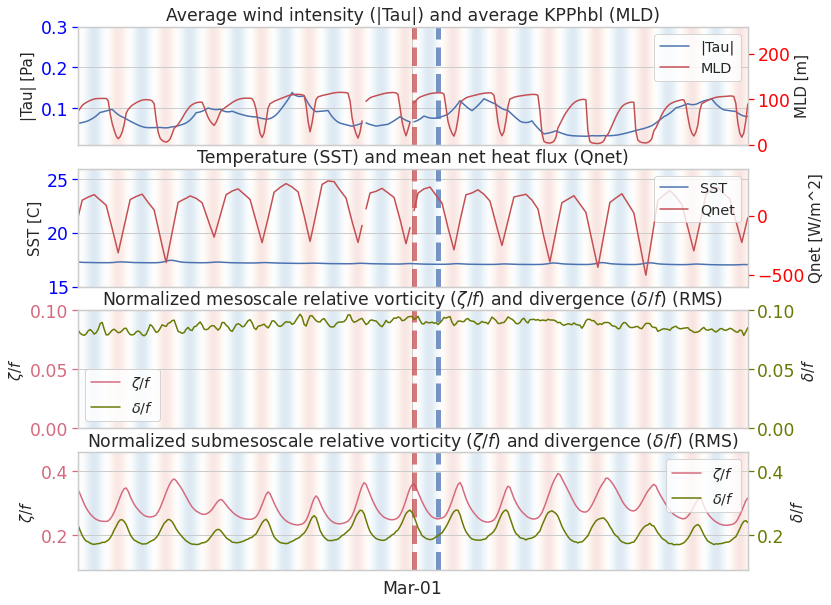

In [44]:
snapshot_t = 24*60+17
tzone = - 8
curr_ = "California"
plot_rvdiv_daynight(curr_, "ASO", snapshot_t, tzone)
plot_rvdiv_daynight(curr_, "JFM", snapshot_t, tzone)
plot_stats(curr_, slice(snapshot_t-7*24-tzone, snapshot_t+7*24-tzone), snapshot_t-tzone)

Canarias [771, 750, 730, 709] 750


2021-07-23 12:31:03 INFO     Grid: dx = 2.0694956027777773 km, dy = 1.902540301736111 km, dt = 1 h
2021-07-23 12:31:03 INFO     Exists? 750: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-07-23 12:31:03 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']


Day 1457 9209 2012-09-30 17:00:00+00:00


2021-07-23 12:31:03 INFO     Grid: dx = 2.0694956027777773 km, dy = 1.902540301736111 km, dt = 1 h
2021-07-23 12:31:03 INFO     Exists? 750: _ASO -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_ASO_hours.npz
2021-07-23 12:31:03 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-23 12:31:03 INFO     Loading U: shape (k=0): (288, 289, 1)


Night 1469 9221 2012-10-01 05:00:00+00:00


2021-07-23 12:31:03 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-23 12:31:04 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:31:04 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:31:04 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:31:04 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:31:04 INFO     Loading U: shape (k=0): (288, 289, 1)
2021-07-23 12:31:04 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-23 12:31:04 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:31:04 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:31:04 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:31:04 INFO     kxky -- Lx: 578, Ly: 576


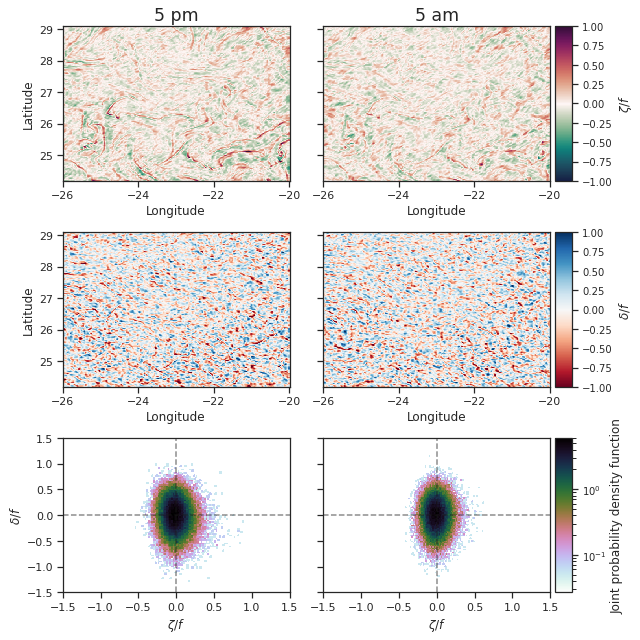

Canarias [771, 750, 730, 709] 750


2021-07-23 12:32:02 INFO     Grid: dx = 2.0694956027777773 km, dy = 1.902540301736111 km, dt = 1 h
2021-07-23 12:32:02 INFO     Exists? 750: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-07-23 12:32:02 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']


Day 1457 4097 2012-03-01 17:00:00+00:00


2021-07-23 12:32:02 INFO     Grid: dx = 2.0694956027777773 km, dy = 1.902540301736111 km, dt = 1 h
2021-07-23 12:32:02 INFO     Exists? 750: _JFM -- Filename /mnt/disks/LLC4320/Postprocess/wk_spectra/750_JFM_hours.npz
2021-07-23 12:32:02 INFO     Spectra - Variables: ['om', 'k_h', 'KE', 'KE_RV', 'KE_DIV', 'KE_k', 'RV_k', 'DIV_k', 'Lt_km']
2021-07-23 12:32:02 INFO     Loading U: shape (k=0): (288, 289, 1)


Night 1469 4109 2012-03-02 05:00:00+00:00


2021-07-23 12:32:03 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-23 12:32:03 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:32:03 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:32:03 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:32:03 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:32:03 INFO     Loading U: shape (k=0): (288, 289, 1)
2021-07-23 12:32:03 INFO     Loading V: shape (k=0): (288, 289, 1)
2021-07-23 12:32:03 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:32:03 INFO     kxky -- Lx: 578, Ly: 576
2021-07-23 12:32:03 INFO     kxky -- Nx: 289, Ny: 288
2021-07-23 12:32:03 INFO     kxky -- Lx: 578, Ly: 576


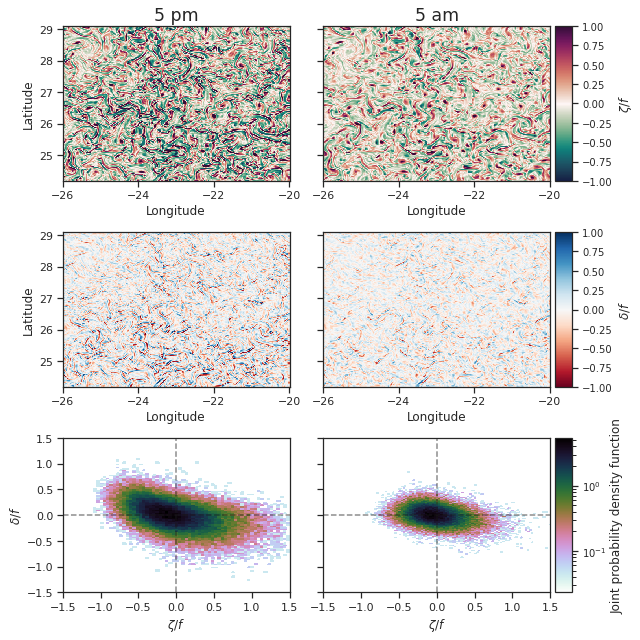

2021-07-23 12:32:57 INFO     750 (Canary): ASO_ext, (2012-09-23 17:00:00+00:00 to 2012-10-07 16:00:00+00:00)
2021-07-23 12:32:57 INFO     Spectra file exists. Skipping.
2021-07-23 12:32:57 INFO     750 (Canary): ASO_ext, Lt = 73.42
2021-07-23 12:32:57 INFO     750: ASO_ext (style=full) -- Ensuring
2021-07-23 12:32:57 INFO     750: ASO_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-07-23 12:32:57 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz
2021-07-23 12:32:57 INFO     750: ASO_ext -- File exists for the same parameters, and time slice (7752,10295) at least includes what we need (9041,9376)
2021-07-23 12:32:57 INFO     750: ASO_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_ASO_ext_hours.npz


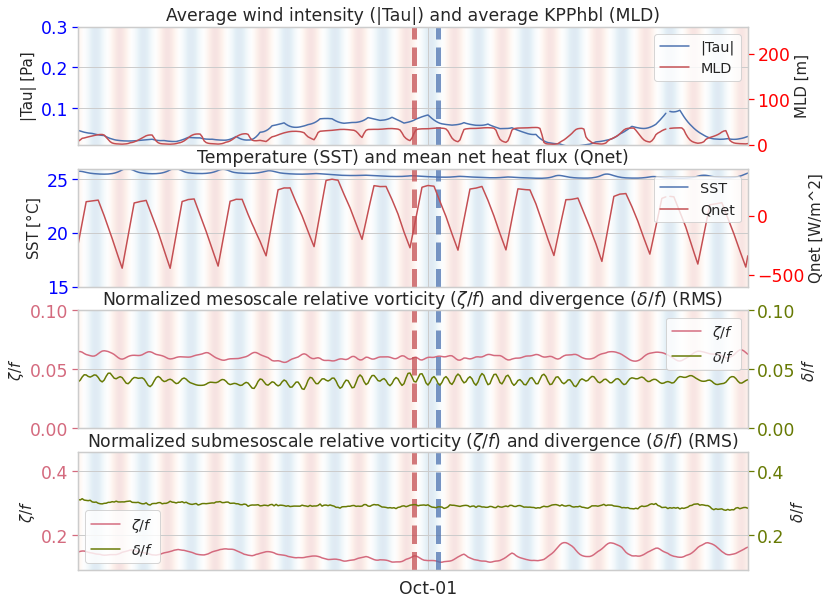

2021-07-23 12:33:00 INFO     750 (Canary): JFM_ext, (2012-02-23 17:00:00+00:00 to 2012-03-08 16:00:00+00:00)
2021-07-23 12:33:00 INFO     Spectra file exists. Skipping.
2021-07-23 12:33:00 INFO     750 (Canary): JFM_ext, Lt = 60.0
2021-07-23 12:33:00 INFO     750: JFM_ext (style=full) -- Ensuring
2021-07-23 12:33:00 INFO     750: JFM_ext -- Filename /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-07-23 12:33:00 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz
2021-07-23 12:33:00 INFO     750: JFM_ext -- File exists for the same parameters, and time slice (2640,5543) at least includes what we need (3929,4264)
2021-07-23 12:33:00 INFO     750: JFM_ext -- Opening /mnt/disks/LLC4320/Luigi/stats/750_JFM_ext_hours.npz


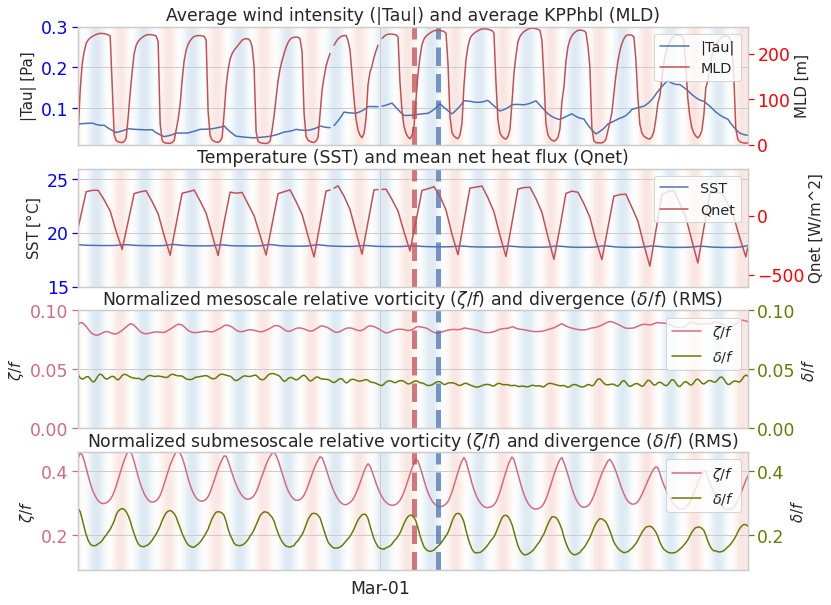

In [123]:
snapshot_t = 24*60+17
tzone = 0
curr_ = "Canarias"
plot_rvdiv_daynight(curr_, "ASO", snapshot_t, tzone)
plot_rvdiv_daynight(curr_, "JFM", snapshot_t, tzone)
plot_stats("Canary", slice(snapshot_t-7*24-tzone, snapshot_t+7*24-tzone), snapshot_t-tzone)

In [ ]:
snapshot_t = 24*59+17
tzone = -4
curr_ = "Peru"
plot_rvdiv_daynight(curr_, "ASO", snapshot_t, tzone)
plot_rvdiv_daynight(curr_, "JFM", snapshot_t, tzone)
plot_stats(curr_, slice(snapshot_t-7*24-tzone, snapshot_t+7*24-tzone), snapshot_t-tzone)

In [ ]:
snapshot_t = 24*59+17
tzone = 1
curr_ = "Benguela"
plot_rvdiv_daynight(curr_, "ASO", snapshot_t, tzone)
plot_rvdiv_daynight(curr_, "JFM", snapshot_t, tzone)
plot_stats(curr_, slice(snapshot_t-7*24-tzone, snapshot_t+7*24-tzone), snapshot_t-tzone)

# Lt plots as a function of latitude

In [121]:
LtWinter = [40.0,46.07,35.12,40.74,32.0,32.0,67.0,62.0,64.0,66.59,63.99,61.84,76.0,64.44,64.19,61.3]
LtSummer = [97.35,118.24,140.81,91.37,107.77,116.23,70.06,73.42,77.7,129.32,77.2,74.31,66.36,125.72,122.71,78.7]
Lats = [48.4,44.5,40.4,36.05,31.46,26.64,31.46,26.64,21.61,16.40,-16.39,-21.61,-40.41,-11.03,-16.39,-26.64]
Regions = [868,852,831,809,787,762,771,750,730,709,596,572,450,602,578,533]
Colors = ['g','g','g','g','g','g','r','r','r','r','k','k','k','c','c','c']

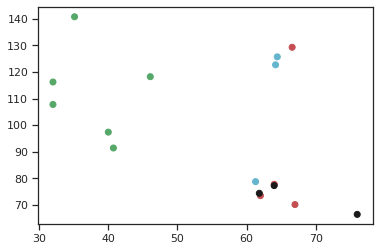

In [122]:
plt.figure()
plt.scatter(LtWinter,LtSummer,c=Colors)
plt.show()

In [60]:
def numbindecimals(n):
    (m,exponent) = frexp(n)
    decimals = 0
    while m>0:
        print(m)
        decimals+=1
        m,_ = modf(2*m)
    return decimals

In [68]:
numbindecimals(85.125)

0.6650390625
0.330078125
0.66015625
0.3203125
0.640625
0.28125
0.5625
0.125
0.25
0.5


10

In [219]:
import pandas as pd

In [221]:
lags = pd.read_csv('lags.csv')
lags

,current,lat,lag_summer,coherence_summer,lag_winter,coherence_winter
0,California,48.40,-0.14,0.69,3.31,0.93
1,California,44.50,10.77,0.15,3.40,0.95
2,California,40.40,4.23,0.00,3.03,0.95
3,California,36.05,2.34,0.80,2.68,0.95
4,California,31.46,3.34,0.65,2.60,0.98
5,California,26.64,1.42,0.75,2.72,0.99
6,Canarias,31.46,2.49,0.75,3.50,0.99
7,Canarias,26.64,2.08,0.61,3.35,0.99
8,Canarias,21.61,-1.80,0.29,2.94,0.99
9,Canarias,16.40,-4.12,0.41,2.32,0.98


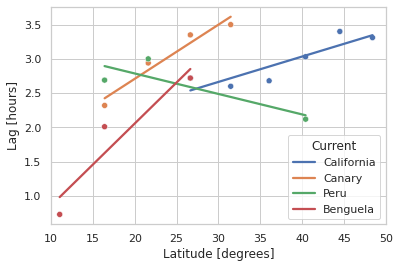

In [270]:
with sns.axes_style("whitegrid"):
  #plt.figure(figsize=(6,4))
  plt.figure()
  axx = plt.gca()
  sns.scatterplot(x='lat', y='lag_winter', hue='current', data=lags, ax=axx)
  for _,curr in curr4id.items():
    curr_ds = lags[lags["current"]==curr]
    sns.regplot(x='lat', y='lag_winter', data=curr_ds, ax=axx, scatter=False, robust=True, ci=None)
  axx.set(xlim=(10,50),xlabel="Latitude [degrees]",ylabel="Lag [hours]")
  currNames = [curr for _,curr in curr4id.items()]
  currNames[1] = "Canary"
  axx.legend(currNames, title='Current')
  plt.show()